# **Telco Customer Churn**

# **1. Business Problem Understanding**

This dataset comes from a telecommunications company that wants to understand and predict customer churn, which is when a customer stops using the service and moves to another provider. The telecom industry is very competitive, with many companies offering similar packages, pricing, and features. Because of this, keeping existing customers is just as important as attracting new ones.

The goal of this machine learning project is to identify which customers are most likely to leave, so the company can take early action to retain them and reduce churn.

The dataset includes a range of customer information, such as whether they have dependents, how long they’ve been with the company, and whether they use services like online security, online backup, device protection, and tech support. It also includes the type of internet service they use, their contract type, whether they receive paperless billing, and their monthly charges.

According to a Harvard Business Review article, acquiring a new customer can cost five to seven times more than keeping an existing one. While bringing in new customers helps grow the customer base, retaining current customers helps increase their long-term value. For this project, we will assume the cost of customer retention is $1, while the cost of acquiring a new customer is $7.

Source: https://hbr.org/2014/10/the-value-of-keeping-the-right-customers

# **Target and Metric**

# Defining the Target and Evaluation Metric

## Identifying Which Customers Are Likely to Churn

We will use **Recall** as the main evaluation metric.

> Why Recall?  
It helps identify as many actual churners as possible. A high recall means your model doesn’t miss many customers who are likely to leave.

### Target Values:
- `0` = Customer did **not churn** (Retained)
- `1` = Customer **churned** (Left)

---

## Confusion Matrix for Churn Prediction

| Prediction        | Actual           | Interpretation                     |
|------------------|------------------|------------------------------------|
| Churn (1)        | Churn (1)        | ✅ **True Positive (TP)** — correctly predicted a churner  
| Not Churn (0)    | Not Churn (0)    | ✅ **True Negative (TN)** — correctly predicted a loyal customer  
| Churn (1)        | Not Churn (0)    | ❌ **False Positive (FP)** — predicted churn, but customer stayed  
| Not Churn (0)    | Churn (1)        | ❌ **False Negative (FN)** — missed a real churner

### ⚠️ Business Risk:
- **False Positives (FP)**: Wasted effort on retention, but may improve customer loyalty.
- **False Negatives (FN)**: Costly. You lose real customers without even trying to retain them.

> Reducing **False Negatives (FN)** is more critical for the business.  
It’s cheaper to retain customers than to acquire new ones.  
Accurate prediction = smarter customer retention strategy.

---

# 💰 Estimating Potential Savings

To estimate the financial impact of using a churn prediction model:

## 1. Cost Without Model:

Cost = Number of Actual Churns × Acquisition Cost


## 2. Cost With Model:
- **TP Cost** = TP × Retention Cost  
- **FP Cost** = FP × Retention Cost  
- **FN Cost** = FN × Acquisition Cost  

Total Cost With Model = TP Cost + FP Cost + FN Cost


## 3. Total Savings:

Savings = Cost Without Model - Cost With Model



# 🔍 Understanding Why Customers Churn

To discover what drives churn:

- Use **Feature Importance** from your model
- Use **SHAP values** for deeper interpretation

SHAP not only shows **which features matter most**, but also explains **how they influence each customer’s prediction**.

> Example insights:  
  - High monthly charges → Higher churn risk  
  - Longer tenure → Lower churn risk



# **About the Dataset**

---
To address the problem mentioned above, we are using dataset available from the TIBM data_telco_customer_churn. The dataset used is as follows:<br>


| Key              | Description                                                   |
|------------------|---------------------------------------------------------------|
| Dependents       |  Whether the customer has dependents or not.                  |
| Tenure           |  Number of months the customer has   stayed with the company. |
| OnlineSecurity   |  Whether the customer has online   security or not.           |
| OnlineBackup     |  Whether the customer has online   backup or not.             |
| InternetService  |  Whether the client is subscribed   to Internet service.      |
| DeviceProtection |  Whether the client has device   protection or not.           |
| TechSupport      |  Whether the client has tech   support or not                 |
| Contract         |  Type of contract according to   duration.                    |
| PaperlessBilling |  Bills issued in paperless form.                              |
| MonthlyCharges   |  Amount of charge for service on   monthly bases.             |
| Churn            |  Whether the customer churns or   not.                        |


In [130]:
# ========================
# Basic Libraries
# ========================
import pandas as pd
import numpy as np
import warnings

# ========================
# Visualization
# ========================
import matplotlib.pyplot as plt
import seaborn as sns

# ========================
# Display Settings
# ========================
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
warnings.filterwarnings("ignore")

# ========================
# Data Loading
# ========================
df = pd.read_csv('data_telco_customer_churn.csv')

# ========================
# Preprocessing & Feature Engineering
# ========================
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, RobustScaler, MinMaxScaler, StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer

from category_encoders import BinaryEncoder, OrdinalEncoder

# ========================
# Resampling for Imbalanced Data
# ========================
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss, EditedNearestNeighbours
from imblearn.combine import SMOTEENN
from imblearn.pipeline import Pipeline  # Use this when combining resampling with modeling

# ========================
# Machine Learning Models
# ========================
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, 
    GradientBoostingClassifier, 
    AdaBoostClassifier
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# ========================
# Model Selection & Evaluation
# ========================
from sklearn.model_selection import (
    train_test_split, 
    cross_val_score, 
    cross_validate, 
    StratifiedKFold, 
    GridSearchCV, 
    RandomizedSearchCV
)
from sklearn.metrics import (
    f1_score, 
    confusion_matrix, 
    accuracy_score, 
    precision_score, 
    recall_score, 
    ConfusionMatrixDisplay
)


In [131]:
# Count and Datatype for each Column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4930 entries, 0 to 4929
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Dependents        4930 non-null   object 
 1   tenure            4930 non-null   int64  
 2   OnlineSecurity    4930 non-null   object 
 3   OnlineBackup      4930 non-null   object 
 4   InternetService   4930 non-null   object 
 5   DeviceProtection  4930 non-null   object 
 6   TechSupport       4930 non-null   object 
 7   Contract          4930 non-null   object 
 8   PaperlessBilling  4930 non-null   object 
 9   MonthlyCharges    4930 non-null   float64
 10  Churn             4930 non-null   object 
dtypes: float64(1), int64(1), object(9)
memory usage: 423.8+ KB


In [132]:
df.describe()

,tenure,MonthlyCharges
count,4930.000000,4930.000000
mean,32.401217,64.883032
std,24.501193,29.923960
min,0.000000,18.800000
25%,9.000000,37.050000
50%,29.000000,70.350000
75%,55.000000,89.850000
max,72.000000,118.650000


In [133]:
df.isnull().sum()

Dependents          0
tenure              0
OnlineSecurity      0
OnlineBackup        0
InternetService     0
DeviceProtection    0
TechSupport         0
Contract            0
PaperlessBilling    0
MonthlyCharges      0
Churn               0
dtype: int64

based on the table above, there are no missing values

In [134]:
df.duplicated().sum()

77

based on the table above, there are 77 duplicated rows. We will handle them later on

# **2. EDA**

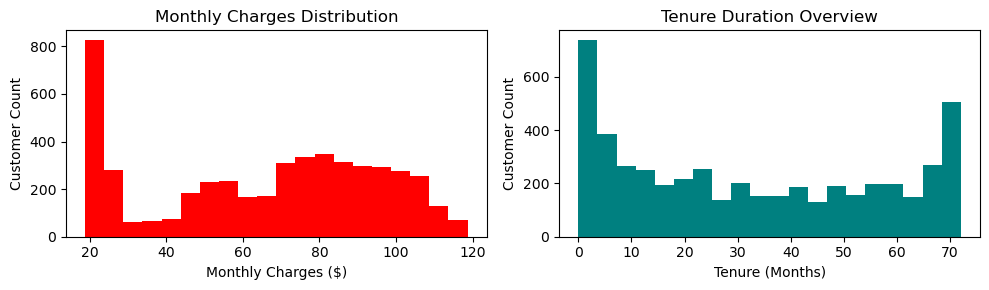

In [135]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 3))

# Plot 1: Monthly Charges (now on the left, with red color)
plt.subplot(1, 2, 1)
plt.hist(df['MonthlyCharges'], bins=20, color='red')
plt.title('Monthly Charges Distribution')
plt.xlabel('Monthly Charges ($)')
plt.ylabel('Customer Count')

# Plot 2: Tenure (now on the right, with teal color)
plt.subplot(1, 2, 2)
plt.hist(df['tenure'], bins=20, color='teal')
plt.title('Tenure Duration Overview')
plt.xlabel('Tenure (Months)')
plt.ylabel('Customer Count')

plt.tight_layout()
plt.show()

### Distribution Insights

#### Distribution of Tenure
- A large number of customers have very short tenure (0–5 months), while another peak appears around 70 months.
- There is a noticeable drop in customer count in the mid-tenure range (around 20–60 months).
- This suggests that customers tend to either leave early or remain loyal for a long time.
- Improving customer experience during the mid-tenure phase may help increase long-term retention.

#### Distribution of Monthly Charges
- Most customers are paying lower monthly charges, particularly between $20 and $30.
- Customers with monthly charges above $100 are relatively few.
- The distribution is more balanced between $40 and $90.
- This indicates that the customer base may be sensitive to pricing, with many opting for more affordable service plans.


Churn
No     3614
Yes    1316
Name: count, dtype: int64


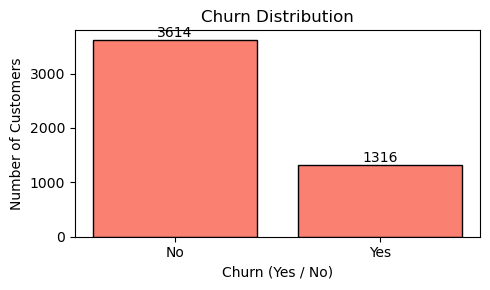

In [136]:
import matplotlib.pyplot as plt

# Count the values
churn_counts = df['Churn'].value_counts()
print(churn_counts)  # This prints the exact numbers: Yes and No

# Plot
plt.figure(figsize=(5, 3))
bars = plt.bar(churn_counts.index, churn_counts.values, color='salmon', edgecolor='black')
plt.title('Churn Distribution')
plt.xlabel('Churn (Yes / No)')
plt.ylabel('Number of Customers')

# Annotate numbers on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 10, int(yval), ha='center', va='bottom')

plt.tight_layout()
plt.show()


### Churn Distribution Insight

- Out of the total customers, 3,614 did not churn while 1,316 did.
- This means around **27% of customers have churned**, while **73% have stayed**.
- The dataset is **imbalanced**, with significantly more non-churned customers.
- This imbalance should be addressed during model building, for example, by applying techniques like oversampling, undersampling, or using class-weighted algorithms.

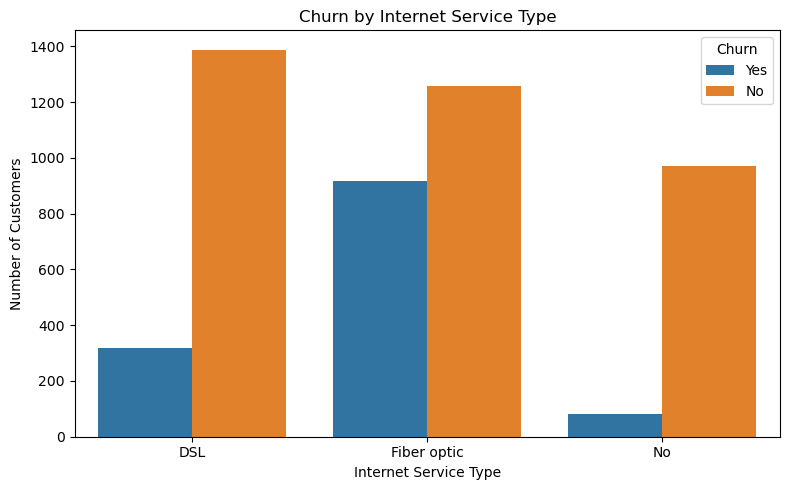

In [137]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x='InternetService', hue='Churn')
plt.title('Churn by Internet Service Type')
plt.xlabel('Internet Service Type')
plt.ylabel('Number of Customers')
plt.legend(title='Churn')
plt.tight_layout()
plt.show()


### Churn by Internet Service Type

- Customers with **Fiber optic** internet have a noticeably higher churn count compared to those with **DSL** or **No internet service**.
- **DSL** customers show much lower churn numbers relative to their total.
- Customers with **No internet service** rarely churn, suggesting a more stable or minimal usage group.

**Key Insight:**
- Fiber optic customers may be more likely to churn, possibly due to higher costs or service expectations.
- This indicates that customers using premium internet services might require more focused retention strategies.

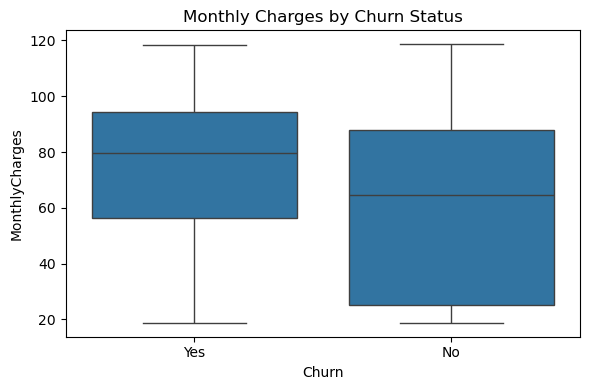

In [138]:
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.boxplot(x='Churn', y='MonthlyCharges', data=df)
plt.title('Monthly Charges by Churn Status')
plt.tight_layout()
plt.show()

### Monthly Charges by Churn Status

- Customers who **churned** tend to have **higher monthly charges** on average compared to those who stayed.
- The median monthly charge for churned customers is visibly higher than that of non-churned customers.
- The spread of charges (interquartile range) is also wider for customers who churned.

**Key Insight:**
- Higher monthly charges may be a contributing factor to customer churn.
- This suggests that cost-sensitive customers are more likely to leave, especially if they perceive they are not receiving adequate value for the price.
- Strategies such as offering tailored discounts or value-added services could help reduce churn among high-paying customers.

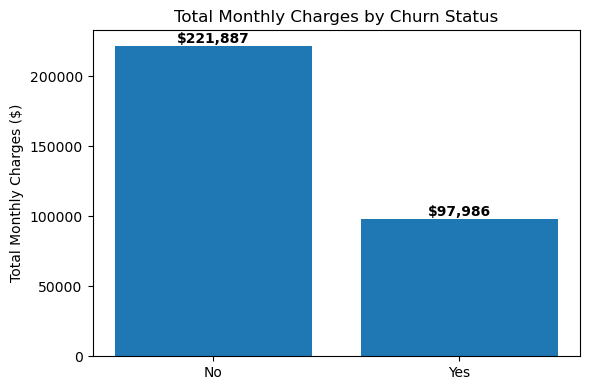

In [139]:
# Group by churn and sum MonthlyCharges
total_charges = df.groupby('Churn')['MonthlyCharges'].sum()

# Plot
plt.figure(figsize=(6,4))
bars = plt.bar(total_charges.index, total_charges.values)

# Add text labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        height,
        f'${height:,.0f}',  # comma separator and no decimals
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

plt.title('Total Monthly Charges by Churn Status')
plt.ylabel('Total Monthly Charges ($)')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


The chart shows that customers who stayed with the company bring in about $220,473 in monthly revenue, while those who left bring in only $96,532. This means that most of the company’s income comes from loyal customers. Even though fewer people leave, the money lost from churn is still quite large. This shows how important it is to keep customers happy and loyal. The company could reduce churn by offering better service, rewards, or longer contract options to help keep more customers from leaving.

**Checking for Outliers**

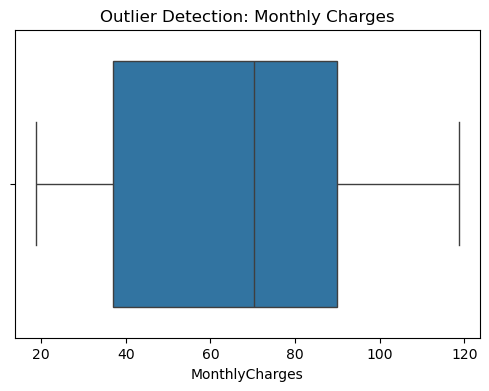

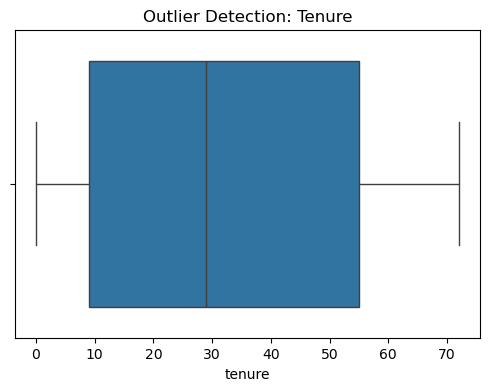

In [140]:
# Boxplot for MonthlyCharges
plt.figure(figsize=(6, 4))
sns.boxplot(x=df['MonthlyCharges'])
plt.title('Outlier Detection: Monthly Charges')
plt.show()

# Boxplot for tenure
plt.figure(figsize=(6, 4))
sns.boxplot(x=df['tenure'])
plt.title('Outlier Detection: Tenure')
plt.show()


### Outlier Detection: Monthly Charges and Tenure

#### Monthly Charges
- The boxplot shows that most values for monthly charges fall between approximately $30 and $100.
- There are **no significant outliers**, as all data points lie within the whiskers.
- This suggests a relatively even spread of monthly charges across customers.

#### Tenure
- Tenure values are distributed between 0 and 72 months.
- Similar to monthly charges, **no extreme outliers** are detected.
- The data shows a fairly balanced spread across different tenure lengths, with no unusually high or low values.

**Conclusion:**
- Both features, `MonthlyCharges` and `tenure`, do not show notable outliers.
- This indicates that the data is clean and likely does not require outlier removal for these variables before modeling.

In [141]:
# MonthlyCharges outliers
Q1_mc = df['MonthlyCharges'].quantile(0.25)
Q3_mc = df['MonthlyCharges'].quantile(0.75)
IQR_mc = Q3_mc - Q1_mc
outliers_mc = df[(df['MonthlyCharges'] < Q1_mc - 1.5 * IQR_mc) | (df['MonthlyCharges'] > Q3_mc + 1.5 * IQR_mc)]

# Tenure outliers
Q1_ten = df['tenure'].quantile(0.25)
Q3_ten = df['tenure'].quantile(0.75)
IQR_ten = Q3_ten - Q1_ten
outliers_tenure = df[(df['tenure'] < Q1_ten - 1.5 * IQR_ten) | (df['tenure'] > Q3_ten + 1.5 * IQR_ten)]

# Display summary
print(f'MonthlyCharges outliers: {len(outliers_mc)} rows')
print(f'Tenure outliers: {len(outliers_tenure)} rows')

MonthlyCharges outliers: 0 rows
Tenure outliers: 0 rows


**Percentage of Churn by Monthly Charge Ranges and Tenure**

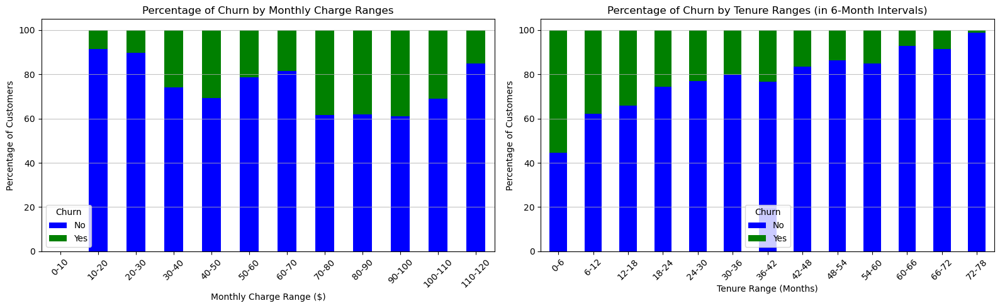

In [174]:
# Creating bins for Monthly Charges and Tenure
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120]
bin_labels = [f"{i}-{i + 10}" for i in bins[:-1]]
tenure_bins = [0, 6, 12, 18, 24, 30, 36, 42, 48, 54, 60, 66, 72, 78]
tenure_bin_labels = [f"{i}-{i + 6}" for i in tenure_bins[:-1]]

# Re-assigning the MonthlyChargeBin and TenureBin columns with correct labels
df1 = df.copy()  # Resetting to the original dataset
df1['MonthlyChargeBin'] = pd.cut(df1['MonthlyCharges'], bins=bins, labels=bin_labels, right=False)
df1['TenureBin'] = pd.cut(df1['tenure'], bins=tenure_bins, labels=tenure_bin_labels, right=False)

# Regrouping data for both Monthly Charges and Tenure
grouped_monthly_data = df1.groupby(['MonthlyChargeBin', 'Churn']).size().unstack(fill_value=0)
grouped_monthly_data_percentage = grouped_monthly_data.div(grouped_monthly_data.sum(axis=1), axis=0) * 100

grouped_tenure_data = df1.groupby(['TenureBin', 'Churn']).size().unstack(fill_value=0)
grouped_tenure_data_percentage = grouped_tenure_data.div(grouped_tenure_data.sum(axis=1), axis=0) * 100

# Plotting both histograms as subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))

# Monthly Charges subplot
grouped_monthly_data_percentage.plot(kind='bar', stacked=True, color=['blue', 'green'], ax=axes[0])
axes[0].set_title('Percentage of Churn by Monthly Charge Ranges')
axes[0].set_xlabel('Monthly Charge Range ($)')
axes[0].set_ylabel('Percentage of Customers')
axes[0].legend(title='Churn', labels=['No', 'Yes'])
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', alpha=0.75)

# Tenure subplot
grouped_tenure_data_percentage.plot(kind='bar', stacked=True, color=['blue', 'green'], ax=axes[1])
axes[1].set_title('Percentage of Churn by Tenure Ranges (in 6-Month Intervals)')
axes[1].set_xlabel('Tenure Range (Months)')
axes[1].set_ylabel('Percentage of Customers')
axes[1].legend(title='Churn', labels=['No', 'Yes'])
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()


### Percentage of Churn by Monthly Charge Ranges

1. **Mid to High Price Ranges ($70–$100):**  
   - Customers in this bracket exhibit noticeably higher churn rates.
   - This may suggest that customers perceive the service as too expensive or not delivering enough value compared to its cost.

2. **Lowest and Highest Price Brackets ($0–$20 and $100+):**  
   - These groups show relatively lower churn.
   - Indicates a potentially more satisfied or loyal customer base, possibly due to affordable pricing or high-value premium plans.

3. **Stable Low-Price Segment ($20–$60):**  
   - Churn remains consistently lower in these ranges.
   - This suggests that customers paying moderate charges are likely content with the value received.

---

### Percentage of Churn by Tenure Ranges (6-Month Intervals)

1. **High Churn in Early Tenure (0–12 Months):**  
   - New customers are significantly more likely to churn.
   - This may reflect dissatisfaction during onboarding or the lure of better deals from competitors.

2. **Gradual Decline in Churn with Time:**  
   - As tenure increases, the churn rate steadily drops.
   - Indicates improving customer satisfaction and trust over time.

3. **Strong Loyalty in Long-Term Customers (60+ Months):**  
   - Churn is very low in customers who have stayed more than 5 years.
   - These customers form a highly loyal segment and are likely retained through strong service value and brand trust.


**Percentage of Churn by Categorical Features**

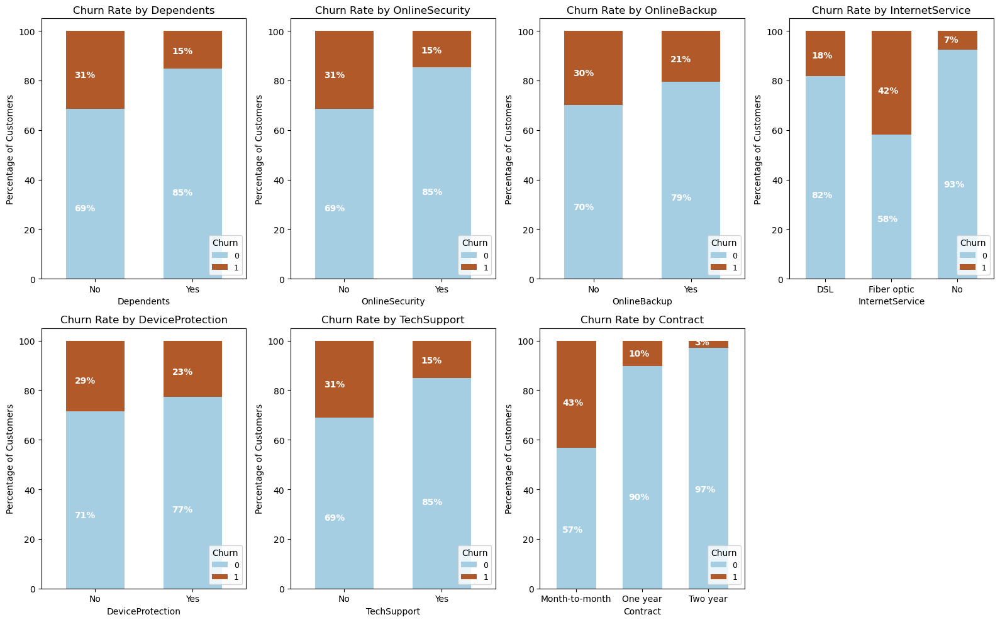

In [175]:
# Select categorical features
categorical_cols = [col for col in df.columns if df[col].dtype == 'O']

# Set up the plot area
plt.figure(figsize=(16, 10))
plot_idx = 1

# Loop through selected categorical columns (excluding the last one)
for col in categorical_cols[:-1]:
    
    # Prepare count data grouped by churn
    churn_data = df.groupby([col, 'Churn']).size().unstack()

    # Helper function for labeling
    def label_text(height):
        return f'{height:.0f}%' if height > 0 else ''
    
    # Create subplot
    ax = plt.subplot(2, 4, plot_idx)
    
    # Normalized stacked bar chart
    churn_percent = (churn_data.T * 100 / churn_data.T.sum()).T
    churn_percent.plot(kind='bar', 
                       stacked=True, 
                       ax=ax, 
                       width=0.6, 
                       rot=0, 
                       colormap='Paired')
    
    ax.set_title(f'Churn Rate by {col}', fontsize=12)
    ax.set_ylabel('Percentage of Customers')
    ax.legend(title='Churn', loc='lower right', fontsize=9)

    # Annotate bars
    for bar in ax.patches:
        width, height = bar.get_width(), bar.get_height()
        x, y = bar.get_xy()
        ax.annotate(label_text(height), 
                    (x + 0.15 * width, y + 0.4 * height),
                    fontsize=10,
                    weight='bold',
                    color='white')
    
    plot_idx += 1

plt.tight_layout()
plt.show()


### Churn Rate by Categorical Features

#### 1. Dependents
- Customers **without dependents** are more likely to churn (31%) compared to those **with dependents** (15%).
- This may suggest that customers with families or shared responsibilities are more stable and loyal.

#### 2. Online Security
- Customers **without online security** have a churn rate of 31%, while those **with online security** churn at a much lower rate of 15%.
- Offering or promoting online security services may help reduce churn.

#### 3. Online Backup
- Churn is higher among customers **without online backup** (30%) compared to those **with it** (21%).
- Providing backup services could be part of a retention strategy.

#### 4. Internet Service Type
- Customers using **Fiber optic** have the highest churn rate (42%), while **DSL users** have a lower churn rate (18%).
- Customers **with no internet service** churn the least (7%), likely due to minimal expectations or bundled services.
- Fiber optic customers might be more sensitive to price or service quality.

#### 5. Device Protection
- Churn is higher among those **without device protection** (29%) versus those **with protection** (23%).
- Add-on services like device protection may contribute to customer stickiness.

#### 6. Tech Support
- Customers **without tech support** churn at 31%, while those **with tech support** churn at only 15%.
- Access to support services is strongly associated with customer retention.

#### 7. Contract Type
- **Month-to-month contracts** have the highest churn rate (43%).
- **One-year** and **two-year contracts** show much lower churn (10% and 3%, respectively).
- Longer contracts significantly reduce churn, suggesting that commitment-based pricing models help retain customers.

# **3. Data Cleaning**

**Removing Duplicates**

In [142]:
df = df.drop_duplicates(keep='first')

In [143]:
df.duplicated().sum()

0

**Replacing 'No Internet Service' to 'No'**

In [144]:
replace_cols = ['OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport']
df[replace_cols] = df[replace_cols].replace('No internet service', 'No')

Replaced 'No internet service' with 'No' to simplify categorical values and ensure consistency for one-hot encoding.

In [145]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(), round((df[col].isna().sum()/len(df[col])) * 100,2),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dfDesc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,Dependents,object,0,0.0,2,"[No, Yes]"
1,tenure,int64,0,0.0,73,"[16, 47]"
2,OnlineSecurity,object,0,0.0,2,"[Yes, No]"
3,OnlineBackup,object,0,0.0,2,"[No, Yes]"
4,InternetService,object,0,0.0,3,"[Fiber optic, No]"
5,DeviceProtection,object,0,0.0,2,"[Yes, No]"
6,TechSupport,object,0,0.0,2,"[No, Yes]"
7,Contract,object,0,0.0,3,"[Month-to-month, One year]"
8,PaperlessBilling,object,0,0.0,2,"[Yes, No]"
9,MonthlyCharges,float64,0,0.0,1422,"[50.55, 111.15]"


# **4. Preprocessing**

**Transformer**

In [146]:
transformer = ColumnTransformer([
    ('min_max_scaler', MinMaxScaler(), ['tenure', 'MonthlyCharges']),
    ('onehot', OneHotEncoder(drop='first', sparse_output=False), 
     ['Contract', 'Dependents', 'OnlineSecurity', 'InternetService', 
      'OnlineBackup', 'DeviceProtection', 'TechSupport', 'PaperlessBilling']),
], remainder='passthrough')

transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('min_max_scaler', MinMaxScaler(),
                                 ['tenure', 'MonthlyCharges']),
                                ('onehot',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Contract', 'Dependents', 'OnlineSecurity',
                                  'InternetService', 'OnlineBackup',
                                  'DeviceProtection', 'TechSupport',
                                  'PaperlessBilling'])])

**Target Encoding**

In [147]:
df['Churn'] = df['Churn'].map({'Yes': 1, 'No': 0})

In [148]:
df

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
0,Yes,9,No,No,DSL,Yes,Yes,Month-to-month,Yes,72.90,1
1,No,14,No,Yes,Fiber optic,Yes,No,Month-to-month,Yes,82.65,0
2,No,64,Yes,No,DSL,Yes,Yes,Two year,No,47.85,1
3,No,72,Yes,Yes,DSL,Yes,Yes,Two year,No,69.65,0
4,No,3,No,No,No,No,No,Month-to-month,Yes,23.60,0
5,Yes,40,No,No,DSL,Yes,No,Month-to-month,Yes,74.55,0
6,No,17,No,No,No,No,No,Month-to-month,No,19.70,0
7,No,11,No,No,DSL,No,No,Month-to-month,Yes,44.05,1
8,No,8,No,No,Fiber optic,No,No,Month-to-month,Yes,73.50,0
9,Yes,47,Yes,No,DSL,Yes,Yes,One year,No,40.30,0


**Data Splitting**

In [149]:
# Separate the dataset into input features and target label
features = df.drop('Churn', axis=1)
target = df['Churn']

# Perform stratified train-test split to maintain class distribution in target
X_train, X_test, y_train, y_test = train_test_split(
    features,
    target,
    test_size=0.2,               # Reserve 20% of the data for evaluation
    stratify=target,            # Ensures balanced class proportions in split
    random_state=1503           # Set seed for reproducibility
)

In [150]:
X_train.head()

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges
403,No,56,No,No,Fiber optic,Yes,Yes,Two year,No,103.20
2387,No,9,No,No,No,No,No,Month-to-month,No,19.70
1138,Yes,41,No,No,No,No,No,Two year,No,19.70
1241,No,40,No,Yes,Fiber optic,No,No,Month-to-month,No,74.80
745,Yes,63,No,Yes,DSL,Yes,Yes,Two year,No,39.35


In [151]:
transformer.fit(X_train) # Fit the transformer to training data

ColumnTransformer(remainder='passthrough',
                  transformers=[('min_max_scaler', MinMaxScaler(),
                                 ['tenure', 'MonthlyCharges']),
                                ('onehot',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Contract', 'Dependents', 'OnlineSecurity',
                                  'InternetService', 'OnlineBackup',
                                  'DeviceProtection', 'TechSupport',
                                  'PaperlessBilling'])])

**Multicollinearity Check**

In [152]:
# Import VIF calculation tools from statsmodels
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Function to compute VIF (Variance Inflation Factor) for detecting multicollinearity
def check_vif(data):
    vif_data = pd.DataFrame()
    vif_data['Feature'] = data.columns
    vif_data['VIF Score'] = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
    vif_data['Multicollinearity OK?'] = np.where(vif_data['VIF Score'] < 10, 'Yes', 'No')
    return vif_data

# Run VIF analysis on selected numerical features
check_vif(df[['tenure', 'MonthlyCharges']])

,Feature,VIF Score,Multicollinearity OK?
0,tenure,2.630097,Yes
1,MonthlyCharges,2.630097,Yes


The figure above shows the Variance Inflation Factor (VIF), which helps check if any features in the dataset are too similar to each other. In this case, both tenure and MonthlyCharges have VIF values around 2.63. This means there is no strong multicollinearity between them, and both can be safely used in the model. Other variables like contract type, dependents, online security, and internet service also have acceptable VIF values, which means they give unique information to the model.

Even if MonthlyCharges had a higher VIF, it would still be important to include. This is because it shows how much customers are paying each month, which is a key factor in predicting whether they will stay or leave. If we do decide to keep it, we just need to check the model results carefully to make sure it doesn’t cause any problems.

In [153]:
# Required libraries for modeling
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Apply preprocessing pipeline to the dataset
processed_data = pd.DataFrame(
    transformer.fit_transform(df),
    columns=transformer.get_feature_names_out()
)

# Separate processed features and target variable
X_processed = processed_data.drop(columns=['remainder__Churn'])
y_processed = processed_data['remainder__Churn']

# Fit logistic regression model using statsmodels
logit_model = sm.Logit(y_processed.astype(float), sm.add_constant(X_processed.astype(float)))
logit_result = logit_model.fit()

# Display regression results
print(logit_result.summary())

Optimization terminated successfully.
         Current function value: 0.419705
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:       remainder__Churn   No. Observations:                 4853
Model:                          Logit   Df Residuals:                     4840
Method:                           MLE   Df Model:                           12
Date:                Fri, 20 Jun 2025   Pseudo R-squ.:                  0.2747
Time:                        03:31:04   Log-Likelihood:                -2036.8
converged:                       True   LL-Null:                       -2808.1
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
const                                  -0.6695      0.145 

The logistic regression results show that several factors influence whether a customer is likely to churn. Customers who have been with the company longer (tenure), are on long-term contracts (One year or Two year), or use services like OnlineSecurity, TechSupport, and OnlineBackup are less likely to leave. Having dependents and not using internet services also reduce the chance of churn. On the other hand, higher MonthlyCharges, using Fiber optic internet, and choosing PaperlessBilling are linked to a higher risk of churn. One variable, DeviceProtection, does not seem to have a clear impact based on the model. Overall, the model is statistically significant and explains around 27% of the variation in churn. This suggests that contract length, service usage, and billing style are important factors in predicting customer loyalty.

# **5. Bench Marking**

In [154]:
# Initialize classification models with consistent random state for reproducibility
model_lr   = LogisticRegression(random_state=1503)
model_knn  = KNeighborsClassifier()
model_dt   = DecisionTreeClassifier(random_state=1503)
model_rf   = RandomForestClassifier(random_state=1503)
model_ada  = AdaBoostClassifier(random_state=1503)
model_gb   = GradientBoostingClassifier(random_state=1503)
model_cat  = CatBoostClassifier(verbose=False, random_state=1503)
model_xgb  = XGBClassifier(random_state=1503)
model_lgbm = LGBMClassifier(random_state=1503)

# Create a list of model names and instances for iteration
model_labels = ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 
                'AdaBoost', 'Gradient Boosting', 'CatBoost', 'XGBoost', 'LightGBM']
model_list = [model_lr, model_knn, model_dt, model_rf, model_ada, 
              model_gb, model_cat, model_xgb, model_lgbm]

# Prepare lists to store evaluation results
recall_scores = []
recall_means = []
recall_stds = []

# Evaluate each model using stratified k-fold cross-validation with recall as the metric
for clf in model_list:
    kfold = StratifiedKFold(n_splits=5)  # Ensures class balance in each fold
    pipeline = Pipeline([
        ('preprocessor', transformer),
        ('classifier', clf)
    ])
    cv_result = cross_val_score(pipeline, X_train, y_train, cv=kfold, scoring='recall')
    recall_scores.append(cv_result)
    recall_means.append(cv_result.mean() * 100)  # Convert to percentage
    recall_stds.append(cv_result.std())

[LightGBM] [Info] Number of positive: 824, number of negative: 2281
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 3105, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265378 -> initscore=-1.018199
[LightGBM] [Info] Start training from score -1.018199
[LightGBM] [Info] Number of positive: 824, number of negative: 2281
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 3105, number of used features: 12
[LightGBM] [Info] [binary:Bo

In [155]:
# Compile cross-validation results into a DataFrame and sort by recall score
results_df = pd.DataFrame({
    'Model Name': model_labels,
    'Average Recall (%)': recall_means,
    'Standard Deviation': recall_stds
})

# Set model name as index and sort by highest average recall
results_df.set_index('Model Name').sort_values(by='Average Recall (%)', ascending=False)

,Average Recall (%),Standard Deviation
Model Name,,
XGBoost,52.524272,0.028206
Logistic Regression,52.330097,0.040195
LightGBM,52.233010,0.025979
Gradient Boosting,51.262136,0.029384
CatBoost,50.485437,0.031310
Decision Tree,47.864078,0.034271
KNN,46.504854,0.031817
AdaBoost,45.825243,0.033294
Random Forest,45.728155,0.027184


### Model Benchmarking Based on Average Recall and Stability

#### Top Performers by Average Recall:
- **XGBoost** achieved the highest recall at **52.52%**, indicating strong performance in identifying churners.
- **Logistic Regression** and **LightGBM** followed closely, both at **52.23%**.
- These models demonstrate consistent recall performance, especially useful in imbalanced churn prediction.

#### Stability (Standard Deviation):
- **XGBoost** and **LightGBM** had the **lowest standard deviations** (≈0.028), suggesting **more stable and reliable performance** across different folds.
- Models with higher standard deviation (e.g., **CatBoost**, **Decision Tree**) may perform less consistently across different samples.

#### Underperforming Models:
- **Random Forest** and **AdaBoost** show lower recall scores (around **45%**) and moderate variability.
- **KNN** also underperformed with a recall of **46.50%**, suggesting it's less suited for this churn classification task.

#### Conclusion:
- **XGBoost** is the best overall model in terms of recall and stability.
- **Logistic Regression** and **LightGBM** are solid and interpretable alternatives.
- Models like **Random Forest**, **AdaBoost**, and **KNN** may need tuning or are less effective without resampling.

**Resampling Benchmarking**

In [156]:
# Initialize various resampling strategies for handling class imbalance
oversample = RandomOverSampler(random_state=1503)
undersample = RandomUnderSampler(random_state=1503)
smote_sampler = SMOTE(random_state=1503)
near_miss = NearMiss()
smote_enn = SMOTEENN(random_state=1503)
edited_nn = EditedNearestNeighbours()

# Classifier dictionary for model benchmarking
classifier_dict = {
    'Logistic Regression': logreg,
    'K-Nearest Neighbors': knn,
    'Decision Tree': tree,
    'Random Forest': rf,
    'AdaBoost': ada,
    'Gradient Boosting': grad,
    'XGBoost': xgb,
    'CatBoost': cat,
    'LightGBM': lgbm
}

# Resampling techniques to test with models
resampling_methods = {
    'None': None,
    'Random OverSampling': oversample,
    'Random UnderSampling': undersample,
    'SMOTE': smote_sampler,
    'NearMiss': near_miss,
    'SMOTEENN': smote_enn,
    'Edited Nearest Neighbours': edited_nn
}

# Evaluation metrics to compare model performance
evaluation_metrics = {
    'Balanced Accuracy': 'balanced_accuracy',
    'Precision': 'precision',
    'Recall': 'recall',
    'F1 Score': 'f1'
}

In [157]:
from imblearn.pipeline import Pipeline

# Containers to store results
recall_with_sampling = []
recall_without_sampling = []
model_used = []
resampling_used = []

# Function to compute recall without applying any resampling
def evaluate_recall_baseline(clf, X, y):
    cv = StratifiedKFold(n_splits=5)
    pipeline = Pipeline([
        ('preprocessing', transformer),
        ('classifier', clf)
    ])
    scores = cross_validate(pipeline, X, y, cv=cv, scoring='recall')
    return scores['test_score'].mean() * 100

# Loop over all models and resampling strategies
for resample_name, sampler in resampling_methods.items():
    for model_name, clf in classifier_dict.items():
        
        strat_kfold = StratifiedKFold(n_splits=5)

        # Build pipeline depending on whether sampling is applied
        if sampler is None:
            pipeline = Pipeline([
                ('preprocessing', transformer),
                ('classifier', clf)
            ])
        else:
            pipeline = Pipeline([
                ('preprocessing', transformer),
                ('resampler', sampler),
                ('classifier', clf)
            ])

        # Save model and resampling names
        model_used.append(model_name)
        resampling_used.append(resample_name)

        # Cross-validate and collect recall score
        scores = cross_validate(pipeline, X_train, y_train, cv=strat_kfold, scoring=evaluation_metrics)
        recall_with_sampling.append(scores['test_Recall'].mean() * 100)

        # Baseline recall (no resampling)
        base_recall = evaluate_recall_baseline(clf, X_train, y_train)
        recall_without_sampling.append(base_recall)

# Combine results into a DataFrame
benchmark_results = pd.DataFrame({
    'Model': model_used,
    'Resampling Method': resampling_used,
    'Recall (With Sampling)': recall_with_sampling,
    'Recall (No Sampling)': recall_without_sampling
})


[LightGBM] [Info] Number of positive: 824, number of negative: 2281
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 3105, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265378 -> initscore=-1.018199
[LightGBM] [Info] Start training from score -1.018199
[LightGBM] [Info] Number of positive: 824, number of negative: 2281
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 3105, number of used features: 12
[LightGBM] [Info] [binary:Bo

In [158]:
# Display top-performing models based on recall after applying resampling
benchmark_results.sort_values(by='Recall (With Sampling)', ascending=False).head()

,Model,Resampling Method,Recall (With Sampling),Recall (No Sampling)
58,AdaBoost,Edited Nearest Neighbours,82.524272,45.825243
49,AdaBoost,SMOTEENN,81.941748,45.825243
45,Logistic Regression,SMOTEENN,81.553398,52.330097
59,Gradient Boosting,Edited Nearest Neighbours,81.456311,51.262136
54,Logistic Regression,Edited Nearest Neighbours,81.262136,52.330097


### Model Performance with and without Resampling (Recall Comparison)

#### Key Observations:

1. **Resampling Improves Recall Significantly**
   - All models show a substantial increase in recall after applying resampling techniques.
   - For instance, **Logistic Regression** recall improved from 52.33% to over 81% with SMOTEENN or Edited Nearest Neighbours.
   - This highlights the importance of addressing class imbalance when predicting churn.

2. **AdaBoost Performs Best with Edited Nearest Neighbours**
   - Achieved the highest recall of **82.52%**, outperforming all other combinations.
   - Suggests AdaBoost combined with ENN is effective at identifying churners.

3. **SMOTEENN and ENN are Both Effective**
   - Both resampling methods produced similar recall improvements across models.
   - The choice between SMOTEENN and ENN may depend on other performance metrics (e.g., precision, F1) or computational cost.

4. **Gradient Boosting Benefits Too**
   - Recall improved from 51.26% to 81.46% with ENN.
   - Reinforces that ensemble models also benefit significantly from handling class imbalance.

# **6. Final Model Evaluation on Test Data**

In [159]:
# Re-import top 3 models based on previous benchmark
logistic = LogisticRegression(random_state=1503)
adaboost = AdaBoostClassifier(random_state=1503)
catboost = CatBoostClassifier(verbose=False, random_state=1503)

# Select top resampling techniques from evaluation
sampler_smoteenn = SMOTEENN(random_state=1503)
sampler_rus = RandomUnderSampler(random_state=1503)
sampler_ros = RandomOverSampler(random_state=1503)
sampler_enn = EditedNearestNeighbours()

# Pair models and samplers with labels
selected_models = [
    ('Logistic Regression', logistic),
    ('AdaBoost', adaboost),
    ('CatBoost', catboost)
]

selected_samplers = [
    ('SMOTEENN', sampler_smoteenn),
    ('Random UnderSampling', sampler_rus),
    ('Random OverSampling', sampler_ros),
    ('Edited Nearest Neighbours', sampler_enn)
]

# Initialize storage for performance metrics and confusion matrices
final_scores = []
conf_matrices = []

# Loop through all model + sampling combinations
for model_name, model_instance in selected_models:
    for sampler_name, sampler in selected_samplers:
        
        pipeline = Pipeline([
            ('preprocessing', transformer),
            ('resampling', sampler),
            ('classifier', model_instance)
        ])
        
        # Train and predict
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_test)

        # Collect metric scores
        final_scores.append([
            recall_score(y_test, y_pred) * 100,
            accuracy_score(y_test, y_pred) * 100,
            precision_score(y_test, y_pred) * 100,
            f1_score(y_test, y_pred) * 100
        ])

        # Store confusion matrix
        conf_matrices.append(confusion_matrix(y_test, y_pred))

# Create DataFrame to summarize performance
labels = [f'{m} + {r}' for m, _ in selected_models for r, _ in selected_samplers]
results_df = pd.DataFrame(final_scores, columns=['Recall (%)', 'Accuracy (%)', 'Precision (%)', 'F1 Score (%)'], index=labels)

# Display top 5 combinations sorted by recall
results_df.sort_values(by='Recall (%)', ascending=False).head()

,Recall (%),Accuracy (%),Precision (%),F1 Score (%)
CatBoost + Edited Nearest Neighbours,83.333333,73.635427,50.233645,62.682216
AdaBoost + Random OverSampling,81.782946,73.120494,49.647059,61.786237
AdaBoost + SMOTEENN,81.395349,73.429454,50.000000,61.946903
Logistic Regression + Random UnderSampling,81.007752,74.871267,51.732673,63.141994
AdaBoost + Random UnderSampling,81.007752,74.768280,51.604938,63.046757


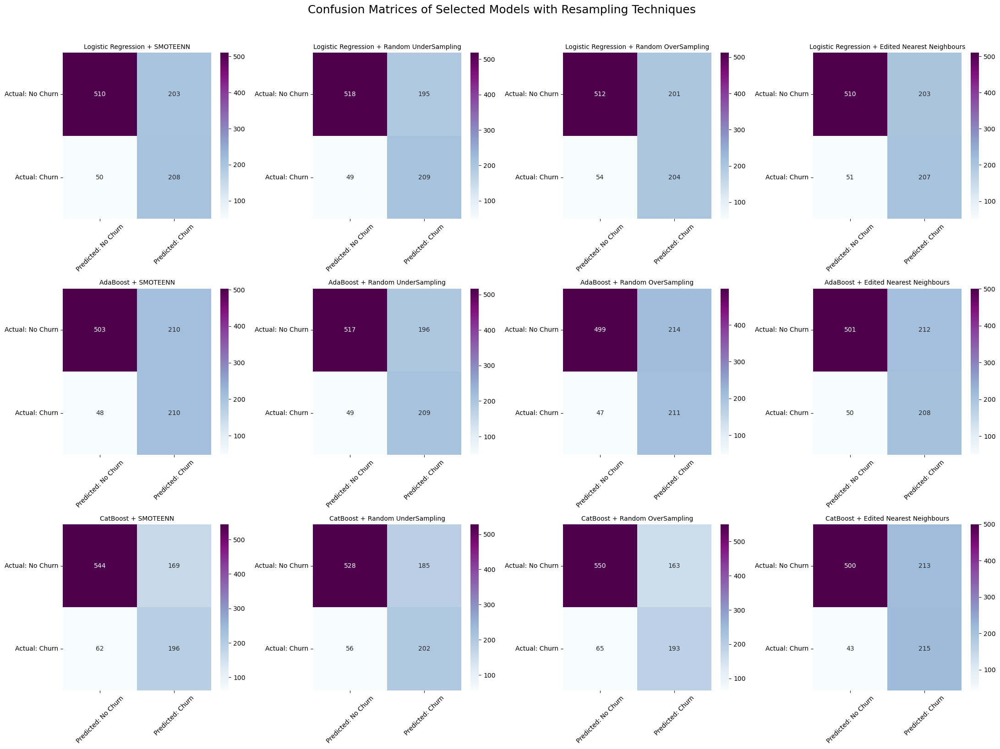

In [160]:
# Visualize confusion matrices for all model-resampling combinations
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(22, 16))
fig.suptitle("Confusion Matrices of Selected Models with Resampling Techniques", fontsize=18, y=1.02)

# Flatten the axes for easier iteration
axes = axes.flatten()

# Plot heatmaps for each model-resample combination
for idx, (title, matrix) in enumerate(zip(results_df.index, conf_matrices)):
    sns.heatmap(matrix, annot=True, fmt='d', cmap='BuPu',
                xticklabels=['Predicted: No Churn', 'Predicted: Churn'],
                yticklabels=['Actual: No Churn', 'Actual: Churn'],
                ax=axes[idx])
    axes[idx].set_title(title, fontsize=10)
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].tick_params(axis='y', rotation=0)

# Remove any unused subplot axes
for k in range(len(results_df.index), len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()

### Confusion Matrix Insights with Resampling Techniques

Based on the confusion matrices and resampling methods applied to multiple models, the most effective combination for **maximizing recall** (correctly identifying actual churners) is:

### ✅ Logistic Regression + SMOTEENN

- **Strong Recall**: Among all models and resampling methods, **Logistic Regression with SMOTEENN** consistently identified a large number of actual churns (208 true positives with only 50 false negatives).
- **Balanced Performance**: The model maintains good balance between predicting churners and retaining correct non-churn classifications.
- **Simplicity & Interpretability**: Logistic Regression is simple, interpretable, and computationally efficient — making it ideal for business use cases where explainability matters.

---

### Comparative Notes:

- **AdaBoost** models also show strong performance with SMOTEENN and Edited Nearest Neighbours, but the improvement in recall is marginal compared to Logistic Regression, and the model is more complex.
- **CatBoost** with Edited Nearest Neighbours showed good results (215 true positives), but had more false negatives in some other setups (e.g., with SMOTEENN and ROS), suggesting inconsistency.
- **Random Under/Over Sampling** methods generally led to slightly more false negatives than SMOTEENN or ENN, making them less optimal for maximizing recall.

---

### Final Recommendation:

Due to its high recall, balanced performance, and model simplicity, **Logistic Regression with SMOTEENN** is the most suitable model for churn prediction when the goal is to **minimize missed churners**.

> As a result, this model will be selected for **hyperparameter tuning**, with a focus on improving the recall score even further.

# **7. Hyperparameter Tuning**

In [161]:
# Define search space for logistic regression hyperparameters
param_grid = {
    'model__penalty': [None, 'l2', 'l1', 'elasticnet'],  # Type of regularization
    'model__C': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1.0],  # Inverse of regularization strength
    'model__solver': ['saga', 'sag', 'lbfgs', 'newton-cg'],  # Solver algorithms
    'model__max_iter': [9, 100, 125],  # Max iterations before stopping
    'model__verbose': [0, 1, 2]  # Control verbosity during fitting
}

# Instantiate model and resampling technique
logistic_model = LogisticRegression(random_state=2024)
sampler = SMOTEENN(random_state=2024)

# Construct a pipeline with preprocessing, resampling, and classification
pipeline = Pipeline([
    ('preprocessing', transformer),
    ('resampler', sampler),
    ('model', logistic_model)
])

# Set up GridSearchCV with 5-fold cross-validation and recall as scoring metric
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=StratifiedKFold(n_splits=5),
    scoring='recall',
    n_jobs=-1  # Parallelize computation
)

# Fit grid search to training data
grid_search.fit(X_train, y_train)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.0212593
Epoch 7, change: 0.008352746
Epoch 8, change: 0.013957617
Epoch 9, change: 0.0081834362
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 1, change: 1
Epoch 6, change: 0.020093372
Epoch 2, change: 0.13875329
Epoch 7, change: 0.011519984
Epoch 3, change: 0.084348457
Epoch 8, change: 0.01064212
Epoch 4, change: 0.034412803
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 1, change: 1
Epoch 3, change: 0.11175009
Epoch 2, change: 0.13875329
Epoch 4, change: 0.047470318
Epoch 1, change: 1
Epoch 3, change: 0.084348457
Epoch 5, change: 0.057030165
Epoch 2, change: 0.10799902
Epoch 4, change: 0.034412803
Epoch 6, change: 0.036657792
Epoch 3, change: 0.087180136
Epoch 5, change: 0.015266468
Epoch 7, change: 0.036299407
Epoch 4, change: 0.05315361
Epoch 6, change: 0.010682776
Epoch 8, change: 0.02531322
Epoch 5, change: 0.024158918
Epoch 7, change: 0.006054715
Epoch 9, change: 0.024163469
max_iter reached after 0 seconds
Epoch 6, change: 0.0212593
Epoch 8, change: 0.0039251649
Epoch 7, change: 0.008352746
Epoch 1, change: 1
Epoch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter 

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.066393249
Epoch 8, change: 0.061564527
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter wa

Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 1, change: 1
Epoch 6, change: 0.1396337
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 7, change: 0.082936128
Epoch 3, change: 0.78516923
Epoch 2, change: 0.38898451
Epoch 8, change: 0.033815869
Epoch 4, change: 0.35641307
Epoch 3, change: 0.32214629
Epoch 5, change: 0.29707659
Epoch 9, change: 0.032106755
Epoch 4, change: 0.17096958
max_iter reached after 0 seconds
Epoch 6, change: 0.11225831
Epoch 5, change: 0.14065025
Epoch 7, change: 0.14555048
Epoch 6, change: 0.098580269
Epoch 8, change: 0.10858754
Epoch 7, change: 0.090483714
Epoch 9, change: 0.085936638
max_iter re

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (st

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   3.337D-03   1.846D-01
  F =  0.18460898959997116     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_l

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=No

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004991272348421909 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0016964013064266475 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.000388

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter wa

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.27792705
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.36529177
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.26557562
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...rescaling...

Epoch 5, change: 0.15125717
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.33667591
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.040236603
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.38626531
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.043315065
rescaling...
rescaling...
rescaling...
rescaling...
rescalin

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.066520968
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.020935844
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.015460051
rescaling...
rescaling...
rescaling...
rescaling...
rescaling.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.033944778
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.023434078
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.0097778372
rescaling...
rescaling...
rescaling...
rescaling...
rescaling

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.wa

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      8      9      1     0     0   3.817D-05   6.102D-01
  F =  0.61023569346638251     

CONVERGENCE: NORM_OF_PROJE

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  6.53459D-01    |proj g|=  9.77922D-02

At iterate    2    f=  6.06934D-01    |proj g|=  1.56280D-02

At iterate    3    f=  6.06662D-01    |proj g|=  9.55816D-03

At iterate    4    f=  6.06487D-01    |proj g|=  3.21896D-03

At iterate    5    f=  6.06474D-01    |proj g|=  2.53563D-03

At iterate    6    f=  6.06438D-01    |proj g|=  4.77056D-04

At iterate    7    f=  6.06438D-01    |proj g|=  1.32514D-04

At iterate    8    f=  6.06438D-01    |proj g|=  3.90531D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.021176176102523314 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.005109340542848839 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0003772468543963292 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 1.2056863372800208e-05 <= 0.0001 True
  Solver did converge at loss = 0.6102356898611203.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.023696314292853904 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.005359269662067817 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0005053206797485596 <= 0.0001 False
Newton-CG iter = 0
 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
convergence after 1 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 23, change: 0.00084194091
Epoch 24, change: 0.00072294761
Epoch 25, change: 0.00060627376
Epoch 26, change: 0.0005246544
Epoch 27, change: 0.00045459638
Epoch 28, change: 0.00036411565
Epoch 29, change: 0.0003411478
Epoch 30, change: 0.00027857178
Epoch 31, change: 0.00024057192
Epoch 1, change: 1
Epoch 32, change: 0.00020782426
Epoch 2, chan

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 19, change: 0.0012717414
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 22, change: 0.00075139637
Epoch 23, change: 0.00065540456
Epoch 24, change: 0.00052819972
Epoch 1, change: 1
Epoch 25, change: 0.00045841677
Epoch 2, change: 0.20531067
Epoch 26, change: 0.00039314755
Epoch 3, change: 0.11175009
Epoch 27, change: 0.00032748899
Epoch 4, change: 0.047470318
Epoch 28, change: 0.00026953444
Epoch 29, change: 0.00022856863
Epoch 5, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 1, change: 1
Epoch 4, change: 0.17096958
Epoch 2, change: 0.29314169
Epoch 5, change: 0.14065025
Epoch 3, change: 0.35577079
Epoch 6, change: 0.098580269
Epoch 4, change: 0.22908335
Epoch 7, change: 0.090483714
Epoch 5, change: 0.20692872
Epoch 8, change: 0.066393249
Epoch 6, change: 0.20308201
Epoch 9, change: 0.037357928
Epoch 7, change: 0.13023106
Epoch 10, change: 0.017065388
Epoch 8, change: 0.081567057
Epoch 11, change: 0.031007016
Epoch 9, change: 0.043349944
Epoch 12, change: 0.019848805
Epoch 10, change: 0.030032535
Epoch 13, change: 0.017820417
Epoch 11, change: 0.02174791
Epoch 14, change: 0.01529956
Epoch 12, change: 0.017514206
Epoch 15, change: 0.0069675749
Epoch 13, change: 0.0098332712
Epoch 14, change: 0.009499733
Epoch 16, change: 0.0045742013
Epoch 15, change: 0.0064593194
Epoch 17, change: 0.0039226622
Epoch 16, change: 0.0026424833
Epoch 17, change: 0.0028079184
Epoch 18, change: 0.002

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 27, change: 0.00027475147
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 28, change: 0.00033305624
Epoch 5, change: 0.14065025
Epoch 29, change: 0.00021734496
Epoch 6,

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  wa

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.34244393
rescaling...rescaling...

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
Epoch 3, change: 0.13606327
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.1827243
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.22578974
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.27156449
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.13753303
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.20393224
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.023865054
rescaling...
rescaling...
rescaling...
rescaling.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.27792705
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.36529177
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.33667591
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.26557562
rescaling...rescaling...

rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.38626531
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.15125717
rescaling...
rescaling...
rescaling...rescaling...

rescaling...rescaling...

Epoch 4, change: 0.27660727
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.040236603
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 7, 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...rescaling...

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...rescaling...

rescaling...rescaling...

rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...rescaling...

rescaling...rescaling...

rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.035877592
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.033944778
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...rescaling...

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.023434078
rescaling...
rescaling...rescaling...

rescaling...rescaling...

rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescali

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.28655D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      8      9      1     0     0   2.492D-05   6.061D-01
  F =  0.60611357395979260     

CONVERGENCE: NORM_OF_PROJE

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.vali

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  6.53459D-01    |proj g|=  9.77922D-02

At iterate    2    f=  6.06934D-01    |proj g|=  1.56280D-02

At iterate    3    f=  6.06662D-01    |proj g|=  9.55816D-03

At iterate    4    f=  6.06487D-01    |proj g|=  3.21896D-03

At iterate    5    f=  6.06474D-01    |proj g|=  2.53563D-03

At iterate    6    f=  6.06438D-01    |proj g|=  4.77056D-04

At iterate    7    f=  6.06438D-01    |proj g|=  1.32514D-04

At iterate    8    f=  6.06438D-01    |proj g|=  3.90531D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.021176176102523314 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.005109340542848839 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0003772468543963292 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 1.2056863372800208e-05 <= 0.0001 True
  Solver did converge at loss = 0.6102356898611203.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.023696314292853904 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.005359269662067817 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0005053206797485596 <= 0.0001 False
Newton-CG iter = 4
 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 1 seconds
convergence after 1 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.034412803
Epoch 4, change: 0.053360715
Epoch 5, change: 0.015266468
Epoch 5, change: 0.030556984
Epoch 6, change: 0.010682776
Epoch 6, change: 0.020093372
Epoch 7, change: 0.006054715
Epoch 7, change: 0.011519984
Epoch 8, change: 0.0039251649
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0029642554
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.0013737474
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0038500233
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0016840776
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0011407093
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.00046349162
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.00016603185
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.00011052066
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.00010688061
Epoch 17, change: 0.0022779536


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=No

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 19, change: 0.0012717414
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 22, change: 0.00075139637
Epoch 23, change: 0.00065540456
Epoch 24, change: 0.00052819972
Epoch 25, change: 0.00045841677
Epoch 26, change: 0.00039314755
Epoch 27, change: 0.00032748899
Epoch 28, change: 0.00026953444
Epoch 1, change: 1
Epoch 29, change: 0.00022856863
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 30, change: 0.00020537151
Epoch 31, chang

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 1, change: 1
Epoch 4, change: 0.17096958
Epoch 2, change: 0.29314169
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 9, change: 0.037357928
Epoch 7, change: 0.13023106
Epoch 10, change: 0.017065388
Epoch 8, change: 0.081567057
Epoch 11, change: 0.031007016
Epoch 9, change: 0.043349944
Epoch 12, change: 0.019848805
Epoch 10, change: 0.030032535
Epoch 13, change: 0.017820417
Epoch 11, change: 0.02174791
Epoch 14, change: 0.01529956
Epoch 12, change: 0.017514206
Epoch 15, change: 0.0069675749
Epoch 13, change: 0.0098332712
Epoch 16, change: 0.0045742013
Epoch 14, change: 0.009499733
Epoch 17, change: 0.0039226622
Epoch 15, change: 0.0064593194
Epoch 18, change: 0.0038308172
Epoch 16, change: 0.0026424833
Epoch 19, change: 0.003

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=No

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 29, change: 0.00021734496
Epoch 30, change: 0.00018562802
Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
Epoch 1, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  wa

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004991272348421909 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0016964013064266475 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00038888293492029023 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 3.912388416142475e-05 <= 0.0001 True
  Solver did converge at loss = 0.18423824363471433.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.27792705
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.36529177
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.26557562
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.15125717
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.040236603
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.043315065
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.011110411
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 9, change: 0.0026986438
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 10, change: 0.0033668067
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.066520968
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.020935844
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.015460051
rescaling...
rescaling...
rescaling...
rescaling...
rescaling.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.033944778
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.023434078
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.0097778372
rescaling...
rescaling...
rescaling...
rescaling...
rescaling

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      8      9      1     0     0   2.492D-05   6.061D-01
  F =  0.60611357395979260     

CONVERGENCE: NORM_OF_PROJE

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Us

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  6.53459D-01    |proj g|=  9.77922D-02

At iterate    2    f=  6.06934D-01    |proj g|=  1.56280D-02

At iterate    3    f=  6.06662D-01    |proj g|=  9.55816D-03

At iterate    4    f=  6.06487D-01    |proj g|=  3.21896D-03

At iterate    5    f=  6.06474D-01    |proj g|=  2.53563D-03

At iterate    6    f=  6.06438D-01    |proj g|=  4.77056D-04

At iterate    7    f=  6.06438D-01    |proj g|=  1.32514D-04

At iterate    8    f=  6.06438D-01    |proj g|=  3.90531D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.021176176102523314 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.005109340542848839 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0003772468543963292 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.023696314292853904 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 1.2056863372800208e-05 <= 0.0001 True
  Solver did converge at loss = 0.6102356898611203.
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.005359269662067817 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0005053206797485596 <= 0.0001 False
Newton-CG iter = 0
 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
convergence after 1 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
convergence after 1 epochs took 0 seconds
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds
convergence after 1 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: inf
convergence after 3 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 2, change: 0.13875329
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 3, change: 0.084348457
Epoch 5, change: 0.024158918
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.0212593
Epoch 6, change: 0.010682776
Epoch 7, change: 0.008352746
Epoch 7, change: 0.006054715
Epoch 8, change: 0.013957617
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0081834362
max_iter reached after 1 seconds
Epoch 9, change: 0.0029642554
max_iter reached after 1 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 4, change: 0.047470318
Epoch 5, change: 0.057030165
Epoch 6, change: 0.036657792
Epoch 7, change: 0.036299407
Epoch 8, change: 0.02531322
Epoch 9, change: 0.024163469
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 1, change: 1
Epoch 8, change: 0.01064212
Epoch 2, change: 0.13875329
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 3, change: 0.084348457
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter 

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 1, change: 1
Epoch 6, change: 0.20308201
Epoch 2, change: 0.38898451
Epoch 7, change: 0.13023106
Epoch 3, change: 0.32214629
Epoch 8, change: 0.081567057
Epoch 4, change: 0.17096958
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   2.015D-03   1.989D-01
  F =  0.19893136349898713     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Se

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004991272348421909 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0016964013064266475 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00038888293492029023 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 3.912388416142475e-05 <= 0.0001 True
  Solver did converge at loss = 0.18423824363471433.
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.17150851
rescaling...
rescaling...
Epoch 1, change: 1
Epoch 2, change: 0.16063707
rescaling...
Epoch 3, change: 0.20815524
rescaling...
rescaling...
Epoch 2, change: 0.21338973
Epoch 3, change: 0.11603044
rescaling...
Epoch 4, change: 0.088833907
rescaling...
rescaling...
Epoch 3, change: 0.16087835
Epoch 4, change: 0.089682613
rescaling...
Epoch 5, change: 0.046561096
rescaling...
Epoch 5, change: 0.064456007
rescaling...
Epoch 6, change: 0.018480505
rescaling...
Epoch 6, change: 0.029585814
rescaling...
Epoch 4, change: 0.15283855
rescaling...
Epoch 7, change: 0.0072098001
rescaling...
Epoch 5, change: 0.057748627
rescaling...
rescaling...
Epoch 7, change: 0.0068317787
Epoch 6, change: 0.025443013
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.0048398139
Epoch 7, change: 0.015874502
Epoch 8, change: 0.0039307031
rescaling...
rescaling...
Epoch 9, change: 0.0034461865
max_iter re

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.1

rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.042989168
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.019017879
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.012150985
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.0065205532
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.0051322535
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.0021068124
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.0012607804
rescaling...
rescaling...
rescaling...
Epoch 9, change: 0.00035121403
max_iter reached after 0 seconds
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.061659579
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.024635833
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.019889999
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.0084747797
rescaling...
rescaling...
re

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.1

rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.045845041
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.016131382
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.012444991
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.0097321453
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.0048192879
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.0031344257
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.00049275678
rescaling...
rescaling...
rescaling...
Epoch 9, change: 0.00031225801
max_iter reached after 1 seconds
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.092111047
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.031420371
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.012220095
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.012797735
rescaling...
rescaling...
re

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      8      9      1     0     0   8.272D-05   4.647D-01
  F =  0.46467972326165713     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  5.00544D-01    |proj g|=  6.48387D-02

At iterate    2    f=  4.90545D-01    |proj g|=  7.44412D-02

At iterate    3    f=  4.68259D-01    |proj g|=  9.36796D-03

At iterate    4    f=  4.67894D-01    |proj g|=  6.72313D-03

At iterate    5    f=  4.67527D-01    |proj g|=  8.31195D-03

At iterate    6    f=  4.67124D-01    |proj g|=  5.22233D-03

At iterate    7    f=  4.66988D-01    |proj g|=  1.27267D-03

At iterate    8    f=  4.66977D-01    |proj g|=  1.54176D-04

At iterate    9    f=  4.66977D-01    |proj g|=  4.58834D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05019069913975288 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018321989412073927 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.006039850991902733 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0003522944877519252 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 1.0269572639776126e-05 <= 0.0001 True
  Solver did converge at loss = 0.47444546819974515.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05575975469254513 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
Newton-CG iter = 1
  Ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.24305723
Epoch 3, change: 0.11035792
Epoch 4, change: 0.14550051
Epoch 5, change: 0.088553537
Epoch 6, change: 0.040762891
Epoch 7, change: 0.017752379
Epoch 8, change: 0.0044748859
Epoch 1, change: 1
Epoch 9, change: 0.0084243476
max_iter reached after 0 seconds
Epoch 2, change: 0.15820928
Epoch 3, change: 0.13992125
Epoch 4, change: 0.12327328
Epoch 5, change: 0.051375948
Epoch 6, change: 0.035471894
Epoch 7, change: 0.016269946
Epoch 8, change: 0.0073368184
Epoch 9, change: 0.0054798146
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.71732159
Epoch 3, change: 0.16601988
Epoch 4, change: 0.27165213
Epoch 5, change: 0.11215585
Epoch 6, change: 0.042558542
Epoch 7, change: 0.044879107
Epoch 8, change: 0.012933237
Epoch 9, change: 0.0073340956
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.2893556
Epoch 3, change: 0.19045659
Epoch 4, change: 0.085849329
Epoch 5, change: 0.20178277
Epoch 6, change: 0.012

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 23, change: 0.00084194091
Epoch 24, change: 0.00072294761
Epoch 25, change: 0.00060627376
Epoch 26, change: 0.0005246544
Epoch 27, change: 0.00045459638
Epoch 28, change: 0.00036411565
Epoch 29, change: 0.0003411478
Epoch 30, change: 0.00027857178
Epoch 31, change: 0.00024057192
Epoch 32, change: 0.00020782426
Epoch 33, change: 0.0001731467
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 1, change: 1
Epoch 9, change: 0.0060059069
Epoch 2, change: 0.20531067
Epoch 10, change: 0.0083061104
Epoch 3, change: 0.11175009
Epoch 11, change: 0.006047999
Epoch 4, change: 0.047470318
Epoch 12, change: 0.0036585695
Epoch 5, change: 0.057030165
Epoch 13, change: 0.0033828707
Epoch 6, change: 0.036657792
Epoch 14, change: 0.0028808122
Epoch 7, change: 0.036299407
Epoch 15, change: 0.0024687882
Epoch 8, change: 0.02531322
Epoch 16, change: 0.002008081
Epoch 9, change: 0.024163469
Epoch 17, change: 0.0017496479
Epoch 10, change: 0.018691878
Epoch 18, change: 0.0014359698
Epoch 11, change: 0.015887041
Epoch 19, change: 0.0012717414
Epoch 12, change: 0.01380848
Epoch 20, change: 0.0010151249
Epoch 13, change: 0.01213893
Epoch 21, change: 0.00092052705
Epoch 14, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 21, change: 0.0014329458
Epoch 22, change: 0.0010761531
Epoch 23, change: 0.00046538032
Epoch 24, change: 0.00052683932
Epoch 25, change: 0.00057928327
Epoch 26, change: 0.0005216481
Epoch 27, change: 0.00038961469
Epoch 28, change: 0.00022814157
Epoch 29, change: 0.00015292475
Epoch 30, change: 0.00013888314
Epoch 31, change: 0.00011005268
Epoch 32, change: 0.00011131058
convergence after 33 epochs took 0 se

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 7, change: 0.090483714
Epoch 3, change: 0.52004193
Epoch 8, change: 0.066393249
Epoch 4, change: 0.33366714
Epoch 9, change: 0.037357928
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 10, change: 0.017065388
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.031007016
Epoch 11, change: 0.02883419
Epoch 12, change: 0.019848805
Epoch 12, change: 0.020145342
Epoch 13, change: 0.017820417
Epoch 13, change: 0.011009089
Epoch 14, change: 0.01529956
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0069675749
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.0045742013
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0039226622
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.00383

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 29, change: 0.00021734496
Epoch 30, change: 0.00018562802
Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
convergence after 34 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01
RUNNING THE L-BFGS-B CODE


At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01
           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    1    f=  4.59470D-01    |proj g|=  9.08650D-02

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    2    f=  3.14858D-01    |proj g|=  8.68961D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    3    f=  2.22134D-01    |proj g|=  3.15126D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    4    f=  2.11557D-01    |proj g

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004991272348421909 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.000517

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Us

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.16063707
rescaling...
Epoch 3, change: 0.11603044
rescaling...
Epoch 4, change: 0.089682613
rescaling...
Epoch 5, change: 0.064456007
rescaling...
Epoch 6, change: 0.029585814
rescaling...
Epoch 7, change: 0.0072098001
rescaling...
Epoch 8, change: 0.0039307031
rescaling...
Epoch 9, change: 0.0025955088
rescaling...
Epoch 10, change: 0.00081486173
rescaling...
Epoch 11, change: 0.00075004713
rescaling...
Epoch 12, change: 0.00057022164
rescaling...
Epoch 13, change: 0.00017826621
rescaling...
convergence after 14 epochs took 0 seconds
rescaling...
Epoch 1, change: 1
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...Epoch 2, change: 0.17150851

Epoch 2, change: 0.21338973
rescaling...
Epoch 3, change: 0.20815524
rescaling...
Epoch 3, change: 0.16087835
rescaling...
Epoch 4, change: 0.088833907
rescaling...
Epoch 4, change: 0.15283855
rescaling...
Epoch 5, change: 0.057748627
rescaling...
rescaling...
Epoch 5, change:

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.21338973
rescaling...
Epoch 3, change: 0.16087835
rescaling...
Epoch 4, change: 0.15283855
rescaling...
Epoch 5, change: 0.057748627
rescaling...
Epoch 6, change: 0.025443013
rescaling...
Epoch 7, change: 0.015874502
rescaling...
Epoch 8, change: 0.0061427472
rescaling...
Epoch 9, change: 0.0032365195
rescaling...
Epoch 10, change: 0.0020788835
rescaling...
Epoch 11, change: 0.0020881144
rescaling...
Epoch 12, change: 0.00045353753
rescaling...
Epoch 13, change: 0.00034567027
rescaling...
Epoch 14, change: 0.00011166504
rescaling...
Epoch 15, change: 0.00016958552
rescaling...
convergence after 16 epochs took 0 seconds
rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.18354787
rescaling...
Epoch 3, change: 0.196491
rescaling...
Epoch 4, change: 0.16793471
rescaling...
Epoch 5, change: 0.064996263
rescaling...
Epoch 6, change: 0.03796158
rescaling...
Epoch 7, change: 0.015137804
rescaling...
Epoch 8, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.042989168
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.019017879
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.012150985
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.0065205532
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.0051322535
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.0021068124
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.0012607804
rescaling...
rescaling...
Epoch 2, change: 0.061659579
rescaling...
rescaling...
rescaling...
Epoch 9, change: 0.00035121403
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.024635833
rescaling...
rescaling...
rescaling...
Epoch 10, change: 0.00019095151
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.019889999
rescaling...
convergence after 11

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 9, change: 0.0004556943
rescaling...
rescaling...
rescaling...
Epoch 10, change: 0.00014263681
rescaling...
rescaling...
rescaling...
Epoch 11, change: 0.0009706035
rescaling...
rescaling...
rescaling...
Epoch 12, change: 0.00026939422
rescaling...
rescaling...
rescaling...
convergence after 13 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.045845041
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.016131382
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.012444991
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.0097321453
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.0048192879
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.0031344257
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.00049275678
rescaling...
rescaling...
rescaling...
Epoch 9, change: 0.00031225801
rescaling...
rescaling...
rescaling...
Epoch 10, change: 0.0021713519
rescaling...
rescaling...
rescaling...
Epoch 11, change: 0.00039021754
rescaling...
rescaling...
rescaling...
Epoch 12, change: 0.00021931489
rescaling...
rescaling...
rescaling...
convergence after 13 epochs took 0 seconds
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   8.332D-06   4.657D-01
  F =  0.46571823357469433     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.28655D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   7.918D-05   4.695D-01
  F =  0.46952089282686005     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  5.00544D-01    |proj g|=  6.48387D-02

At iterate    2    f=  4.90545D-01    |proj g|=  7.44412D-02

At iterate    3    f=  4.68259D-01    |proj g|=  9.36796D-03

At iterate    4    f=  4.67894D-01    |proj g|=  6.72313D-03

At iterate    5    f=  4.67527D-01    |proj g|=  8.31195D-03

At iterate    6    f=  4.67124D-01    |proj g|=  5.22233D-03

At iterate    7    f=  4.66988D-01    |proj g|=  1.27267D-03

At iterate    8    f=  4.66977D-01    |proj g|=  1.54176D-04

At iterate    9    f=  4.66977D-01    |proj g|=  4.58834D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05019069913975288 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018321989412073927 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.006039850991902733 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0003522944877519252 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 1.0269572639776126e-05 <= 0.0001 True
  Solver did converge at loss = 0.47444546819974515.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05575975469254513 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018626175610870127 <= 0.0001 False
Newton-CG iter = 3
  C

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.3476368071828576 <= 0.49339935644302574
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.049901600566367804 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.0863298780310011 <= 0.12757671002488036
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018048217915321615 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.022965268636970133 <= 0.02704054458928329
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 lin

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.15820928
Epoch 3, change: 0.13992125
Epoch 4, change: 0.12327328
Epoch 5, change: 0.051375948
Epoch 6, change: 0.035471894
Epoch 7, change: 0.016269946
Epoch 8, change: 0.0073368184
Epoch 9, change: 0.0054798146
Epoch 10, change: 0.015951942
Epoch 11, change: 0.019433404
Epoch 12, change: 0.0097402041
Epoch 13, change: 0.0027823456
Epoch 14, change: 0.0015101031
Epoch 15, change: 0.00052051891
Epoch 16, change: 0.00028007674
Epoch 17, change: 0.00021904571
convergence after 18 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.24305723
Epoch 3, change: 0.11035792
Epoch 4, change: 0.14550051
Epoch 5, change: 0.088553537
Epoch 6, change: 0.040762891
Epoch 7, change: 0.017752379
Epoch 8, change: 0.0044748859
Epoch 9, change: 0.0084243476
Epoch 10, change: 0.0018687005
Epoch 11, change: 0.0014023238
Epoch 12, change: 0.00041605474
Epoch 13, change: 0.00058291914
Epoch 14, change: 0.00013844352
convergence after 15 epochs took 0 seconds
Epoch 1

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.2893556
Epoch 3, change: 0.19045659
Epoch 4, change: 0.085849329
Epoch 5, change: 0.20178277
Epoch 6, change: 0.012051592
Epoch 7, change: 0.010189543
Epoch 8, change: 0.018457835
Epoch 9, change: 0.0054109481
Epoch 1, change: 1
Epoch 10, change: 0.0059771916
Epoch 2, change: 0.29514606
Epoch 3, change: 0.14871588
Epoch 11, change: 0.0044213349
Epoch 4, change: 0.19184478
Epoch 12, change: 0.0013045543
Epoch 5, change: 0.093953514
Epoch 13, change: 0.00064772165
Epoch 6, change: 0.061871735
Epoch 14, change: 0.00063721074
Epoch 7, change: 0.067132595
Epoch 15, change: 0.00048330054
Epoch 8, change: 0.017159622
convergence after 16 epochs took 0 seconds
Epoch 9, change: 0.0084583797
Epoch 10, change: 0.0027768325
Epoch 11, change: 0.00062734097
Epoch 12, change: 0.000594344
Epoch 13, change: 0.0013027501
Epoch 14, change: 0.0012236715
Epoch 15, change: 0.0002063994
Epoch 16, change: 0.00011932933
convergence after 17 epochs took 0 seconds
Epoch 1, c

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 1, change: 1
Epoch 18, change: 0.0018855443
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 19, change: 0.0016775816
Epoch 4, change: 0.034412803
Epoch 20, change: 0.0013810402
Epoch 5, change: 0.015266468
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 6, change: 0.010682776
Epoch 23, change: 0.00084194091
Epoch 7, change: 0.006054715
Epoch 24, change: 0.00072294761
Epoch 8, change: 0.0039251649
Epoch 25, change: 0.00060627376
Epoch 9, change: 0.0029642554
Ep

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 1, change: 1
Epoch 16, change: 0.002008081
Epoch 2, change: 0.20531067
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 3, change: 0.11175009
Epoch 19, change: 0.0012717414
Epoch 4, change: 0.047470318
Epoch 20, change: 0.0010151249
Epoch 5, change: 0.057030165
Epoch 21, change: 0.00092052705
Epoch 6, change: 0.036657792
Epoch 22, change: 0.00075139637
Epoch 7, change: 0.036299407
Epoch 23, change: 0.00065540456
Epoch 8, change: 0.02531322
Epoch 24, change: 0.00052819972
Epoch 9, change: 0.024163469
Epoch 25, change: 0.00045841677
Ep

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 21, change: 0.0014329458
Epoch 22, change: 0.0010761531
Epoch 23, change: 0.00046538032
Epoch 24, change: 0.00052683932
Epoch 25, change: 0.00057928327
Epoch 26, change: 0.0005216481
Epoch 27, change: 0.00038961469
Epoch 28, change: 0.00022814157
Epoch 29, change: 0.00015292475
Epoch 30, change: 0.00013888314
Epoch 31, change: 0.00011005268
Epoch 32, change: 0.00011131058
convergence after 33 epochs took 0 se

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 20, change: 0.0047393135
Epoch 3, change: 0.35577079
Epoch 21, change: 0.0039691817
Epoch 4, change: 0.22908335
Epoch 22, change: 0.0025237969
Epoch 5, change: 0.20692872
Epoch 23, change: 0.0017163901
Epoch 1, change: 1
Epoch 6, change: 0.20308201
Epoch 24, change: 0.001403067
Epoch 2, change: 0.38898451
Epoch 7, change: 0.13023106
Epoch 25, change: 0.0013836119
Epoch 3, change: 0.32214629
Epoch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     24      1     0     0   3.505D-05   1.921D-01
  F =  0.19208997709252815     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.util

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.89070

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.17150851
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
Epoch 1, change: 1
Epoch 3, change: 0.20815524
rescaling...
Epoch 2, change: 0.16063707
rescaling...
rescaling...
Epoch 4, change: 0.088833907
Epoch 2, change: 0.21338973
rescaling...
Epoch 3, change: 0.11603044
rescaling...
rescaling...
Epoch 3, change: 0.16087835
Epoch 5, change: 0.046561096
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.15283855
Epoch 6, change: 0.018480505
Epoch 4, change: 0.089682613
rescaling...
Epoch 7, change: 0.0068317787
rescaling...rescaling...

Epoch 8, change: 0.0048398139
Epoch 5, change: 0.064456007
rescaling...
Epoch 5, change: 0.057748627
rescaling...
rescaling...
Epoch 6, change: 0.029585814
Epoch 9, change: 0.0034461865
rescaling...
Epoch 6, change: 0.025443013
rescaling...
rescaling...
Epoch 7, change: 0.0072098001
Epoch 7, change: 0.015874502
rescaling...
rescaling...
Epoch 8, change: 0.0039307031
Epoch 8, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.21338973
rescaling...
Epoch 3, change: 0.16087835
rescaling...
Epoch 4, change: 0.15283855
rescaling...
Epoch 5, change: 0.057748627
rescaling...
Epoch 6, change: 0.025443013
rescaling...
Epoch 7, change: 0.015874502
rescaling...
Epoch 8, change: 0.0061427472
rescaling...
Epoch 9, change: 0.0032365195
rescaling...
Epoch 10, change: 0.0020788835
rescaling...
Epoch 11, change: 0.0020881144
rescaling...
Epoch 12, change: 0.00045353753
rescaling...
Epoch 13, change: 0.00034567027
rescaling...
Epoch 14, change: 0.00011166504
rescaling...
Epoch 15, change: 0.00016958552
rescaling...
convergence after 16 epochs took 0 seconds
rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.18354787
rescaling...
Epoch 3, change: 0.196491
rescaling...
Epoch 4, change: 0.16793471
rescaling...
Epoch 5, change: 0.064996263
rescaling...
Epoch 6, change: 0.03796158
rescaling...
Epoch 7, change: 0.015137804
rescaling...
Epoch 8, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.042989168
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.019017879
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.012150985
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.0065205532
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.0051322535
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.0021068124
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.0012607804
rescaling...
rescaling...
rescaling...
Epoch 9, change: 0.00035121403
rescaling...
rescaling...
rescaling...
Epoch 10, change: 0.00019095151
rescaling...
rescaling...
rescaling...rescaling...
rescaling...

convergence after 11 epochs took 0 seconds
rescaling...
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
Epoch 1, change: 1
rescaling...rescaling...

rescaling...
rescaling...
Epoch 2, change: 0.05503008
rescaling...
rescaling...
rescaling...
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...
Epoch 2, change: 0.045845041
rescaling...
rescaling...
rescaling...
Epoch 3, change: 0.016131382
rescaling...
rescaling...
rescaling...
Epoch 4, change: 0.012444991
rescaling...
rescaling...
rescaling...
Epoch 5, change: 0.0097321453
rescaling...
rescaling...
rescaling...
Epoch 6, change: 0.0048192879
rescaling...
rescaling...
rescaling...
Epoch 7, change: 0.0031344257
rescaling...
rescaling...
rescaling...
Epoch 8, change: 0.00049275678
rescaling...
rescaling...
rescaling...
Epoch 9, change: 0.00031225801
rescaling...
rescaling...
rescaling...
Epoch 10, change: 0.0021713519
rescaling...
rescaling...
rescaling...
Epoch 11, change: 0.00039021754
rescaling...
rescaling...
rescaling...
Epoch 12, change: 0.00021931489
rescaling...
rescaling...
rescaling...
convergence after 13 epochs took 0 seconds
rescaling...
rescaling...
rescaling...
Epoch 1, change: 1
rescaling...
rescaling...
rescaling...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   5.814D-05   4.744D-01
  F =  0.47444549693710103     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This functio

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  5.00544D-01    |proj g|=  6.48387D-02

At iterate    2    f=  4.90545D-01    |proj g|=  7.44412D-02

At iterate    3    f=  4.68259D-01    |proj g|=  9.36796D-03

At iterate    4    f=  4.67894D-01    |proj g|=  6.72313D-03

At iterate    5    f=  4.67527D-01    |proj g|=  8.31195D-03

At iterate    6    f=  4.67124D-01    |proj g|=  5.22233D-03

At iterate    7    f=  4.66988D-01    |proj g|=  1.27267D-03

At iterate    8    f=  4.66977D-01    |proj g|=  1.54176D-04

At iterate    9    f=  4.66977D-01    |proj g|=  4.58834D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05019069913975288 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018321989412073927 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.006039850991902733 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0003522944877519252 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 1.0269572639776126e-05 <= 0.0001 True
  Solver did converge at loss = 0.47444546819974515.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05575975469254513 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018626175610870127 <= 0.0001 False
Newton-CG iter = 3
  C

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.24305723
Epoch 3, change: 0.11035792
Epoch 4, change: 0.14550051
Epoch 5, change: 0.088553537
Epoch 6, change: 0.040762891
Epoch 7, change: 0.017752379
Epoch 8, change: 0.0044748859
Epoch 9, change: 0.0084243476
Epoch 10, change: 0.0018687005
Epoch 11, change: 0.0014023238
Epoch 12, change: 0.00041605474
Epoch 13, change: 0.00058291914
Epoch 14, change: 0.00013844352
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15820928
Epoch 3, change: 0.13992125
Epoch 4, change: 0.12327328
Epoch 5, change: 0.051375948
Epoch 6, change: 0.035471894
Epoch 7, change: 0.016269946
Epoch 8, change: 0.0073368184
Epoch 9, change: 0.0054798146
Epoch 10, change: 0.015951942
Epoch 11, change: 0.019433404
Epoch 12, change: 0.0097402041
Epoch 13, change: 0.0027823456
Epoch 14, change: 0.0015101031
Epoch 15, change: 0.00052051891
Epoch 16, change: 0.00028007674
Epoch 17, change: 0.00021904571
convergence after 18 epochs took 0 seconds
Epoch 1

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 1, change: 1
Epoch 4, change: 0.053360715
Epoch 2, change: 0.13875329
Epoch 5, change: 0.030556984
Epoch 3, change: 0.084348457
Epoch 6, change: 0.020093372
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.011519984
Epoch 7, change: 0.006054715
Epoch 8, change: 0.01064212
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.0212593
Epoch 7, change: 0.008352746
Epoch 8, change: 0.013957617
Epoch 9, change: 0.0081834362
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 4, change: 0.047470318
Epoch 5, change: 0.057030165
Epoch 6, change: 0.036657792
Epoch 7, change: 0.036299407
Epoch 8, change: 0.02531322
Epoch 9, change: 0.024163469
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 2, change: 0.1304871
Epoch 4, change: 0.034412803
Epoch 3, change: 0.072630647
Epoch 5, change: 0.015266468
Epoch 4, change: 0.053360715
Epoch 6, change: 0.010682776
Epoch 5, change: 0.030556984
Epoch 7, change: 0.006054715
Epoch 6, change: 0.020093372
Epoch 8, change: 0.0039251649
Epoch 7, change: 0.011519984
Epoch 9, change: 0.002

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting pena

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter 

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 3, change: 0.35577079
Epoch 8, change: 0.066393249
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (st

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   2.015D-03   1.989D-01
  F =  0.19893136349898713     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Se

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 0
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer

Epoch 1, change: 1
Epoch 2, change: 0.12815616
Epoch 3, change: 0.11177704
Epoch 4, change: 0.067980901
Epoch 5, change: 0.051150964
Epoch 6, change: 0.031063015
Epoch 7, change: 0.0048591949
Epoch 8, change: 0.0044090016
Epoch 9, change: 0.0027549583
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15593265
Epoch 3, change: 0.17674894
Epoch 4, change: 0.078023392
Epoch 5, change: 0.028905482
Epoch 6, change: 0.014611479
Epoch 7, change: 0.0071834799
Epoch 8, change: 0.0057266699
Epoch 9, change: 0.0030248319
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.18347488
Epoch 3, change: 0.12415131
Epoch 4, change: 0.1204315
Epoch 5, change: 0.03652091
Epoch 6, change: 0.025305358
Epoch 7, change: 0.0078929832
Epoch 1, change: 1
Epoch 8, change: 0.0035661079
Epoch 2, change: 0.16388575
Epoch 9, change: 0.002520628
max_iter reached after 0 seconds
Epoch 3, change: 0.14298083
Epoch 4, change: 0.12129791
Epoch 5, change: 0.05128709
Epoch 6, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not con

rescaling...rescaling...

Epoch 1, change: 1
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.071914052
rescaling...
rescaling...Epoch 2, change: 0.043133648

Epoch 3, change: 0.030324883
rescaling...
Epoch 3, change: 0.026870584
rescaling...
Epoch 4, change: 0.022106059
rescaling...
rescaling...
Epoch 5, change: 0.0093324415
Epoch 4, change: 0.0170013
rescaling...
rescaling...
Epoch 6, change: 0.0076521691
Epoch 5, change: 0.0061273935
rescaling...
rescaling...
Epoch 7, change: 0.003663139
Epoch 6, change: 0.0062067234
rescaling...
Epoch 8, change: 0.00082974389
rescaling...
Epoch 7, change: 0.0033693838
rescaling...
Epoch 9, change: 0.00078011989
max_iter reached after 0 seconds
rescaling...
Epoch 8, change: 0.0010351501
rescaling...
Epoch 9, change: 0.00055556222
max_iter reached after 0 seconds
rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.070927611
rescaling...
Epoch 3, change: 0.034168733
rescaling...
Epoch 4, change: 0.02293918
rescaling...
Epoch 5, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.1

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.056609414
rescaling...
Epoch 3, change: 0.012616689
rescaling...
Epoch 4, change: 0.013111467
rescaling...
Epoch 5, change: 0.0097453537
rescaling...
Epoch 6, change: 0.0062985039
rescaling...
Epoch 7, change: 0.0037578055
rescaling...
Epoch 8, change: 0.00056081829
rescaling...
Epoch 9, change: 0.00031145779
max_iter reached after 0 seconds
rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.099816418
rescaling...
Epoch 3, change: 0.041471346
rescaling...
Epoch 4, change: 0.015947722
rescaling...
Epoch 5, change: 0.016535991
rescaling...
Epoch 6, change: 0.0092893016
rescaling...
Epoch 7, change: 0.0024678004
rescaling...
Epoch 8, change: 0.0025335672
rescaling...
Epoch 9, change: 0.0013654685
max_iter reached after 0 seconds
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   4.527D-04   4.084D-01
  F =  0.40835925361947611     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.81430D-01    |proj g|=  8.17438D-02

At iterate    2    f=  4.46360D-01    |proj g|=  9.98135D-02

At iterate    3    f=  4.03236D-01    |proj g|=  1.51822D-02

At iterate    4    f=  4.02194D-01    |proj g|=  7.78844D-03

At iterate    5    f=  4.01670D-01    |proj g|=  9.83659D-03

At iterate    6    f=  4.00514D-01    |proj g|=  7.68808D-03

At iterate    7    f=  4.00187D-01    |proj g|=  2.10617D-03

At iterate    8    f=  4.00147D-01    |proj g|=  4.07262D-04

At iterate    9    f=  4.00142D-01    |proj g|=  3.18932D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be re

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.056290015054638556 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06264632277934505 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.013903639345898652 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.027240703691256942 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0003669354662709269 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.006418945654769279 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 7.358175592414584e-06 <= 0.0001 True
  Solver did converge at loss = 0.4083557870539696.
Newton-CG iter = 4
  Ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.12259336
Epoch 3, change: 0.11213372
Epoch 4, change: 0.048075668
Epoch 5, change: 0.045809802
Epoch 6, change: 0.046340738
Epoch 7, change: 0.015007273
Epoch 8, change: 0.0047194999
Epoch 9, change: 0.0047751848
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12286397
Epoch 3, change: 0.16529205
Epoch 4, change: 0.081306579
Epoch 5, change: 0.032372174
Epoch 6, change: 0.011355685
Epoch 7, change: 0.0098314073
Epoch 8, change: 0.0016263985
Epoch 9, change: 0.0067566341
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.22077215
Epoch 3, change: 0.091749431
Epoch 4, change: 0.12211177
Epoch 5, change: 0.046585314
Epoch 6, change: 0.020432898
Epoch 7, change: 0.010766118
Epoch 8, change: 0.0068749761
Epoch 9, change: 0.0071968077
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.19313105
Epoch 3, change: 0.14556651
Epoch 4, change: 0.10199355
Epoch 5, change: 0.037283435
Epoch 6, change

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 1, change: 1
Epoch 9, change: 0.0082758244
Epoch 2, change: 0.13875329
Epoch 10, change: 0.007244652
Epoch 3, change: 0.084348457
Epoch 11, change: 0.0064555185
Epoch 4, change: 0.034412803
Epoch 12, change: 0.0052040777
Epoch 5, change: 0.015266468
Epoch 13, change: 0.0041399061
Epoch 6, change: 0.010682776
Epoch 14, change: 0.0037637784
Epoch 7, change: 0.006054715
Epoch 15, change: 0.0030351246
Epoch 8, change: 0.0039251649
Epoch 16, change: 0.0027157692
Epoch 9, change: 0.0029642554
Epoch 17, change: 0.0022779536
Epoch 10, change: 0.0013737474
Epoch 18, change: 0.0018855443
Epoch 11, change: 0.0038500233
Epoch 19, change: 0.0016775816
Epoch 12, change: 0.0016840776
Epoch 20, change: 0.0013810402
Epoch 13, change: 0.0011407093
Epoch 21, change: 0.0011990814
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 1, change: 1
Epoch 18, change: 0.0014359698
Epoch 2, change: 0.20531067
Epoch 19, change: 0.0012717414
Epoch 3, change: 0.11175009
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 4, change: 0.047470318
Epoch 22, change: 0.00075139637
Epoch 5, change: 0.057030165
Epoch 23, change: 0.00065540456
Epoch 1, change: 1
Epoch 6, change: 0.036657792
Epoch 24, change: 0.00052819972
Epoch 2, change: 0.1304871
Epoch 7, change: 0.036299407
Epoch 25, change: 0.00045841677
Epoch 3, chan

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
Epoch 10, change: 0.030032535
Epoch 11, change: 0.02174791
Epoch 12, change: 0.017514206
Epoch 13, change: 0.0098332712
Epoch 14, change: 0.009499733
Epoch 15, change: 0.0064593194
Epoch 16, change: 0.0026424833
Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 17, change: 0.0028079184
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 18, change: 0.0022410183
Epoch 19, change: 0.0019840863
Epoch 5, change: 0.14065025
Epoch 1, change: 1
Epoch 6, change: 0.098580269
Epoch 2, change: 0.28742641
Epoch 20, change: 0.0014544908
Epoch 7, change: 0.090483714
Epoch 3, change: 0.23950045
Epoch 21, change: 0.0010956856
Epoch 8, change: 0.066393249
Epoch 4, change: 0.13664441
Epoch 22, change: 0.00076300956
Epoch 9, change: 0.037357928
Epoch 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 1, change: 1
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 2, change: 0.29314169
Epoch 26, change: 0.00079588334
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 27, change: 0.00027475147
Epoch 6, change: 0.20308201
Epoch 28, change: 0.00033305624
Epoch 7, cha

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJE

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: F

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

At iterate    1    f=  4.59470D-01    |proj g|=  9.08650D-02

At iterate    2    f=  3.14858D-01    |proj g|=  8.68961D-02

At iterate    3    f=  2.22134D-01    |proj g|=  3.15126D-02

At iterate    4    f=  2.11557D-01    |proj g|=  1.84434D-02

At iterate    5    f=  2.00029D-01    |proj g|=  6.36709D-03

At iterate    6    f=  1.94150D-01    |proj g|=  7.22658D-03

At iterate    7    f=  1.87259D-01    |proj g|=  5.27357D-03

At iterate    8    f=  1.84856D-01    |proj g|=  4.67007D-03

At iterate    9    f=  1.84609D-01    |proj g|=  3.33689D-03

At iterate   10    f=  1.84416D-01    |proj g|=  9.84178D-04

At iterate   11    f=  1.84361D-01    |proj g|=  7.20906D-04

At iterate   12    f=  1.84340D-01    |proj g|=  7.66011D-04

At iterate   13    f=  1.8

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 1, change: 1
Epoch 2, change: 0.12815616
Epoch 1, change: 1
Epoch 3, change: 0.11177704
Epoch 2, change: 0.15593265
Epoch 4, change: 0.067980901
Epoch 3, change: 0.17674894
Epoch 5, change: 0.051150964
Epoch 4, change: 0.078023392
Epoch 6, change: 0.031063015
Epoch 5, change: 0.028905482
Epoch 7, change: 0.0048591949
Epoch 6, change: 0.014611479
Epoch 8, change: 0.0044090016
Epoch 7, change: 0.0071834799
Epoch 9, change: 0.0027549583
Epoch 8, change: 0.0057266699
Epoch 10, change: 0.0009376414
Epoch 9, change: 0.0030248319
Epoch 11, change: 0.00053723107
Epoch 10, change: 0.002294461
Epoch 12, change: 0.00063030702
Epoch 11, change: 0.002958721
Epoch 13, change: 0.00011391216
Epoch 12, change: 0.0017729588
convergence after 14 epochs took 0 seconds
Epoch 13, change: 0.0010645204
Epoch 14, change: 0.00061030498
Epoch 15, change: 0.00020271135
Epoch 16, change: 0.00018872616
Epoch 17, change: 0.00019068104
convergence after 18 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, chang

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.18347488
Epoch 3, change: 0.12415131
Epoch 4, change: 0.1204315
Epoch 5, change: 0.03652091
Epoch 6, change: 0.025305358
Epoch 7, change: 0.0078929832
Epoch 8, change: 0.0035661079
Epoch 9, change: 0.002520628
Epoch 10, change: 0.0017690698
Epoch 11, change: 0.0016368494
Epoch 12, change: 0.0003356773
Epoch 13, change: 0.00025176687
Epoch 14, change: 0.00010091384
Epoch 15, change: 0.00015433135
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16388575
Epoch 3, change: 0.14298083
Epoch 4, change: 0.12129791
Epoch 5, change: 0.05128709
Epoch 6, change: 0.035407831
Epoch 7, change: 0.012063933
Epoch 8, change: 0.0034753191
Epoch 9, change: 0.0025626252
Epoch 10, change: 0.0042933104
Epoch 11, change: 0.003284967
Epoch 12, change: 0.00057891252
Epoch 13, change: 0.00064758081
Epoch 14, change: 0.00029035203
Epoch 15, change: 0.00027297689
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.043133648
rescaling...
Epoch 3, change: 0.026870584
rescaling...
Epoch 4, change: 0.0170013
rescaling...
Epoch 5, change: 0.0061273935
rescaling...
Epoch 6, change: 0.0062067234
rescaling...
Epoch 7, change: 0.0033693838
rescaling...
Epoch 8, change: 0.0010351501
rescaling...
Epoch 9, change: 0.00055556222
rescaling...
Epoch 10, change: 0.00027129235
rescaling...
convergence after 11 epochs took 0 seconds
rescaling...
rescaling...
Epoch 1, change: 1
Epoch 1, change: 1
rescaling...
rescaling...
Epoch 2, change: 0.071914052
Epoch 2, change: 0.070927611
rescaling...
rescaling...
Epoch 3, change: 0.030324883
Epoch 3, change: 0.034168733
rescaling...
rescaling...
Epoch 4, change: 0.022106059
Epoch 4, change: 0.02293918
rescaling...
Epoch 5, change: 0.0093324415
rescaling...
Epoch 5, change: 0.0050817849
rescaling...
Epoch 6, change: 0.0076521691
rescaling...
Epoch 6, change: 0.0064194138
rescaling...
Epoch 7, change: 0.00366313

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.056609414
rescaling...
Epoch 3, change: 0.012616689
rescaling...
Epoch 4, change: 0.013111467
rescaling...
Epoch 5, change: 0.0097453537
rescaling...
Epoch 6, change: 0.0062985039
rescaling...
Epoch 7, change: 0.0037578055
rescaling...
Epoch 8, change: 0.00056081829
rescaling...
Epoch 9, change: 0.00031145779
rescaling...
Epoch 10, change: 0.002679494
rescaling...
Epoch 11, change: 0.00048962687
rescaling...
Epoch 12, change: 0.00018076105
rescaling...
convergence after 13 epochs took 0 seconds
rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.099816418
rescaling...
Epoch 3, change: 0.041471346
rescaling...
Epoch 4, change: 0.015947722
rescaling...
Epoch 5, change: 0.016535991
rescaling...
Epoch 6, change: 0.0092893016
rescaling...
Epoch 7, change: 0.0024678004
rescaling...
Epoch 8, change: 0.0025335672
rescaling...
Epoch 9, change: 0.0013654685
rescaling...
Epoch 10, change: 0.00020656777
rescaling...
Epoch 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   8.836D-05   3.967D-01
  F =  0.39670192890277667     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This functio

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.81430D-01    |proj g|=  8.17438D-02

At iterate    2    f=  4.46360D-01    |proj g|=  9.98135D-02

At iterate    3    f=  4.03236D-01    |proj g|=  1.51822D-02

At iterate    4    f=  4.02194D-01    |proj g|=  7.78844D-03

At iterate    5    f=  4.01670D-01    |proj g|=  9.83659D-03

At iterate    6    f=  4.00514D-01    |proj g|=  7.68808D-03

At iterate    7    f=  4.00187D-01    |proj g|=  2.10617D-03

At iterate    8    f=  4.00147D-01    |proj g|=  4.07262D-04

At iterate    9    f=  4.00142D-01    |proj g|=  3.18932D-04

At iterate   10    f=  4.00141D-01    |proj g|=  3.08812D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.056290015054638556 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.013903639345898652 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0003669354662709269 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 7.358175592414584e-06 <= 0.0001 True
  Solver did converge at loss = 0.4083557870539696.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06264632277934505 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.027240703691256942 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.006418945654769279 <= 0.0001 False
Newton-CG iter = 4
  Ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.12259336
Epoch 3, change: 0.11213372
Epoch 4, change: 0.048075668
Epoch 5, change: 0.045809802
Epoch 6, change: 0.046340738
Epoch 7, change: 0.015007273
Epoch 8, change: 0.0047194999
Epoch 9, change: 0.0047751848
Epoch 10, change: 0.0014332578
Epoch 11, change: 0.0011544473
Epoch 12, change: 0.00017696248
convergence after 13 epochs took 1 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12286397
Epoch 3, change: 0.16529205
Epoch 4, change: 0.081306579
Epoch 5, change: 0.032372174
Epoch 6, change: 0.011355685
Epoch 7, change: 0.0098314073
Epoch 8, change: 0.0016263985
Epoch 9, change: 0.0067566341
Epoch 10, change: 0.0026559181
Epoch 11, change: 0.013203645
Epoch 12, change: 0.0062253098
Epoch 13, change: 0.0015230704
Epoch 1, change: 1
Epoch 14, change: 0.0012752722
Epoch 2, change: 0.22077215
Epoch 15, change: 0.00073317539
Epoch 3, change: 0.091749431
Epoch 16, change: 0.00032467745
Epoch 4, change: 0.12211177
Epoch 17, change: 0.00020141914
Epoch 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 23, change: 0.00084194091
Epoch 24, change: 0.00072294761
Epoch 25, change: 0.00060627376
Epoch 26, change: 0.0005246544
Epoch 27, change: 0.00045459638
Epoch 28, change: 0.00036411565
Epoch 29, change: 0.0003411478
Epoch 30, change: 0.00027857178
Epoch 31, change: 0.00024057192
Epoch 32, change: 0.00020782426
Epoch 33, change: 0.0001731467
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 1, change: 1
Epoch 19, change: 0.0012717414
Epoch 2, change: 0.13875329
Epoch 20, change: 0.0010151249
Epoch 1, change: 1
Epoch 3, change: 0.084348457
Epoch 21, change: 0.00092052705
Epoch 2, change: 0.20531067
Epoch 4, change: 0.034412803
Epoch 22, change: 0.00075139637
Epoch 3, change: 0.11175009
Epoch 5, change: 0.015266468
Epoch 23, change: 0.00065540456
Epoch 4, change: 0.047470318
Epoch 24, change: 0.00052819972
Epoch 6, change: 0.010682776
Epoch 5, change

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 1, change: 1
Epoch 21, change: 0.0014329458
Epoch 2, change: 0.29314169
Epoch 22, change: 0.0010761531
Epoch 3, change: 0.35577079
Epoch 23, change: 0.00046538032
Epoch 4, change: 0.22908335
Epoch 24, change: 0.00052683932
Epoch 5, change: 0.20692872
Epoch 25, change: 0.00057928327
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
Epoch 10, chang

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 29, change: 0.00021734496
Epoch 30, change: 0.00018562802
Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
convergence

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is d

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJE

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  wa

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is d

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04302915255469831 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018244416646888643 <= 0.0001 False
Newton-CG iter = 3
  Check ConvergenceNewton-CG iter = 0
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005843329379903805 <= 0.0001 False
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False

    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 1, change: 1
Epoch 2, change: 0.12815616
Epoch 3, change: 0.11177704
Epoch 4, change: 0.067980901
Epoch 5, change: 0.051150964
Epoch 6, change: 0.031063015
Epoch 7, change: 0.0048591949
Epoch 8, change: 0.0044090016
Epoch 9, change: 0.0027549583
Epoch 10, change: 0.0009376414
Epoch 11, change: 0.00053723107
Epoch 12, change: 0.00063030702
Epoch 13, change: 0.00011391216
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16388575
Epoch 3, change: 0.14298083
Epoch 4, change: 0.12129791
Epoch 5, change: 0.05128709
Epoch 1, change: 1
Epoch 6, change: 0.035407831
Epoch 2, change: 0.18347488
Epoch 3, change: 0.12415131
Epoch 4, change: 0.1204315
Epoch 5, change: 0.03652091
Epoch 7, change: 0.012063933
Epoch 8, change: 0.0034753191
Epoch 9, change: 0.0025626252
Epoch 10, change: 0.0042933104
Epoch 1, change: 1
Epoch 11, change: 0.003284967
Epoch 2, change: 0.15593265
Epoch 12, change: 0.00057891252
Epoch 3, change: 0.17674894
Epoch 13, change: 0.00064758081

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.18347488
Epoch 3, change: 0.12415131
Epoch 4, change: 0.1204315
Epoch 5, change: 0.03652091
Epoch 6, change: 0.025305358
Epoch 7, change: 0.0078929832
Epoch 8, change: 0.0035661079
Epoch 9, change: 0.002520628
Epoch 10, change: 0.0017690698
Epoch 11, change: 0.0016368494
Epoch 12, change: 0.0003356773
Epoch 13, change: 0.00025176687
Epoch 14, change: 0.00010091384
Epoch 15, change: 0.00015433135
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16388575
Epoch 3, change: 0.14298083
Epoch 4, change: 0.12129791
Epoch 5, change: 0.05128709
Epoch 6, change: 0.035407831
Epoch 7, change: 0.012063933
Epoch 8, change: 0.0034753191
Epoch 9, change: 0.0025626252
Epoch 10, change: 0.0042933104
Epoch 11, change: 0.003284967
Epoch 12, change: 0.00057891252
Epoch 13, change: 0.00064758081
Epoch 14, change: 0.00029035203
Epoch 15, change: 0.00027297689
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.043133648
rescaling...
Epoch 3, change: 0.026870584
rescaling...
rescaling...
Epoch 1, change: 1
Epoch 4, change: 0.0170013
rescaling...
rescaling...Epoch 2, change: 0.071914052

Epoch 5, change: 0.0061273935
rescaling...
rescaling...
Epoch 3, change: 0.030324883
rescaling...
Epoch 6, change: 0.0062067234
Epoch 4, change: 0.022106059
rescaling...
Epoch 7, change: 0.0033693838
rescaling...
rescaling...
Epoch 8, change: 0.0010351501
rescaling...
Epoch 5, change: 0.0093324415
Epoch 9, change: 0.00055556222
rescaling...
rescaling...
Epoch 6, change: 0.0076521691
Epoch 10, change: 0.00027129235
rescaling...
rescaling...
convergence after 11 epochs took 0 seconds
Epoch 7, change: 0.003663139
rescaling...
Epoch 8, change: 0.00082974389
rescaling...
Epoch 9, change: 0.00078011989
rescaling...
Epoch 10, change: 0.00049968749
rescaling...
Epoch 11, change: 0.0034481443
rescaling...
Epoch 12, change: 0.0017918762
rescaling...
Epoch 1

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

rescaling...
Epoch 1, change: 1
rescaling...
Epoch 2, change: 0.099816418
rescaling...
Epoch 3, change: 0.041471346
rescaling...
rescaling...
Epoch 1, change: 1
Epoch 4, change: 0.015947722
rescaling...
rescaling...
Epoch 2, change: 0.056609414
Epoch 5, change: 0.016535991
rescaling...
rescaling...
Epoch 3, change: 0.012616689
Epoch 6, change: 0.0092893016
rescaling...
rescaling...
Epoch 7, change: 0.0024678004
Epoch 4, change: 0.013111467
rescaling...
Epoch 8, change: 0.0025335672
rescaling...
rescaling...
Epoch 5, change: 0.0097453537
Epoch 9, change: 0.0013654685
rescaling...rescaling...

Epoch 10, change: 0.00020656777
Epoch 6, change: 0.0062985039
rescaling...
Epoch 11, change: 0.00033609703
rescaling...
Epoch 7, change: 0.0037578055
rescaling...
rescaling...
Epoch 12, change: 0.0001513065
Epoch 8, change: 0.00056081829
rescaling...
rescaling...
convergence after 13 epochs took 0 seconds
Epoch 9, change: 0.00031145779
rescaling...
Epoch 10, change: 0.002679494
rescaling...
Epoch 1

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   8.836D-05   3.967D-01
  F =  0.39670192890277667     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This functio

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.81430D-01    |proj g|=  8.17438D-02

At iterate    2    f=  4.46360D-01    |proj g|=  9.98135D-02

At iterate    3    f=  4.03236D-01    |proj g|=  1.51822D-02

At iterate    4    f=  4.02194D-01    |proj g|=  7.78844D-03

At iterate    5    f=  4.01670D-01    |proj g|=  9.83659D-03

At iterate    6    f=  4.00514D-01    |proj g|=  7.68808D-03

At iterate    7    f=  4.00187D-01    |proj g|=  2.10617D-03

At iterate    8    f=  4.00147D-01    |proj g|=  4.07262D-04

At iterate    9    f=  4.00142D-01    |proj g|=  3.18932D-04

At iterate   10    f=  4.00141D-01    |proj g|=  3.08812D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06264632277934505 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.027240703691256942 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.006418945654769279 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.056290015054638556 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0009218035715031943 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.013903639345898652 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 3.3605745637326975e-05 <= 0.0001 True
  Solver did converge at loss = 0.4034077836344842.
Newton-CG iter = 3
  C

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.12259336
Epoch 3, change: 0.11213372
Epoch 4, change: 0.048075668
Epoch 5, change: 0.045809802
Epoch 6, change: 0.046340738
Epoch 7, change: 0.015007273
Epoch 8, change: 0.0047194999
Epoch 9, change: 0.0047751848
Epoch 10, change: 0.0014332578
Epoch 11, change: 0.0011544473
Epoch 12, change: 0.00017696248
convergence after 13 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12286397
Epoch 3, change: 0.16529205
Epoch 4, change: 0.081306579
Epoch 5, change: 0.032372174
Epoch 6, change: 0.011355685
Epoch 7, change: 0.0098314073
Epoch 8, change: 0.0016263985
Epoch 9, change: 0.0067566341
Epoch 10, change: 0.0026559181
Epoch 11, change: 0.013203645
Epoch 12, change: 0.0062253098
Epoch 13, change: 0.0015230704
Epoch 14, change: 0.0012752722
Epoch 15, change: 0.00073317539
Epoch 16, change: 0.00032467745
Epoch 17, change: 0.00020141914
convergence after 18 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.22077215
Epoch 3, change: 0.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.19313105
Epoch 3, change: 0.14556651
Epoch 4, change: 0.10199355
Epoch 5, change: 0.037283435
Epoch 6, change: 0.046293475
Epoch 7, change: 0.022172525
Epoch 8, change: 0.0067757592
Epoch 9, change: 0.0041502689
Epoch 10, change: 0.0070968107
Epoch 11, change: 0.0039918302
Epoch 12, change: 0.0015486912
Epoch 13, change: 0.0012386216
Epoch 14, change: 0.00032669706
Epoch 15, change: 0.00029484496
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.25246186
Epoch 3, change: 0.074587915
Epoch 4, change: 0.087901956
Epoch 5, change: 0.064257327
Epoch 6, change: 0.034573937
Epoch 7, change: 0.030096337
Epoch 8, change: 0.0091689823
Epoch 9, change: 0.0029094525
Epoch 10, change: 0.0024049346
Epoch 11, change: 0.0021288011
Epoch 12, change: 0.001355596
Epoch 13, change: 0.00048834214
Epoch 14, change: 0.00040737522
Epoch 15, change: 0.00010039542
Epoch 16, change: 0.00012726395
Epoch 1, change: 1
convergence after 17 epochs 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.0212593
Epoch 7, change: 0.008352746
Epoch 8, change: 0.013957617
Epoch 9, change: 0.0081834362
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 4, change: 0.047470318
Epoch 5, change: 0.057030165
Epoch 6, change: 0.036657792
Epoch 7, change: 0.036299407
Epoch 8, change: 0.02531322
Epoch 9, change: 0.024163469
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 1, change: 1
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 1, change: 1


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 1, change: 1
Epoch 4, change: 0.13664441
Epoch 2, change: 0.40293523
Epoch 5, chang

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   3.337D-03   1.846D-01
  F =  0.18460898959997116     

STOP: TOTAL NO. of ITERATI

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004991272348421909 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0016964013064266475 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00038888293492029023 <= 0.0001 False
Newton-CG iter = 6Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradien

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11541921
Epoch 3, change: 0.068862993
Epoch 4, change: 0.053129085
Epoch 5, change: 0.035034309
Epoch 6, change: 0.019636454
Epoch 7, change: 0.0077398305
Epoch 8, change: 0.0030272642
Epoch 9, change: 0.002423279
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13376581
Epoch 3, change: 0.11316741
Epoch 4, change: 0.072082667
Epoch 5, change: 0.020090248
Epoch 1, change: 1
Epoch 6, change: 0.014253457
Epoch 2, change: 0.14767368
Epoch 7, change: 0.0051183333
Epoch 3, change: 0.079995448
Epoch 8, change: 0.0032121299
Epoch 4, change: 0.032240713
Epoch 9, change: 0.0021284886
max_iter reached after 0 seconds
Epoch 5, change: 0.012947744
Epoch 1, change: 1
Epoch 6, change: 0.0057597634
Epoch 2, change: 0.17105611
Epoch 7, change: 0.0062145178
Epoch 3, change: 0.085176873
Epoch 8, change: 0.0037149209
Epoch 9, change: 0.0019065309
max_iter reached after 0 seconds
Epoch 4, change: 0.069357587
Epoch 5, change: 0.026688517
Epoch 6, 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1

Epoch 1, change: 1
Epoch 2, change: 0.13376581
Epoch 3, change: 0.11316741
Epoch 4, change: 0.072082667
Epoch 5, change: 0.020090248
Epoch 6, change: 0.014253457
Epoch 7, change: 0.0051183333
Epoch 8, change: 0.0032121299
Epoch 9, change: 0.0021284886
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.17105611
Epoch 3, change: 0.085176873
Epoch 4, change: 0.069357587
Epoch 5, change: 0.026688517
Epoch 6, change: 0.025094194
Epoch 7, change: 0.0095429143
Epoch 8, change: 0.002631067
Epoch 9, change: 0.0027152497
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21223178
Epoch 3, change: 0.1145558
Epoch 4, change: 0.041833999
Epoch 5, change: 0.053916412
Epoch 6, change: 0.026384232
Epoch 7, change: 0.021076207
Epoch 8, change: 0.0044301142
Epoch 9, change: 0.00097486256
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.10286973
Epoch 3, change: 0.053520038
Epoch 4, change: 0.031727066
Epoch 5, change: 0.015724572
Epoch 6, change: 0.011870772
Epoch 7, change: 0.0069945808
Epoch 8, change: 0.0034784361
Epoch 9, change: 0.0012264461
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1197885
Epoch 3, change: 0.05092813
Epoch 4, change: 0.038775674
Epoch 5, change: 0.016932187
Epoch 6, change: 0.0071050304
Epoch 7, change: 0.003151056
Epoch 8, change: 0.0019327633
Epoch 9, change: 0.0013118801
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14177422
Epoch 3, change: 0.076017867
Epoch 4, change: 0.020357449
Epoch 1, change: 1
Epoch 2, change: 0.06159037
Epoch 5, change: 0.015556863
Epoch 3, change: 0.039229818
Epoch 6, change: 0.0075247684
Epoch 4, change: 0.033822054
Epoch 7, change: 0.0069149197
Epoch 5, change: 0.01876074
Epoch 1, change: 1
Epoch 8, change: 0.0018247634
Epoch 6, change: 0.01374323
Epoch 2, change: 0.1238709

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_

Epoch 1, change: 1
Epoch 2, change: 0.06159037
Epoch 3, change: 0.039229818
Epoch 4, change: 0.033822054
Epoch 5, change: 0.01876074
Epoch 6, change: 0.01374323
Epoch 7, change: 0.0099970388
Epoch 8, change: 0.0025734152
Epoch 9, change: 0.00089726762
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12387096
Epoch 3, change: 0.069160773
Epoch 4, change: 0.037392416
Epoch 5, change: 0.021469364
Epoch 6, change: 0.014060411
Epoch 7, change: 0.0072164561
Epoch 8, change: 0.0052882111
Epoch 9, change: 0.0023265375
max_iter reached after 0 seconds
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipp

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   1.001D-03   2.740D-01
  F =  0.27403423536597316     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.66139D-01    |proj g|=  9.52679D-02

At iterate    2    f=  3.77029D-01    |proj g|=  1.20288D-01

At iterate    3    f=  2.94040D-01    |proj g|=  2.31122D-02

At iterate    4    f=  2.87969D-01    |proj g|=  9.76523D-03

At iterate    5    f=  2.85786D-01    |proj g|=  1.10455D-02

At iterate    6    f=  2.83369D-01    |proj g|=  1.20900D-02

At iterate    7    f=  2.80238D-01    |proj g|=  4.50606D-03

At iterate    8    f=  2.79716D-01    |proj g|=  9.98405D-04

At iterate    9    f=  2.79647D-01    |proj g|=  8.08973D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06094496045282127 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.020397059314932464 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0038397057947045787 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03721852954702349 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.00040689119318979613 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012058288265036415 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 8.681476166666827e-06 <= 0.0001 True
  Solver did converge at loss = 0.28741390934036326.
Newton-CG iter = 3
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14286598
Epoch 3, change: 0.070198916
Epoch 4, change: 0.03515306
Epoch 5, change: 0.032126008
Epoch 6, change: 0.020782827
Epoch 7, change: 0.015115424
Epoch 8, change: 0.004221132
Epoch 9, change: 0.0026449156
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1292731
Epoch 3, change: 0.12207777
Epoch 4, change: 0.024769828
Epoch 5, change: 0.021503963
Epoch 1, change: 1
Epoch 6, change: 0.0092645102
Epoch 2, change: 0.15246677
Epoch 7, change: 0.0093258869
Epoch 3, change: 0.089212357
Epoch 8, change: 0.0024719463
Epoch 4, change: 0.05924529
Epoch 9, change: 0.0030561138
max_iter reached after 0 seconds
Epoch 5, change: 0.023117443
Epoch 6, change: 0.016225052
Epoch 7, change: 0.0033229521
Epoch 8, change: 0.0046249523
Epoch 9, change: 0.0027926493
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 1, change: 1
Epoch 2, change: 0.14971976
Epoch 3, change: 0.063276475
Epoch 4, change: 0.048320107
Epoch 5, change: 0.020974899
Epoch 6, change: 0.029337935
Epoch 7, change: 0.014137898
Epoch 8, change: 0.0058464784
Epoch 9, change: 0.0039887962
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20553426
Epoch 3, change: 0.15911983
Epoch 4, change: 0.054289321
Epoch 5, change: 0.055181643
Epoch 6, change: 0.026674855
Epoch 7, change: 0.018842312
Epoch 8, change: 0.0059007548
Epoch 9, change: 0.0018087802
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14286598
Epoch 3, change: 0.070198916
Epoch 4, change: 0.03515306
Epoch 5, change: 0.032126008
Epoch 6, change: 0.020782827
Epoch 7, change: 0.015115424
Epoch 8, change: 0.004221132
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 9, change: 0.0026449156
max_iter reached after 0 seconds
Epoch 2, change: 0.15246677
Epoch 2, change: 0.1292731
Epoch 3, change: 0.089212357
Epoch 3, change: 0.1220777

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 23, change: 0.00084194091
Epoch 24, change: 0.00072294761
Epoch 25, change: 0.00060627376
Epoch 26, change: 0.0005246544
Epoch 27, change: 0.00045459638
Epoch 28, change: 0.00036411565
Epoch 29, change: 0.0003411478
Epoch 30, change: 0.00027857178
Epoch 31, change: 0.00024057192
Epoch 32, change: 0.00020782426
Epoch 33, change: 0.0001731467
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 1, change: 1
Epoch 15, change: 0.0024687882
Epoch 2, change: 0.20531067
Epoch 16, change: 0.002008081
Epoch 3, change: 0.11175009
Epoch 17, change: 0.0017496479
Epoch 4, change: 0.047470318
Epoch 18, change: 0.0014359698
Epoch 5, change: 0.057030165
Epoch 19, change: 0.0012717414
Epoch 6, change: 0.036657792
Epoch 20, change: 0.0010151249
Epoch 7, change: 0.036299407
Epoch 21, change: 0.00092052705
Epoch 8, change: 0.02531322
Epoch 22, change: 0.00075139637
Epoch 9, change: 0.024163469
Epoch 23, change: 0.00065540456
Epoch 10, change: 0.018691878
Epoch 24, change: 0.00052819972
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 4, change: 0.047470318
Epoch 5, change: 0.057030165
Epoch 6, change: 0.036657792
Epoch 7, change: 0.036299407
Epoch 8, change: 0.02531322
Epoch 9, change: 0.024163469
Epoch 10, change: 0.018691878
Epoch 11, change: 0.015887041
Epoch 12, change: 0.01380848
Epoch 13, change: 0.01213893
Epoch 14, change: 0.010705315
Epoch 15, change: 0.0087106538
Epoch 16, change: 0.0074393415
Epoch 17, change: 0.0060978221
Epoch 18, change: 0.0053082616
Epoch 19, change: 0.0044750379
Epoch 20, change: 0.0038445633
Epoch 21, change: 0.0033810797
Epoch 22, change: 0.0028318488
Epoch 23, change: 0.0023694609
Epoch 24, change: 0.00197585
Epoch 25, change: 0.0017282924
Epoch 26, change: 0.0014318589
Epoch 27, change: 0.0012443168
Epoch 28, change: 0.0010871299
Epoch 29, change: 0.00089614843
Epoch 30, change: 0.00075923533
Epoch 31, change: 0.00064837825
Epoch 32, change: 0.00055184337
Epoch 33, change: 0.00046184812
Epoch 34, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 2, change: 0.29314169
Epoch 3, change: 0.32214629
Epoch 3, change: 0.35577079
Epoch 4, change: 0.17096958
Epoch 4, change: 0.22908335
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 5, change: 0.20692872
Epoch 7, change: 0.090483714
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.066393249
Epoch 8, change: 0.081567057
Epoch 9, change: 0.037357928
Epoch 9, change: 0.043349944
Epoch 10, change: 0.017065388
Epoch 10, change: 0.030032535
Epoch 11, change: 0.031007016
Epoch 11, change: 0.02174791
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 12, change: 0.017514206
Epoch 14, change: 0.01529956
Epoch 13, change: 0.0098332712
Epoch 15, change: 0.0069675749
Epoch 14, change: 0.009499733
Epoch 16, change: 0.0045742013
Epoch 15, change: 0.0064593194
Epoch 17, change: 0.0039226622
Epoch 16, change: 0.0026424833
Epoch 18, change: 0.0038308172
Epoch 17, change: 0.002

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 1, change: 1
Epoch 22, change: 0.0025237969
Epoch 2, change: 0.38898451
Epoch 23, change: 0.0017163901
Epoch 3, change: 0.32214629
Epoch 24, change: 0.001403067
Epoch 4, change: 0.17096958
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 5, change: 0.14065025
Epoch 27, change: 0.00027475147
Epoch 6, change: 0.098580269
Epoch 28, change: 0.00033305624
Epoch 7, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Us

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.util

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01
RUNNING THE L-BFGS-B CODE

           * * *


Machine precision = 2.220D-16
 N =           13     M =           10
At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

At iterate    1    f=  4.59470D-01    |proj g|=  9.08650D-02

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    2    f=  3.14858D-01    |proj g|=  8.68961D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    3    f=  2.22134D-01    |proj g|=  3.15126D-02

At iterate    6    f=  2.09673D-01    |proj g

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5Newton-CG iter = 0

  Check Convergence  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False

    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11541921
Epoch 3, change: 0.068862993
Epoch 4, change: 0.053129085
Epoch 5, change: 0.035034309
Epoch 6, change: 0.019636454
Epoch 7, change: 0.0077398305
Epoch 8, change: 0.0030272642
Epoch 9, change: 0.002423279
Epoch 10, change: 0.0011769728
Epoch 11, change: 0.00049351515
Epoch 12, change: 0.00020852255
Epoch 13, change: 0.0001855064
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14767368
Epoch 3, change: 0.079995448
Epoch 4, change: 0.032240713
Epoch 5, change: 0.012947744
Epoch 6, change: 0.0057597634
Epoch 7, change: 0.0062145178
Epoch 8, change: 0.0037149209
Epoch 9, change: 0.0019065309
Epoch 10, change: 0.0007453357
Epoch 11, change: 0.0057393735
Epoch 12, change: 0.0034269127
Epoch 13, change: 0.0010625851
Epoch 14, change: 0.00059647584
Epoch 15, change: 0.00018641897
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13376581
Epoch 3, change: 0.11316741
Epoch 4, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14767368
Epoch 3, change: 0.079995448
Epoch 4, change: 0.032240713
Epoch 5, change: 0.012947744
Epoch 1, change: 1
Epoch 6, change: 0.0057597634
Epoch 7, change: 0.0062145178
Epoch 8, change: 0.0037149209
Epoch 9, change: 0.0019065309
Epoch 2, change: 0.11541921
Epoch 10, change: 0.0007453357
Epoch 3, change: 0.068862993
Epoch 11, change: 0.0057393735
Epoch 4, change: 0.053129085
Epoch 12, change: 0.0034269127
Epoch 5, change: 0.035034309
Epoch 13, change: 0.0010625851
Epoch 6, change: 0.019636454
Epoch 14, change: 0.00059647584
Epoch 7, change: 0.0077398305
Epoch 15, change: 0.00018641897
Epoch 8, change: 0.0030272642
convergence after 16 epochs took 0 seconds
Epoch 9, change: 0.002423279
Epoch 10, change: 0.0011769728
Epoch 11, change: 0.00049351515
Epoch 12, change: 0.00020852255
Epoch 13, change: 0.0001855064
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13376581
Epoch 3, change: 0.11316741
Epoch 4, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.21223178
Epoch 3, change: 0.1145558
Epoch 4, change: 0.041833999
Epoch 5, change: 0.053916412
Epoch 6, change: 0.026384232
Epoch 7, change: 0.021076207
Epoch 8, change: 0.0044301142
Epoch 9, change: 0.00097486256
Epoch 10, change: 0.0012189456
Epoch 11, change: 0.0010782977
Epoch 12, change: 0.00091220947
Epoch 13, change: 0.000333374
Epoch 14, change: 0.00013201145
convergence after 15 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.10286973
Epoch 3, change: 0.053520038
Epoch 4, change: 0.031727066
Epoch 5, change: 0.015724572
Epoch 6, change: 0.011870772
Epoch 7, change: 0.0069945808
Epoch 8, change: 0.0034784361
Epoch 9, change: 0.0012264461
Epoch 10, change: 0.0011063733
Epoch 11, change: 0.00038832168
Epoch 12, change: 0.00026730292
convergence after 13 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1197885
Epoch 3, change: 0.05092813
Epoch 4, change: 0.038775674
Epoch 5, change: 0.016932187
Epoch 6, change: 0.0071050304
Epoch 7, change: 0.003151056
Epoch 8, change: 0.0019327633
Epoch 9, change: 0.0013118801
Epoch 10, change: 0.00078445225
Epoch 11, change: 0.0047737604
Epoch 12, change: 0.0030648304
Epoch 13, change: 0.00032698728
Epoch 14, change: 0.0001520746
Epoch 15, change: 0.0001140164
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14177422
Epoch 3, change: 0.076017867
Epoch 4, change: 0.020357449
Epoch 5, change: 0.015

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 13, change: 0.00030381043
Epoch 6, change: 0.011870772
convergence after 14 epochs took 0 seconds
Epoch 7, change: 0.0069945808
Epoch 8, change: 0.0034784361
Epoch 9, change: 0.0012264461
Epoch 10, change: 0.0011063733
Epoch 11, change: 0.00038832168
Epoch 12, change: 0.00026730292
convergence after 13 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14177422
Epoch 3, change: 0.076017867
Epoch 1, change: 1
Epoch 4, change: 0.020357449
Epoch 2, change: 0.1197885
Epoch 5, change: 0.015556863
Epoch 3, change: 0.05092813
Epoch 4, change: 0.038775674
Epoch 6, change: 0.0075247684
Epoch 5, change: 0.016932187
Epoch 7, change: 0.0069149197
Epoch 6, change: 0.0071050304
Epoch 8, change: 0.0018247634
Epoch 7, change: 0.003151056
Epoch 9, change: 0.001240105
Epoch 10, change: 0.00044919242
Epoch 8, change: 0.0019327633
Epoch 11, change: 0.00040785278
Epoch 9, change: 0.0013118801
Epoch 12, change: 0.00025589439
Epoch 10, change: 0.00078445225
convergence after 13 epochs took 0 s

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.06159037
Epoch 3, change: 0.039229818
Epoch 4, change: 0.033822054
Epoch 5, change: 0.01876074
Epoch 6, change: 0.01374323
Epoch 7, change: 0.0099970388
Epoch 8, change: 0.0025734152
Epoch 9, change: 0.00089726762
Epoch 10, change: 0.0045362847
Epoch 11, change: 0.0011976557
Epoch 12, change: 0.0005605148
Epoch 13, change: 0.00033187795
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12387096
Epoch 3, change: 0.069160773
Epoch 4, change: 0.037392416
Epoch 5, change: 0.021469364
Epoch 6, change: 0.014060411
Epoch 7, change: 0.0072164561
Epoch 8, change: 0.0052882111
Epoch 9, change: 0.0023265375
Epoch 10, change: 0.00077619017
Epoch 11, change: 0.00092963318
Epoch 12, change: 0.00063492965
Epoch 13, change: 0.00030381043
convergence after 14 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     12     13      1     0     0   2.255D-05   2.822D-01
  F =  0.28220365133221925     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:


At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     14     15      1     0     0   6.469D-05   2.740D-01
  F =  0.27396304290811885     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.28655D-01

At iterate    1    f=  4.70425D-01    |proj g|=  9.54092D-02

At iterate    2    f=  3.84491D-01    |proj g|=  1.19674D-01

At iterate    3    f=  3.01066D-01    |proj g|=  2.48587D-02

At iterate    4    f=  2.94140D-01    |proj g|=  1.00505D-02

At iterate    5    f=  2.92083D-01    |proj g|=  1.24666D-02

At iterate    6    f=  2.89675D-01    |proj g|=  1.33605D-02

At iterate    7    f=  2.86230D-01    |proj g|=  5.85891D-03

At iterate    8    f=  2.85305D-01    |proj g|=  1.10771D-03

At iterate    9    f=  2.85200D-01    |proj g|=  7.33232D-04

At iterate   10    f=  2.85142D-01    |proj g|=  2.84611D-04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactl

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03742447095718157 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01195915751010064 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0012456293411697863 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.00010392930555068285 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 8.609816474543924e-07 <= 0.0001 True
  Solver did converge at loss = 0.27396278562109827.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05681362301683279 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.015436548321772298 <= 0.0001 False
Newton-CG iter = 3
  C

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.2362534409778099 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03742447095718157 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.05214823617313443 <= 0.11771839773276567
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03721547557746626 <= 0.0001 False
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
Newton-CG iter = 2    max |gradient| <= tol: 0.012048766684993151 <= 0.0001 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14286598
Epoch 3, change: 0.070198916
Epoch 4, change: 0.03515306
Epoch 5, change: 0.032126008
Epoch 6, change: 0.020782827
Epoch 7, change: 0.015115424
Epoch 8, change: 0.004221132
Epoch 9, change: 0.0026449156
Epoch 10, change: 0.00085627542
Epoch 11, change: 0.00053514548
Epoch 12, change: 0.00039084481
Epoch 13, change: 0.00018300855
Epoch 14, change: 0.00011500002
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.1292731
Epoch 2, change: 0.15246677
Epoch 3, change: 0.089212357
Epoch 3, change: 0.12207777
Epoch 4, change: 0.05924529
Epoch 4, change: 0.024769828
Epoch 5, change: 0.023117443
Epoch 5, change: 0.021503963
Epoch 6, change: 0.016225052
Epoch 6, change: 0.0092645102
Epoch 7, change: 0.0033229521
Epoch 7, change: 0.0093258869
Epoch 8, change: 0.0046249523
Epoch 8, change: 0.0024719463
Epoch 9, change: 0.0027926493
Epoch 9, change: 0.0030561138
Epoch 10, change: 0.0017408804
Epoch 10, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14971976
Epoch 3, change: 0.063276475
Epoch 4, change: 0.048320107
Epoch 5, change: 0.020974899
Epoch 6, change: 0.029337935
Epoch 7, change: 0.014137898
Epoch 8, change: 0.0058464784
Epoch 9, change: 0.0039887962
Epoch 10, change: 0.0089688396
Epoch 11, change: 0.0035614757
Epoch 12, change: 0.00094315205
Epoch 13, change: 0.00082848805
Epoch 14, change: 0.00012895107
Epoch 15, change: 0.00017777706
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20553426
Epoch 3, change: 0.15911983
Epoch 4, change: 0.054289321
Epoch 5, change: 0.055181643
Epoch 6, change: 0.026674855
Epoch 7, change: 0.018842312
Epoch 8, change: 0.0059007548
Epoch 9, change: 0.0018087802
Epoch 10, change: 0.0019051048
Epoch 11, change: 0.0024052624
Epoch 12, change: 0.0014411811
Epoch 13, change: 0.00054877702
Epoch 14, change: 0.00023643143
Epoch 15, change: 0.00012953588
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, chan

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 7, change: 0.014137898
Epoch 8, change: 0.0058464784
Epoch 9, change: 0.0039887962
Epoch 10, change: 0.0089688396
Epoch 11, change: 0.0035614757
Epoch 12, change: 0.00094315205
Epoch 13, change: 0.00082848805
Epoch 14, change: 0.00012895107
Epoch 15, change: 0.00017777706
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20553426
Epoch 3, change: 0.15911983
Epoch 4, change: 0.054289321
Epoch 5, change: 0.055181643
Epoch 6, change: 0.026674855
Epoch 7, change: 0.018842312
Epoch 8, change: 0.0059007548
Epoch 9, change: 0.0018087802
Epoch 10, change: 0.0019051048
Epoch 11, change: 0.0024052624
Epoch 12, change: 0.0014411811
Epoch 13, change: 0.00054877702
Epoch 14, change: 0.00023643143
Epoch 15, change: 0.00012953588
convergence after 16 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 22, change: 0.000990784
Epoch 3, change: 0.084348457
Epoch 23, change: 0.00084194091
Epoch 4, change: 0.034412803
Epoch 24, change: 0.00072294761
Epoch 5, change: 0.015266468
Epoch 25, change: 0.00060627376
Epoch 6, change: 0.010682776
Epoch 26, change: 0.0005246544
Epoch 7, change: 0.006054715
Epoch 27, change: 0.00045459638

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

Epoch 28, change: 0.00026953444
Epoch 29, change: 0.00022856863
Epoch 30, change: 0.00020537151
Epoch 31, change: 0.00016736457
Epoch 32, change: 0.00014371602
Epoch 33, change: 0.00012150149
Epoch 34, change: 0.00010157479
convergence after 35 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 4, change: 0.047470318
Epoch 5, change: 0.057030165
Epoch 6, change: 0.036657792
Epoch 7, change: 0.036299407
Epoch 8, change: 0.02531322
Epoch 9, change: 0.024163469
Epoch 10, change: 0.018691878
Epoch 11, change: 0.015887041
Epoch 12, change: 0.01380848
Epoch 13, change: 0.01213893
Epoch 14, change: 0.010705315
Epoch 15, change: 0.0087106538
Epoch 16, change: 0.0074393415
Epoch 17, change: 0.0060978221
Epoch 18, change: 0.0053082616
Epoch 19, change: 0.0044750379
Epoch 20, change: 0.0038445633
Epoch 21, change: 0.0033810797
Epoch 22, change: 0.0028318488
Epoch 23, change: 0.0023694609
Epoch 24, change: 0.00197585
Epoch 25, change: 0.001728292

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 18, change: 0.0014359698
Epoch 19, change: 0.0012717414
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 22, change: 0.00075139637
Epoch 4, change: 0.047470318
Epoch 23, change: 0.00065540456
Epoch 5, change: 0.057030165
Epoch 24, change: 0.00052819972
Epoch 6, change: 0.036657792
Epoch 25, change: 0.00045841677
Epoch 7, change: 0.036299407
Epoch 26, change: 0.00039314755
Epoch 8, change: 0.02531322
Epoch 27, change: 0.00032748899
Epoch 9, change: 0.024163469
Epoch 10, change: 0.018691878
Epoch 11, change: 0.015887041
Epoch 28, change: 0.00026953444
Epoch 12,

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 21, change: 0.0014329458
Epoch 22, change: 0.0010761531
Epoch 23, change: 0.00046538032
Epoch 24, change: 0.00052683932
Epoch 25, change: 0.00057928327
Epoch 26, change: 0.0005216481
Epoch 27, change: 0.00038961469
Epoch 28, change: 0.00022814157
Epoch 29, change: 0.00015292475
Epoch 30, change: 0.00013888314
Epoch 31, change: 0.00011005268
Epoch 32, change: 0.00011131058
convergence after 33 epochs took 0 se

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 29, change: 0.00021734496
Epoch 30, change: 0.00018562802
Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
convergence

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

convergence after 28 epochs took 0 seconds
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
Epoch 10, change: 0.023112668
Epoch 11, change: 0.021368634
Epoch 12, change: 0.014864089
Epoch 13, change: 0.0090221423
Epoch 14, change: 0.0061548087
Epoch 15, change: 0.0039070785
Epoch 16, change: 0.0036227992
Epoch 17, change: 0.0024677391
Epoch 18, change: 0.0012561545
Epoch 19, change: 0.0011484648
Epoch 20, change: 0.00096406992
Epoch 21, change: 0.00052653721
Epoch 22, change: 0.00029104082
Epoch 23, change: 0.00023819271
Epoch 24, change: 0.00028773115
Epoch 25, change: 0.000194895
convergence after 26 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoch 7, change: 0.14555048
Epoch 8, change: 0.10858754
Epoch 9, change: 0.085936638
Epoch 10, change: 0.053094393
Epoch 11, change: 0.045418638
Epoch 12, change: 0.029449811
Epoch 13, change: 0.01669

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.util


At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.98738D-01    |proj g|=  3.82024D-04

At iterate   14    f=  1.98722D-01    |proj g|=  2.60431D-04

At iterate   15    f=  1.98712D-01    |proj g|=  4.30543D-04

At iterate   16    f=  1.98698D-01    |proj g|=  2.39480D-04

At iterate   17    f=  1.98691D-01    |proj g|=  2.43055D-04

At iter

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.util


At iterate   20    f=  1.92092D-01    |proj g|=  1.70195D-04

At iterate   21    f=  1.92090D-01    |proj g|=  3.50458D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     24      1     0     0   3.505D-05   1.921D-01
  F =  0.19208997709252815     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 1, change: 1
Epoch 2, change: 0.11541921
Epoch 3, change: 0.068862993
Epoch 4, change: 0.053129085
Epoch 5, change: 0.035034309
Epoch 6, change: 0.019636454
Epoch 7, change: 0.0077398305
Epoch 8, change: 0.0030272642
Epoch 9, change: 0.002423279
Epoch 10, change: 0.0011769728
Epoch 11, change: 0.00049351515
Epoch 12, change: 0.00020852255
Epoch 13, change: 0.0001855064
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13376581
Epoch 3, change: 0.11316741
Epoch 4, change: 0.072082667
Epoch 5, change: 0.020090248
Epoch 6, change: 0.014253457
Epoch 7, change: 0.0051183333
Epoch 8, change: 0.0032121299
Epoch 9, change: 0.0021284886
Epoch 10, change: 0.0010768808
Epoch 11, change: 0.00098566687
Epoch 12, change: 0.00038325168
Epoch 13, change: 0.00011915012
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21223178
Epoch 3, change: 0.1145558
Epoch 4, change: 0.041833999
Epoch 5, change: 0.053916412
Epoch 6, change: 0.026384

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14767368
Epoch 3, change: 0.079995448
Epoch 4, change: 0.032240713
Epoch 5, change: 0.012947744
Epoch 6, change: 0.0057597634
Epoch 7, change: 0.0062145178
Epoch 8, change: 0.0037149209
Epoch 9, change: 0.0019065309
Epoch 10, change: 0.0007453357
Epoch 11, change: 0.0057393735
Epoch 12, change: 0.0034269127
Epoch 13, change: 0.0010625851
Epoch 14, change: 0.00059647584
Epoch 15, change: 0.00018641897
convergence after 16 epochs took 1 seconds
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.17105611
Epoch 2, change: 0.14767368
Epoch 3, change: 0.085176873
Epoch 3, change: 0.079995448
Epoch 4, change: 0.069357587
Epoch 4, change: 0.032240713
Epoch 5, change: 0.026688517
Epoch 5, change: 0.012947744
Epoch 6, change: 0.025094194
Epoch 6, change: 0.0057597634
Epoch 7, change: 0.0095429143
Epoch 7, change: 0.0062145178
Epoch 8, change: 0.0037149209
Epoch 8, change: 0.002631067
Epoch 9, change: 0.0019065309
Epoch 9, change: 0.0027152497
Epoch 10,

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.21223178
Epoch 3, change: 0.1145558
Epoch 4, change: 0.041833999
Epoch 5, change: 0.053916412
Epoch 6, change: 0.026384232
Epoch 7, change: 0.021076207
Epoch 8, change: 0.0044301142
Epoch 9, change: 0.00097486256
Epoch 10, change: 0.0012189456
Epoch 11, change: 0.0010782977
Epoch 12, change: 0.00091220947
Epoch 13, change: 0.000333374
Epoch 14, change: 0.00013201145
convergence after 15 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.10286973
Epoch 3, change: 0.053520038
Epoch 4, change: 0.031727066
Epoch 5, change: 0.015724572
Epoch 6, change: 0.011870772
Epoch 7, change: 0.0069945808
Epoch 8, change: 0.0034784361
Epoch 9, change: 0.0012264461
Epoch 10, change: 0.0011063733
Epoch 11, change: 0.00038832168
Epoch 12, change: 0.00026730292
convergence after 13 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1197885
Epoch 3, change: 0.05092813
Epoch 4, change: 0.038775674
Epoch 5, change: 0.016932187
Epoch 6, change: 0.0071050304
Epoch 7, change: 0.003151056
Epoch 8, change: 0.0019327633
Epoch 9, change: 0.0013118801
Epoch 10, change: 0.00078445225
Epoch 11, change: 0.0047737604
Epoch 12, change: 0.0030648304
Epoch 13, change: 0.00032698728
Epoch 14, change: 0.0001520746
Epoch 15, change: 0.0001140164
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14177422
Epoch 3, change: 0.076017867
Epoch 4, change: 0.020357449
Epoch 5, change: 0.015

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.06159037
Epoch 3, change: 0.039229818
Epoch 4, change: 0.033822054
Epoch 5, change: 0.01876074
Epoch 6, change: 0.01374323
Epoch 7, change: 0.0099970388
Epoch 8, change: 0.0025734152
Epoch 9, change: 0.00089726762
Epoch 10, change: 0.0045362847
Epoch 11, change: 0.0011976557
Epoch 12, change: 0.0005605148
Epoch 13, change: 0.00033187795
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12387096
Epoch 3, change: 0.069160773
Epoch 4, change: 0.037392416
Epoch 5, change: 0.021469364
Epoch 6, change: 0.014060411
Epoch 7, change: 0.0072164561
Epoch 8, change: 0.0052882111
Epoch 9, change: 0.0023265375
Epoch 10, change: 0.00077619017
Epoch 11, change: 0.00092963318
Epoch 12, change: 0.00063492965
Epoch 13, change: 0.00030381043
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10286973
Epoch 3, change: 0.053520038
Epoch 4, change: 0.031727066
Epoch 5, change: 0.015724572
Epoch 6, change: 0.011

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     12     13      1     0     0   2.255D-05   2.822D-01
  F =  0.28220365133221925     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     12     13      1     0     0   8.186D-05   2.796D-01
  F =  0.27957425675127889     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05681362301683279 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.015436548321772298 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0013934968394993044 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 9.876729052486072e-05 <= 0.0001 True
  Solver did converge at loss = 0.2822045854360624.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03742447095718157 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06094496045282127 <= 0.0001 False
Newton-CG iter = 2
  Check

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03721547557746626 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012048766684993151 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0012068077849390554 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 7.266626190156542e-05 <= 0.0001 True
  Solver did converge at loss = 0.2795746153768303.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.4041852906373172 <= 0.48939446209531434
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.05681362301683279 <= 0.000

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03721852954702349 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.05117376158074448 <= 0.1032885696219446
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012058288265036415 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.007243671842645857 <= 0.014392596982164007
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.001689948095996401 <= 0.0001 False
  Inner CG solver iteration 4 stopped with
    sum(|residuals|) <= tol: 0.0005784650747385478 <= 0.0010192208240632193
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14286598
Epoch 3, change: 0.070198916
Epoch 4, change: 0.03515306
Epoch 5, change: 0.032126008
Epoch 6, change: 0.020782827
Epoch 7, change: 0.015115424
Epoch 8, change: 0.004221132
Epoch 9, change: 0.0026449156
Epoch 10, change: 0.00085627542
Epoch 11, change: 0.00053514548
Epoch 12, change: 0.00039084481
Epoch 13, change: 0.00018300855
Epoch 14, change: 0.00011500002
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1292731
Epoch 3, change: 0.12207777
Epoch 4, change: 0.024769828
Epoch 5, change: 0.021503963
Epoch 6, change: 0.0092645102
Epoch 7, change: 0.0093258869
Epoch 8, change: 0.0024719463
Epoch 9, change: 0.0030561138
Epoch 10, change: 0.0012043871
Epoch 11, change: 0.010512814
Epoch 12, change: 0.0044438424
Epoch 13, change: 0.0018652317
Epoch 14, change: 0.00085669955
Epoch 15, change: 0.00020800195
Epoch 16, change: 0.00015253946
Epoch 17, change: 0.00014119414
convergence after 18 epochs took 0 seconds
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14286598
Epoch 3, change: 0.070198916
Epoch 4, change: 0.03515306
Epoch 5, change: 0.032126008
Epoch 6, change: 0.020782827
Epoch 7, change: 0.015115424
Epoch 8, change: 0.004221132
Epoch 9, change: 0.0026449156
Epoch 10, change: 0.00085627542
Epoch 11, change: 0.00053514548
Epoch 12, change: 0.00039084481
Epoch 13, change: 0.00018300855
Epoch 14, change: 0.00011500002
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1292731
Epoch 3, change: 0.12207777
Epoch 4, change: 0.024769828
Epoch 5, change: 0.021503963
Epoch 6, change: 0.0092645102
Epoch 7, change: 0.0093258869
Epoch 8, change: 0.0024719463
Epoch 9, change: 0.0030561138
Epoch 10, change: 0.0012043871
Epoch 11, change: 0.010512814
Epoch 12, change: 0.0044438424
Epoch 13, change: 0.0018652317
Epoch 14, change: 0.00085669955
Epoch 15, change: 0.00020800195
Epoch 16, change: 0.00015253946
Epoch 17, change: 0.00014119414
convergence after 18 epochs took 0 seconds
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 1, change: 1
Epoch 6, change: 0.020093372
Epoch 2, change: 0.13875329
Epoch 7, change: 0.011519984
Epoch 3, change: 0.084348457
Epoch 8, change: 0.01064212
Epoch 4, change: 0.034412803
Epoch 9, change: 0.0082758244
max_iter reached after 1 seconds
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 1, change: 1
Epoch 8, change: 0.0039251649
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.0212593
Epoch 7, change: 0.008352746
Epoch 8, change: 0.013957617
Epoch 9, change: 0.0081834362
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer A

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.0212593
Epoch 7, change: 0.008352746
Epoch 8, change: 0.013957617
Epoch 9, change: 0.0081834362
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 7, change: 0.13023106
Epoch 3, change: 0.23950045
Epoch 8, change: 0.081567057
Epoch 4, change: 0.13664441
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 1 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoch 7, change: 0.14555048
Epoch 8, change: 0.10858754
Epoch 9, change: 0.085936638
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7,

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   2.015D-03   1.989D-01
  F =  0.19893136349898713     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

At iterate    1    f=  4.68874D-01    |proj g|=  9.32425D-02

At iterate    2    f=  3.62877D-01    |proj g|=  1.24121D-01

At iterate    3    f=  2.53665D-01    |proj g|=  3.24022D-02

At iterate    4    f=  2.34927D-01    |proj g|=  1.60847D-02

At iterate    5    f=  2.22839D-01    |proj g|=  1.44849D-02

At iterate    6    f=  2.12800D-01    |proj g|=  1.35559D-02

At iterate    7    f=  2.00242D-01    |proj g|=  2.41844D-03

At iterate    8    f=  1.98857D-01    |proj g|=  2.22493D-03

At iterate    9    f=  1.98212D-01    |proj g|=  1.72059D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.10862605971480835 <= 0.49339935644302574
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04129216214332236 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06252748943894587 <= 0.12720573222376716
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01781798599059061 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0071834272198221935 <= 0.020911925478532
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 1, change: 1
Epoch 2, change: 0.11340888
Epoch 3, change: 0.064522203
Epoch 4, change: 0.056673276
Epoch 5, change: 0.029343881
Epoch 6, change: 0.018151136
Epoch 7, change: 0.0083596278
Epoch 8, change: 0.004666818
Epoch 9, change: 0.0020037057
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16586695
Epoch 3, change: 0.090475255
Epoch 4, change: 0.036296043
Epoch 5, change: 0.012070739
Epoch 6, change: 0.0049851101
Epoch 7, change: 0.0057548665
Epoch 8, change: 0.0027522172
Epoch 9, change: 0.0016312035
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11982405
Epoch 3, change: 0.10873914
Epoch 4, change: 0.060801371
Epoch 5, change: 0.019024781
Epoch 6, change: 0.013216299
Epoch 7, change: 0.0064700432
Epoch 8, change: 0.003791519
Epoch 9, change: 0.0026222728
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.16906007
Epoch 3, change: 0.074807646
Epoch 4, change: 0.058843144
Epoch 5, change: 0.022887613
Epoch 6, change: 0.022147032
Epoch 7, change: 0.0087668608
Epoch 8, change: 0.0029510806
Epoch 9, change: 0.002047065
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.22761995
Epoch 3, change: 0.10809756
Epoch 4, change: 0.042155435
Epoch 5, change: 0.048471956
Epoch 6, change: 0.022992954
Epoch 7, change: 0.016105716
Epoch 8, change: 0.0056893772
Epoch 9, change: 0.0013546139
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16586695
Epoch 3, change: 0.090475255
Epoch 4, change: 0.036296043
Epoch 5, change: 0.012070739
Epoch 6, change: 0.0049851101
Epoch 7, change: 0.0057548665
Epoch 1, change: 1
Epoch 8, change: 0.0027522172
Epoch 2, change: 0.11340888
Epoch 9, change: 0.0016312035
max_iter reached after 0 seconds
Epoch 3, change: 0.064522203
Epoch 4, change: 0.056673276
Epoch 5, change: 0.029343881
Epoch 6, c

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 3, change: 0.10873914
Epoch 4, change: 0.060801371
Epoch 5, change: 0.019024781
Epoch 6, change: 0.013216299
Epoch 7, change: 0.0064700432
Epoch 8, change: 0.003791519
Epoch 9, change: 0.0026222728
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16906007
Epoch 3, change: 0.074807646
Epoch 4, change: 0.058843144
Epoch 5, change: 0.022887613
Epoch 6, change: 0.022147032
Epoch 7, change: 0.0087668608
Epoch 8, change: 0.0029510806
Epoch 9, change: 0.002047065
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.22761995
Epoch 3, change: 0.10809756
Epoch 4, change: 0.042155435
Epoch 5, change: 0.048471956
Epoch 6, change: 0.022992954
Epoch 7, change: 0.016105716
Epoch 8, change: 0.0056893772
Epoch 9, change: 0.0013546139
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 1, change: 1
Epoch 2, change: 0.16000963
Epoch 3, change: 0.083035776
Epoch 4, change: 0.060041387
Epoch 5, change: 0.035647435
Epoch 6, change: 0.015254479
Epoch 7, change: 0.013797786
Epoch 8, change: 0.0086392407
Epoch 9, change: 0.0020319837
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21410847
Epoch 3, change: 0.11352371
Epoch 4, change: 0.060210026
Epoch 5, change: 0.040387931
Epoch 6, change: 0.015441915
Epoch 7, change: 0.0074079266
Epoch 8, change: 0.0048271177
Epoch 9, change: 0.0031620574
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.25971841
Epoch 3, change: 0.099706001
Epoch 4, change: 0.032895412
Epoch 5, change: 0.023487379
Epoch 6, change: 0.010934891
Epoch 7, change: 0.0079948567
Epoch 8, change: 0.0027261396
Epoch 9, change: 0.0020354294
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.20189318
Epoch 3, change: 0.064831774
Epoch 4, change: 0.069236944
Epoch 5, change: 0.027604957
Epoch 6, c

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 1, change: 1
Epoch 2, change: 0.21488403
Epoch 3, change: 0.076646871
Epoch 4, change: 0.043981551
Epoch 5, change: 0.029660938
Epoch 6, change: 0.012989013
Epoch 7, change: 0.0075312506
Epoch 8, change: 0.010807384
Epoch 9, change: 0.0045841397
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16000963
Epoch 3, change: 0.083035776
Epoch 4, change: 0.060041387
Epoch 5, change: 0.035647435
Epoch 6, change: 0.015254479
Epoch 7, change: 0.013797786
Epoch 8, change: 0.0086392407
Epoch 1, change: 1
Epoch 9, change: 0.0020319837
max_iter reached after 0 seconds
Epoch 2, change: 0.21410847
Epoch 3, change: 0.11352371
Epoch 4, change: 0.060210026
Epoch 5, change: 0.040387931
Epoch 6, change: 0.015441915
Epoch 7, change: 0.0074079266
Epoch 8, change: 0.0048271177
Epoch 9, change: 0.0031620574
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.25971841
Epoch 3, change: 0.099706001
Epoch 4, change: 0.032895412
Epoch 5, change: 0.023487379
Epoch 6, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   3.846D-04   2.513D-01
  F =  0.25126823097852041     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   8.688D-04   2.473D-01
  F =  0.24733388036386778     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the docu

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.64227D-01    |proj g|=  9.69584D-02

At iterate    2    f=  3.63343D-01    |proj g|=  1.22498D-01

At iterate    3    f=  2.70092D-01    |proj g|=  2.69320D-02

At iterate    4    f=  2.60425D-01    |proj g|=  1.23050D-02

At iterate    5    f=  2.56246D-01    |proj g|=  1.11217D-02

At iterate    6    f=  2.52695D-01    |proj g|=  1.12840D-02

At iterate    7    f=  2.47840D-01    |proj g|=  2.11163D-03

At iterate    8    f=  2.47414D-01    |proj g|=  1.32145D-03

At iterate    9    f=  2.47334D-01    |proj g|=  8.68790D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.058810955562655434 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.016403055997820284 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.00502696689654461 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03933455033027933 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0005947055627737521 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012296879330093144 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 1.041131816135755e-05 <= 0.0001 True
  Solver did converge at loss = 0.2512479235665458.
Newton-CG iter = 3
  Che

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.039176419616556074 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.014558521807485635 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0024306239512169 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0003010671100870167 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 8.592619021460801e-06 <= 0.0001 True
  Solver did converge at loss = 0.24724235854384752.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.4151735590978933 <= 0.48939446209531434
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was su

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

    wolfe1 line search was successful
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004593699175824166 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0027277335703547794 <= 0.00278503107204554
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0009169173291305368 <= 0.0001 False
  Inner CG solver iteration 6 stopped with
    sum(|residuals|) <= tol: 6.829317670504101e-05 <= 0.0002027495542222286
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 1.198939755650075e-05 <= 0.0001 True
  Solver did converge at loss = 0.2545887410351453.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
  Inner CG sol

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.16092424
Epoch 3, change: 0.077721062
Epoch 4, change: 0.036488586
Epoch 5, change: 0.029517459
Epoch 1, change: 1
Epoch 2, change: 0.17553468
Epoch 6, change: 0.019797329
Epoch 3, change: 0.14270289
Epoch 7, change: 0.015051853
Epoch 4, change: 0.028963796
Epoch 8, change: 0.0054741125
Epoch 5, change: 0.015529237
Epoch 9, change: 0.0027701664
max_iter reached after 0 seconds
Epoch 6, change: 0.011777934
Epoch 7, change: 0.008905783
Epoch 8, change: 0.0032522225
Epoch 9, change: 0.0023362201
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15797393
Epoch 3, change: 0.13511453
Epoch 4, change: 0.059208581
Epoch 5, change: 0.025009887
Epoch 6, change: 0.01760244
Epoch 7, change: 0.0060563308
Epoch 8, change: 0.0052496021
Epoch 9, change: 0.0034274277
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1435467
Epoch 3, change: 0.046567513
Epoch 1, change: 1
Epoch 4, change: 0.049311762
Epoch 2, change: 0.20410

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.16092424
Epoch 3, change: 0.077721062
Epoch 4, change: 0.036488586
Epoch 5, change: 0.029517459
Epoch 6, change: 0.019797329
Epoch 7, change: 0.015051853
Epoch 8, change: 0.0054741125
Epoch 9, change: 0.0027701664
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.17553468
Epoch 3, change: 0.14270289
Epoch 4, change: 0.028963796
Epoch 5, change: 0.015529237
Epoch 6, change: 0.011777934
Epoch 7, change: 0.008905783
Epoch 8, change: 0.0032522225
Epoch 9, change: 0.0023362201
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15797393
Epoch 3, change: 0.13511453
Epoch 4, change: 0.059208581
Epoch 5, change: 0.025009887
Epoch 6, change: 0.01760244
Epoch 7, change: 0.0060563308
Epoch 8, change: 0.0052496021
Epoch 9, change: 0.0034274277
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.1435467
Epoch 3, change: 0.046567513
Epoch 4, change: 0.049311762
Epoch 5, change: 0.01968906
Epoch 6, change: 0.024764365
Epoch 7, change: 0.015254431
Epoch 8, change: 0.0052907957
Epoch 9, change: 0.0027463784
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.2041011
Epoch 3, change: 0.15469207
Epoch 4, change: 0.053796642
Epoch 5, change: 0.049988889
Epoch 6, change: 0.02441151
Epoch 7, change: 0.014618435
Epoch 8, change: 0.0068309439
Epoch 9, change: 0.0020748738
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0029642554
Epoch 10, change: 0.0013737474
Epoch 11, change: 0.0038500233
Epoch 12, change: 0.0016840776
Epoch 13, change: 0.0011407093
Epoch 1, change: 1
Epoch 14, change: 0.00046349162
Epoch 2, change: 0.1304871
Epoch 15, change: 0.00016603185
Epoch 3, change: 0.072630647
Epoch 16, change: 0.00011052066
Epoch 4, change: 0.053360715
Epoch 17, change: 0.00010688061
Epoch 5, change: 0.030556984
convergence after 18 epochs took 0 seconds
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

Epoch 42, change: 0.00010643972
convergence after 43 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 23, change: 0.00084194091
Epoch 24, change: 0.00072294761
Epoch 25, change: 0.00060627376
Epoch 26, change: 0.0005246544
Epoch 27, change: 0.00045459638
Epoch 28, change: 0.00036411565
Epoch 29, change: 0.0003411478
Epoch 30, change: 0.00027857178
Epoch 31, change: 0.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 19, change: 0.0012717414
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 22, change: 0.00075139637
Epoch 23, change: 0.00065540456
Epoch 24, change: 0.00052819972
Epoch 25, change: 0.00045841677
Epoch 26, change: 0.00039314755
Epoch 27, change: 0.00032748899
Epoch 28, change: 0.00026953444
Epoch 29, change: 0.00022856863
Epoch 1, change: 1
Epoch 30, change: 0.00020537151
Epoch 2, change: 0.20531067
Epoch 31, change: 0.00016736457
Epoch 3, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 21, change: 0.0014329458
Epoch 22, change: 0.0010761531
Epoch 23, change: 0.00046538032
Epoch 24, change: 0.00052683932
Epoch 25, change: 0.00057928327
Epoch 26, change: 0.0005216481
Epoch 27, change: 0.00038961469
Epoch 28, change: 0.00022814157
Epoch 29, change: 0.00015292475
Epoch 30, change: 0.00013888314
Epoch 31, change: 0.00011005268
Epoch 32, change: 0.00011131058
convergence after 33 epochs took 0 se

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 1, change: 1
Epoch 7, change: 0.082936128
Epoch 2, change: 0.38898451
Epoch 8, change: 0.033815869
Epoch 3, change: 0.32214629
Epoch 9, change: 0.032106755
Epoch 4, change: 0.17096958
Epoch 10, change: 0.027485113
Epoch 5, change: 0.14065025
Epoch 11, change: 0.02883419
Epoch 6, change: 0.098580269
Epoch 12, change: 0.020145342
Epoch 7, change: 0.090483714
Epoch 13, change: 0.011009089
Epoch 8, change: 0.066393249
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 16, change: 0.005288561
Epoch 14, change: 0.01529956
Epoch 17, change: 0.0049946345
Epoch 15, change: 0.0069675749
Epoch 18, change: 0.0028611872
Epoch 16, change: 0.0045742013
Epoch 19, change: 0.00369

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 29, change: 0.00021734496
Epoch 30, change: 0.00018562802
Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
convergence

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11340888
Epoch 3, change: 0.064522203
Epoch 4, change: 0.056673276
Epoch 5, change: 0.029343881
Epoch 6, change: 0.018151136
Epoch 7, change: 0.0083596278
Epoch 8, change: 0.004666818
Epoch 9, change: 0.0020037057
Epoch 10, change: 0.0011658078
Epoch 11, change: 0.00039546957
Epoch 12, change: 0.00023506312
Epoch 13, change: 0.00022539809
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16586695
Epoch 3, change: 0.090475255
Epoch 4, change: 0.036296043
Epoch 5, change: 0.012070739
Epoch 6, change: 0.0049851101
Epoch 7, change: 0.0057548665
Epoch 8, change: 0.0027522172
Epoch 9, change: 0.0016312035
Epoch 10, change: 0.00097992442
Epoch 11, change: 0.0064376111
Epoch 12, change: 0.0038223423
Epoch 13, change: 0.0010028352
Epoch 14, change: 0.00060646299
Epoch 15, change: 0.00022014867
Epoch 16, change: 0.0001020984
convergence after 17 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11982405
Epoch 3, chang

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.22761995
Epoch 3, change: 0.10809756
Epoch 1, change: 1
Epoch 4, change: 0.042155435
Epoch 2, change: 0.11340888
Epoch 5, change: 0.048471956
Epoch 6, change: 0.022992954
Epoch 7, change: 0.016105716
Epoch 3, change: 0.064522203
Epoch 8, change: 0.0056893772
Epoch 9, change: 0.0013546139
Epoch 10, change: 0.0013985928
Epoch 4, change: 0.056673276
Epoch 5, change: 0.029343881
Epoch 11, change: 0.0010232629
Epoch 6, change: 0.018151136
Epoch 12, change: 0.00087352412
Epoch 13, change: 0.00040327566
Epoch 7, change: 0.0083596278
Epoch 14, change: 0.00014564007
Epoch 8, change: 0.004666818
convergence after 15 epochs took 0 seconds
Epoch 9, change: 0.0020037057
Epoch 10, change: 0.0011658078
Epoch 11, change: 0.00039546957
Epoch 12, change: 0.00023506312
Epoch 13, change: 0.00022539809
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16586695
Epoch 3, change: 0.090475255
Epoch 4, change: 0.036296043
Epoch 5, change: 0.01

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 10, change: 0.00074793766
Epoch 11, change: 0.0007266295
Epoch 12, change: 0.00037806067
Epoch 13, change: 0.00012077888
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16906007
Epoch 3, change: 0.074807646
Epoch 4, change: 0.058843144
Epoch 5, change: 0.022887613
Epoch 6, change: 0.022147032
Epoch 7, change: 0.0087668608
Epoch 8, change: 0.0029510806
Epoch 9, change: 0.002047065
Epoch 10, change: 0.0063911008
Epoch 11, change: 0.0021955472
Epoch 12, change: 0.00063383215
Epoch 13, change: 0.00044375044
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.22761995
Epoch 3, change: 0.10809756
Epoch 4, change: 0.042155435
Epoch 5, change: 0.048471956
Epoch 6, change: 0.022992954
Epoch 7, change: 0.016105716
Epoch 8, change: 0.0056893772
Epoch 9, change: 0.0013546139
Epoch 10, change: 0.0013985928
Epoch 11, change: 0.0010232629
Epoch 12, change: 0.00087352412
Epoch 13, change: 0.00040327566
Epoch 14, change: 0.00014564007


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.16000963
Epoch 3, change: 0.083035776
Epoch 4, change: 0.060041387
Epoch 5, change: 0.035647435
Epoch 6, change: 0.015254479
Epoch 7, change: 0.013797786
Epoch 8, change: 0.0086392407
Epoch 9, change: 0.0020319837
Epoch 10, change: 0.0019946935
Epoch 11, change: 0.00070673393
Epoch 12, change: 0.00044884547
Epoch 13, change: 0.00016462282
Epoch 14, change: 0.00012407642
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21410847
Epoch 3, change: 0.11352371
Epoch 4, change: 0.060210026
Epoch 5, change: 0.040387931
Epoch 6, change: 0.015441915
Epoch 7, change: 0.0074079266
Epoch 8, change: 0.0048271177
Epoch 9, change: 0.0031620574
Epoch 10, change: 0.0014004427
Epoch 11, change: 0.004773457
Epoch 12, change: 0.00272716
Epoch 13, change: 0.0010257671
Epoch 14, change: 0.00020704771
Epoch 15, change: 0.00019292422
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.25971841
Epoch 3, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.16000963
Epoch 3, change: 0.083035776
Epoch 4, change: 0.060041387
Epoch 5, change: 0.035647435
Epoch 6, change: 0.015254479
Epoch 7, change: 0.013797786
Epoch 8, change: 0.0086392407
Epoch 9, change: 0.0020319837
Epoch 1, change: 1
Epoch 10, change: 0.0019946935
Epoch 2, change: 0.21410847
Epoch 11, change: 0.00070673393
Epoch 3, change: 0.11352371
Epoch 4, change: 0.060210026
Epoch 5, change: 0.040387931
Epoch 6, change: 0.015441915
Epoch 7, change: 0.0074079266
Epoch 12, change: 0.00044884547
Epoch 8, change: 0.0048271177
Epoch 13, change: 0.00016462282
Epoch 9, change: 0.0031620574
Epoch 14, change: 0.00012407642
Epoch 10, change: 0.0014004427
convergence after 15 epochs took 0 seconds
Epoch 11, change: 0.004773457
Epoch 12, change: 0.00272716
Epoch 13, change: 0.0010257671
Epoch 14, change: 0.00020704771
Epoch 15, change: 0.00019292422
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.25971841
Epoch 3, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.20189318
Epoch 3, change: 0.064831774
Epoch 4, change: 0.069236944
Epoch 5, change: 0.027604957
Epoch 6, change: 0.025385884
Epoch 7, change: 0.018822997
Epoch 8, change: 0.0066113538
Epoch 9, change: 0.0036883108
Epoch 10, change: 0.0052002356
Epoch 11, change: 0.0025203428
Epoch 12, change: 0.00092628997
Epoch 13, change: 0.00072038102
Epoch 14, change: 0.00019873532
Epoch 15, change: 0.0001242768
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21488403
Epoch 3, change: 0.076646871
Epoch 4, change: 0.043981551
Epoch 5, change: 0.029660938
Epoch 6, change: 0.012989013
Epoch 7, change: 0.0075312506
Epoch 8, change: 0.010807384
Epoch 9, change: 0.0045841397
Epoch 10, change: 0.0020999656
Epoch 11, change: 0.00083623177
Epoch 12, change: 0.00078901278
Epoch 13, change: 0.0004662502
Epoch 14, change: 0.0001284879
Epoch 15, change: 0.00011469726
convergence after 16 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     12     13      1     0     0   9.780D-05   2.512D-01
  F =  0.25124852173876755     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.28655D-01

At iterate    1    f=  4.68552D-01    |proj g|=  9.70478D-02

At iterate    2    f=  3.70695D-01    |proj g|=  1.21612D-01

At iterate    3    f=  2.77920D-01    |proj g|=  2.86036D-02

At iterate    4    f=  2.67390D-01    |proj g|=  1.26031D-02

At iterate    5    f=  2.63535D-01    |proj g|=  1.24974D-02

At iterate    6    f=  2.60197D-01    |proj g|=  1.26175D-02

At iterate    7    f=  2.55101D-01    |proj g|=  3.45796D-03

At iterate    8    f=  2.54256D-01    |proj g|=  1.23789D-03

At iterate    9    f=  2.54120D-01    |proj g|=  7.26876D-04

At iterate   10    f=  2.54045D-01    |proj g|=  4.18531D-04

At iterate   11    f=  2.54032D-01    |proj g|=  3.71302D-04

At iterate   12    f=  2.54024D-01    |proj g|=  1.13776D-04

At iterate   13    f=  2.5

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.058810955562655434 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.016403055997820284 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.00502696689654461 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0005947055627737521 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 1.041131816135755e-05 <= 0.0001 True
  Solver did converge at loss = 0.2512479235665458.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03933455033027933 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012296879330093144 <= 0.0001 False
Newton-CG iter = 3
  Che

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03917297024356255 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.014563672706167076 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.002410461240111376 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.00024799098397488943 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 4.538292130214228e-06 <= 0.0001 True
  Solver did converge at loss = 0.25402195697133434.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.039176419616556074 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.014558521807485635 <= 0.0001 False
Newton-CG iter = 3
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.10543950514461874 <= 0.49339935644302574
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.039176419616556074 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.05766649560143272 <= 0.11620281035493722
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.014558521807485635 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.006159265476023518 <= 0.01667268701906451
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 l

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.16092424
Epoch 3, change: 0.077721062
Epoch 4, change: 0.036488586
Epoch 5, change: 0.029517459
Epoch 6, change: 0.019797329
Epoch 7, change: 0.015051853
Epoch 8, change: 0.0054741125
Epoch 9, change: 0.0027701664
Epoch 10, change: 0.0011356235
Epoch 11, change: 0.00036669793
Epoch 12, change: 0.00039157875
Epoch 13, change: 0.00024708662
Epoch 14, change: 0.0001063689
Epoch 15, change: 0.00010141339
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.17553468
Epoch 3, change: 0.14270289
Epoch 4, change: 0.028963796
Epoch 5, change: 0.015529237
Epoch 6, change: 0.011777934
Epoch 7, change: 0.008905783
Epoch 8, change: 0.0032522225
Epoch 9, change: 0.0023362201
Epoch 10, change: 0.0012505679
Epoch 11, change: 0.0092922112
Epoch 12, change: 0.003814294
Epoch 13, change: 0.0015408397
Epoch 14, change: 0.00064799436
Epoch 15, change: 0.00018972296
Epoch 16, change: 0.00014926908
Epoch 17, change: 0.00010242044
convergence a

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.2041011
Epoch 3, change: 0.15469207
Epoch 4, change: 0.053796642
Epoch 5, change: 0.049988889
Epoch 6, change: 0.02441151
Epoch 7, change: 0.014618435
Epoch 8, change: 0.0068309439
Epoch 9, change: 0.0020748738
Epoch 10, change: 0.0022394402
Epoch 11, change: 0.0021545961
Epoch 12, change: 0.0013748266
Epoch 13, change: 0.00063440754
Epoch 14, change: 0.00020947442
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16092424
Epoch 3, change: 0.077721062
Epoch 4, change: 0.036488586
Epoch 1, change: 1
Epoch 5, change: 0.029517459
Epoch 2, change: 0.17553468
Epoch 6, change: 0.019797329
Epoch 3, change: 0.14270289
Epoch 7, change: 0.015051853
Epoch 4, change: 0.028963796
Epoch 8, change: 0.0054741125
Epoch 5, change: 0.015529237
Epoch 9, change: 0.0027701664
Epoch 6, change: 0.011777934
Epoch 10, change: 0.0011356235
Epoch 7, change: 0.008905783
Epoch 11, change: 0.00036669793
Epoch 8, change: 0.0032522225
Epoch 12, chang

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 1, change: 1
Epoch 3, change: 0.072630647
Epoch 2, change: 0.13875329
Epoch 4, change: 0.053360715
Epoch 3, change: 0.084348457
Epoch 5, change: 0.030556984
Epoch 4, change: 0.034412803
Epoch 6, change: 0.020093372
Epoch 5, change: 0.015266468
Epoch 7, change: 0.011519984
Epoch 6, change: 0.010682776
Epoch 8, change: 0.01064212
Epoch 7, change: 0.006054715
Epoch 9, change: 0.0082758244
Epoch 8, change: 0.0039251649
Epoch 10, change: 0.007244652
Epoch 9, change: 0.0029642554
Epoch 11, change: 0.0064555185
Epoch 10, change: 0.0013737474
Epoch 12, change: 0.0052040777
Epoch 11, change: 0.0038500233
Epoch 13, change: 0.0041399061
Epoch 12, change: 0.0016840776
Epoch 14, change: 0.0037637784
Epoch 13, change: 0.0011407093
Epoch 15, change: 0.0030351246
Epoch 14, change: 0.00046349162
Epoch 16, change: 0.0027157692
Epoch 15, change: 0.00016603185
Epoch 16, change: 0.00011052066
Epoch 17, change: 0.0022779536
Epoch 17, change: 0.00010688061


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 19, change: 0.0012717414
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 22, change: 0.00075139637
Epoch 23, change: 0.00065540456
Epoch 24, change: 0.00052819972
Epoch 25, change: 0.00045841677
Epoch 26, change: 0.00039314755
Epoch 27, change: 0.00032748899
Epoch 28, change: 0.00026953444
Epoch 29, change: 0.00022856863
Epoch 30, change: 0.00020537151
Epoch 31, change: 0.00016736457
Epoch 32, change: 0.00014371602
Epoch 33, change: 0.00012150149
Epoch 34, change: 0.00010157479
convergence after 35 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, cha

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 19, change: 0.0012717414
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 1, change: 1
Epoch 22, change: 0.00075139637
Epoch 2, change: 0.20531067
Epoch 23, change: 0.00065540456
Epoch 3, change: 0.11175009
Epoch 24, change: 0.00052819972
Epoch 4, change: 0.047470318
Epoch 25, change: 0.00045841677
Epoch 5, change: 0.057030165
Epoch 26, change: 0.00039314755
Epoch 6, change: 0.036657792
Epoch 27, change: 0.00032748899
Epoch 7, change: 0.036299407
Epoch 28, change: 0.00026953444
Epoch 8, change: 0.02531322
Epoch 29, change: 0.00022856863
Epoch 9, change: 0.024163469
Epoch 10, change: 0.018691878
Epoch 11, change: 0.015887041
Epoch 12, change: 0.01380848
Epoch 13, change: 0.01213893
Epoch 30, change: 0.00020537151
Epoch 14, change: 0.010705315
Epoch 31, change: 0.00016736457
Epoch 15, change: 0.0087106538
Epoch 32, change: 0.00014371602
Epoch 33, change: 0.00012150149
Epo

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 21, change: 0.0014329458
Epoch 22, change: 0.0010761531
Epoch 23, change: 0.00046538032
Epoch 24, change: 0.00052683932
Epoch 25, change: 0.00057928327
Epoch 26, change: 0.0005216481
Epoch 27, change: 0.00038961469
Epoch 28, change: 0.00022814157
Epoch 29, change: 0.00015292475
Epoch 30, change: 0.00013888314
Epoch 31, change: 0.00011005268
Epoch 32, change: 0.00011131058
convergence after 33 epochs took 1 se

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 29, change: 0.00021734496
Epoch 30, change: 0.00018562802
Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
convergence

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 29, change: 0.00021734496
Epoch 30, change: 0.00018562802
Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
convergence after 34 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.util

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     24      1     0     0   3.505D-05   1.921D-01
  F =  0.19208997709252815     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

At iterate    1    f=  4.59470D-01    |proj g|=  9.08650D-02

At iterate    2    f=  3.14858D-01    |proj g|=  8.68961D-02

At iterate    3    f=  2.22134D-01    |proj g|=  3.15126D-02

At iterate    4    f=  2.11557D-01    |proj g|=  1.84434D-02

At iterate    5    f=  2.00029D-01    |proj g|=  6.36709D-03

At iterate    6    f=  1.94150D-01    |proj g|=  7.22658D-03

At iterate    7    f=  1.87259D-01    |proj g|=  5.27357D-03

At iterate    8    f=  1.84856D-01    |proj g|=  4.67007D-03

At iterate    9    f=  1.84609D-01    |proj g|=  3.33689D-03

At iterate   10    f=  1.84416D-01    |proj g|=  9.84178D-04

At iterate   11    f=  1.84361D-01    |proj g|=  7.20906D-04

At iterate   12    f=  1.84340D-01    |proj g|=  7.66011D-04

At iterate   13    f=  1.8

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.89070

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11340888
Epoch 3, change: 0.064522203
Epoch 4, change: 0.056673276
Epoch 5, change: 0.029343881
Epoch 6, change: 0.018151136
Epoch 7, change: 0.0083596278
Epoch 8, change: 0.004666818
Epoch 9, change: 0.0020037057
Epoch 10, change: 0.0011658078
Epoch 11, change: 0.00039546957
Epoch 12, change: 0.00023506312
Epoch 13, change: 0.00022539809
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16586695
Epoch 3, change: 0.090475255
Epoch 4, change: 0.036296043
Epoch 5, change: 0.012070739
Epoch 1, change: 1
Epoch 6, change: 0.0049851101
Epoch 2, change: 0.11982405
Epoch 7, change: 0.0057548665
Epoch 3, change: 0.10873914
Epoch 8, change: 0.0027522172
Epoch 4, change: 0.060801371
Epoch 5, change: 0.019024781
Epoch 9, change: 0.0016312035
Epoch 6, change: 0.013216299
Epoch 10, change: 0.00097992442
Epoch 7, change: 0.0064700432
Epoch 11, change: 0.0064376111
Epoch 8, change: 0.003791519
Epoch 12, change: 0.0038223423
Epoch 9, 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 4, change: 0.036296043
Epoch 5, change: 0.012070739
Epoch 6, change: 0.0049851101
Epoch 7, change: 0.0057548665
Epoch 8, change: 0.0027522172
Epoch 9, change: 0.0016312035
Epoch 10, change: 0.00097992442
Epoch 11, change: 0.0064376111
Epoch 12, change: 0.0038223423
Epoch 13, change: 0.0010028352
Epoch 14, change: 0.00060646299
Epoch 15, change: 0.00022014867
Epoch 16, change: 0.0001020984
convergence after 17 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11982405
Epoch 3, change: 0.10873914
Epoch 4, change: 0.060801371
Epoch 5, change: 0.019024781
Epoch 6, change: 0.013216299
Epoch 7, change: 0.0064700432
Epoch 8, change: 0.003791519
Epoch 9, change: 0.0026222728
Epoch 10, change: 0.00074793766
Epoch 11, change: 0.0007266295
Epoch 12, change: 0.00037806067
Epoch 13, change: 0.00012077888
convergence after 14 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16906007
Epoch 3, change: 0.074807646
Epoch 4, change: 0.058843144
Epoch 5, change: 0.022887613
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.22761995
Epoch 3, change: 0.10809756
Epoch 4, change: 0.042155435
Epoch 5, change: 0.048471956
Epoch 6, change: 0.022992954
Epoch 7, change: 0.016105716
Epoch 8, change: 0.0056893772
Epoch 9, change: 0.0013546139
Epoch 10, change: 0.0013985928
Epoch 11, change: 0.0010232629
Epoch 12, change: 0.00087352412
Epoch 13, change: 0.00040327566
Epoch 14, change: 0.00014564007
convergence after 15 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.16000963
Epoch 3, change: 0.083035776
Epoch 4, change: 0.060041387
Epoch 5, change: 0.035647435
Epoch 6, change: 0.015254479
Epoch 7, change: 0.013797786
Epoch 8, change: 0.0086392407
Epoch 9, change: 0.0020319837
Epoch 10, change: 0.0019946935
Epoch 11, change: 0.00070673393
Epoch 12, change: 0.00044884547
Epoch 13, change: 0.00016462282
Epoch 14, change: 0.00012407642
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21410847
Epoch 3, change: 0.11352371
Epoch 4, change: 0.060210026
Epoch 5, change: 0.040387931
Epoch 6, change: 0.015441915
Epoch 7, change: 0.0074079266
Epoch 8, change: 0.0048271177
Epoch 9, change: 0.0031620574
Epoch 10, change: 0.0014004427
Epoch 11, change: 0.004773457
Epoch 12, change: 0.00272716
Epoch 13, change: 0.0010257671
Epoch 14, change: 0.00020704771
Epoch 15, change: 0.00019292422
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.25971841
Epoch 3, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.21488403
Epoch 3, change: 0.076646871
Epoch 4, change: 0.043981551
Epoch 5, change: 0.029660938
Epoch 6, change: 0.012989013
Epoch 7, change: 0.0075312506
Epoch 8, change: 0.010807384
Epoch 9, change: 0.0045841397
Epoch 10, change: 0.0020999656
Epoch 11, change: 0.00083623177
Epoch 12, change: 0.00078901278
Epoch 13, change: 0.0004662502
Epoch 14, change: 0.0001284879
Epoch 15, change: 0.00011469726
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16000963
Epoch 3, change: 0.083035776
Epoch 4, change: 0.060041387
Epoch 5, change: 0.035647435
Epoch 6, change: 0.015254479
Epoch 7, change: 0.013797786
Epoch 8, change: 0.0086392407
Epoch 9, change: 0.0020319837
Epoch 10, change: 0.0019946935
Epoch 11, change: 0.00070673393
Epoch 12, change: 0.00044884547
Epoch 13, change: 0.00016462282
Epoch 14, change: 0.00012407642
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21410847
Epoch 3, change

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.20189318
Epoch 3, change: 0.064831774
Epoch 4, change: 0.069236944
Epoch 5, change: 0.027604957
Epoch 6, change: 0.025385884
Epoch 7, change: 0.018822997
Epoch 8, change: 0.0066113538
Epoch 9, change: 0.0036883108
Epoch 10, change: 0.0052002356
Epoch 11, change: 0.0025203428
Epoch 12, change: 0.00092628997
Epoch 13, change: 0.00072038102
Epoch 14, change: 0.00019873532
Epoch 15, change: 0.0001242768
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.21488403
Epoch 3, change: 0.076646871
Epoch 4, change: 0.043981551
Epoch 5, change: 0.029660938
Epoch 6, change: 0.012989013
Epoch 7, change: 0.0075312506
Epoch 8, change: 0.010807384
Epoch 9, change: 0.0045841397
Epoch 10, change: 0.0020999656
Epoch 11, change: 0.00083623177
Epoch 12, change: 0.00078901278
Epoch 13, change: 0.0004662502
Epoch 14, change: 0.0001284879
Epoch 15, change: 0.00011469726
convergence after 16 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     12     13      1     0     0   9.780D-05   2.512D-01
  F =  0.25124852173876755     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
 This problem i

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.28655D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     13     14      1     0     0   5.232D-05   2.540D-01
  F =  0.25402243416019754     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.058810955562655434 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.016403055997820284 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.00502696689654461 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0005947055627737521 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 1.041131816135755e-05 <= 0.0001 True
  Solver did converge at loss = 0.2512479235665458.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.03933455033027933 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012296879330093144 <= 0.0001 False
Newton-CG iter = 3
  Che

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.039176419616556074 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.014558521807485635 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0024306239512169 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0003010671100870167 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 8.592619021460801e-06 <= 0.0001 True
  Solver did converge at loss = 0.24724235854384752.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.4151735590978933 <= 0.48939446209531434
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was su

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.16092424
Epoch 3, change: 0.077721062
Epoch 4, change: 0.036488586
Epoch 5, change: 0.029517459
Epoch 6, change: 0.019797329
Epoch 7, change: 0.015051853
Epoch 8, change: 0.0054741125
Epoch 9, change: 0.0027701664
Epoch 10, change: 0.0011356235
Epoch 11, change: 0.00036669793
Epoch 12, change: 0.00039157875
Epoch 13, change: 0.00024708662
Epoch 14, change: 0.0001063689
Epoch 15, change: 0.00010141339
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.17553468
Epoch 3, change: 0.14270289
Epoch 4, change: 0.028963796
Epoch 5, change: 0.015529237
Epoch 6, change: 0.011777934
Epoch 7, change: 0.008905783
Epoch 8, change: 0.0032522225
Epoch 9, change: 0.0023362201
Epoch 10, change: 0.0012505679
Epoch 11, change: 0.0092922112
Epoch 12, change: 0.003814294
Epoch 13, change: 0.0015408397
Epoch 14, change: 0.00064799436
Epoch 15, change: 0.00018972296
Epoch 16, change: 0.00014926908
Epoch 17, change: 0.00010242044
convergence a

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Epoch 1, change: 1
Epoch 2, change: 0.2041011
Epoch 3, change: 0.15469207
Epoch 4, change: 0.053796642
Epoch 5, change: 0.049988889
Epoch 6, change: 0.02441151
Epoch 7, change: 0.014618435
Epoch 8, change: 0.0068309439
Epoch 9, change: 0.0020748738
Epoch 10, change: 0.0022394402
Epoch 11, change: 0.0021545961
Epoch 12, change: 0.0013748266
Epoch 13, change: 0.00063440754
Epoch 14, change: 0.00020947442
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.16092424
Epoch 3, change: 0.077721062
Epoch 4, change: 0.036488586
Epoch 5, change: 0.029517459
Epoch 6, change: 0.019797329
Epoch 7, change: 0.015051853
Epoch 8, change: 0.0054741125
Epoch 9, change: 0.0027701664
Epoch 10, change: 0.0011356235
Epoch 11, change: 0.00036669793
Epoch 12, change: 0.00039157875
Epoch 13, change: 0.00024708662
Epoch 14, change: 0.0001063689
Epoch 15, change: 0.00010141339
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.17553468
Epoch 3, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.0212593
Epoch 7, change: 0.008352746
Epoch 8, change: 0.013957617
Epoch 9, change: 0.0081834362
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 4, change: 0.047470318
Epoch 5, change: 0.057030165
Epoch 6, change: 0.036657792
Epoch 7, change: 0.036299407
Epoch 8, change: 0.02531322
Epoch 9, change: 0.024163469
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 2, change: 0.13875329
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 3, change: 0.084348457
Epoch 5, change: 0.024158918
Epoch 4, change: 0.034412803
Epoch 6, change: 0.0212593
Epoch 5, change: 0.015266468
Epoch 7, change: 0.008352746
Epoch 6, change: 0.010682776
Epoch 8, change: 0.013957617
Epoch 7, change: 0.006054715
Epoch 9, change: 0.00818343

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   2.015D-03   1.989D-01
  F =  0.19893136349898713     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be re

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

At iterate    1    f=  4.59470D-01    |proj g|=  9.08650D-02

At iterate    2    f=  3.14858D-01    |proj g|=  8.68961D-02

At iterate    3    f=  2.22134D-01    |proj g|=  3.15126D-02

At iterate    4    f=  2.11557D-01    |proj g|=  1.84434D-02

At iterate    5    f=  2.00029D-01    |proj g|=  6.36709D-03

At iterate    6    f=  1.94150D-01    |proj g|=  7.22658D-03

At iterate    7    f=  1.87259D-01    |proj g|=  5.27357D-03

At iterate    8    f=  1.84856D-01    |proj g|=  4.67007D-03

At iterate    9    f=  1.84609D-01    |proj g|=  3.33689D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:


    max |gradient| <= tol: 2.223314939702771e-06 <= 0.0001 True
  Solver did converge at loss = 0.19754104482728707.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04128216674417578 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017806168401147533 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005900077399053884 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0016755373841604538 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00013538705361557763 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 4.537560836903686e-06 <= 0.0001 True
  Solver did converge at loss = 0.20356651968818298.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
Newto

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.1232600965990245 <= 0.4760315383986976
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04302915255469831 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.07246267003836124 <= 0.12273235844607365
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018244416646888643 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.023065214638760222 <= 0.024499452724552645
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 lin

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not conve

Epoch 1, change: 1
Epoch 2, change: 0.11899442
Epoch 3, change: 0.061324254
Epoch 4, change: 0.056534882
Epoch 5, change: 0.025448062
Epoch 6, change: 0.016225594
Epoch 7, change: 0.01042666
Epoch 8, change: 0.0056651318
Epoch 9, change: 0.0014321473
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15408965
Epoch 3, change: 0.10404433
Epoch 4, change: 0.034466293
Epoch 5, change: 0.013217843
Epoch 6, change: 0.0083668883
Epoch 7, change: 0.0057811268
Epoch 8, change: 0.0031554782
Epoch 9, change: 0.0025163508
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11545663
Epoch 3, change: 0.099213491
Epoch 4, change: 0.051188068
Epoch 5, change: 0.020211163
Epoch 6, change: 0.012761407
Epoch 7, change: 0.0065236813
Epoch 8, change: 0.0057027633
Epoch 9, change: 0.0028521902
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1992681
Epoch 3, change: 0.090408697
Epoch 4, change: 0.037809014
Epoch 1, change: 1
Epoch 2, change: 0.11

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 9, change: 0.0014321473
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15408965
Epoch 3, change: 0.10404433
Epoch 4, change: 0.034466293
Epoch 5, change: 0.013217843
Epoch 6, change: 0.0083668883
Epoch 7, change: 0.0057811268
Epoch 8, change: 0.0031554782
Epoch 9, change: 0.0025163508
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11545663
Epoch 3, change: 0.099213491
Epoch 4, change: 0.051188068
Epoch 5, change: 0.020211163
Epoch 6, change: 0.012761407
Epoch 7, change: 0.0065236813
Epoch 8, change: 0.0057027633
Epoch 9, change: 0.0028521902
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11651371
Epoch 3, change: 0.059622952
Epoch 4, change: 0.038969848
Epoch 5, change: 0.016297148
Epoch 6, change: 0.018428643
Epoch 7, change: 0.011460075
Epoch 8, change: 0.0035056533
Epoch 9, change: 0.0020952817
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.1992681
Epoch 3, change: 0.090408697
Epoch 4, change: 0.037809014
Epoch 5, change: 0.038560438
Epoch 6, change: 0.021653483
Epoch 7, change: 0.012446845
Epoch 8, change: 0.009063417
Epoch 9, change: 0.0042389544
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.46556146
Epoch 3, change: 0.17893036
Epoch 4, change: 0.13511707
Epoch 5, change: 0.11618015
Epoch 6, change: 0.055872459
Epoch 7, change: 0.041683321
Epoch 8, change: 0.032861963
Epoch 9, change: 0.021297473
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.47933644
Epoch 3, change: 0.1986657
Epoch 4, change: 0.18128928
Epoch 5, change: 0.092200247
Epoch 6, change: 0.073202471
Epoch 7, change: 0.052263213
Epoch 8, change: 0.040913954
Epoch 9, change: 0.026432832
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.31435503
Epoch 3, change: 0.15302675
Epoch 4, change: 0.099854747
Epoch 5, change: 0.071183296
Epoch 6, change: 0.069242646
Epoch 7, change: 0.034489372
Epoch 8, change: 0.011982159
Epoch 9, change: 0.010124826
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.84182088
Epoch 3, change: 0.22563332
Epoch 4, change: 0.15657135
Epoch 5, change: 0.075922331
Epoch 6, change: 0.087617893
Epoch 7, change: 0.058472068
Epoch 8, change: 0.02532977
Epoch 9, change: 0.013616746
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.46556146
Epoch 3, change: 0.17893036
Epoch 4, change: 0.13511707
Epoch 1, change: 1
Epoch 5, change: 0.11618015
Epoch 2, change: 0.43229862
Epoch 6, change: 0.055872459
Epoch 7, change: 0.041683321
Epoch 3, change: 0.20922126
Epoch 8, change: 0.032861963
Epoch 4, change: 0.082794532
Epoch 9, change: 0.021297473
max_iter reached after 0 seconds
Epoch 5, change: 0.051713127
Epoch 6, change: 0.04404917
Epoch 7, change: 0.033027055
Epoch 8, change: 0.020165794
Epoch 9, change: 0.023168125
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.47933644
Epoch 3, change: 0.1986657
Epoch 4, change: 0.18128928
Epoch 5, change: 0.092200247
Epoch 6, change: 0.073202471

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: C

Epoch 1, change: 1
Epoch 2, change: 0.43229862
Epoch 3, change: 0.20922126
Epoch 4, change: 0.082794532
Epoch 5, change: 0.051713127
Epoch 6, change: 0.04404917
Epoch 7, change: 0.033027055
Epoch 8, change: 0.020165794
Epoch 9, change: 0.023168125
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   7.938D-04   2.137D-01
  F =  0.21372108777911958     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be re

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   1.079D-03   2.143D-01
  F =  0.21426846762208068     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.62698D-01    |proj g|=  9.83108D-02

At iterate    2    f=  3.51069D-01    |proj g|=  1.24164D-01

At iterate    3    f=  2.47423D-01    |proj g|=  3.05529D-02

At iterate    4    f=  2.32336D-01    |proj g|=  1.50273D-02

At iterate    5    f=  2.23756D-01    |proj g|=  1.15369D-02

At iterate    6    f=  2.17243D-01    |proj g|=  1.14746D-02

At iterate    7    f=  2.08866D-01    |proj g|=  1.46281D-03

At iterate    8    f=  2.08207D-01    |proj g|=  1.53720D-03

At iterate    9    f=  2.08072D-01    |proj g|=  1.14438D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be re

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06050979748563156 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017228652321602644 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005596367860502605 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.001241363042283309 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00012855961872227989 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 2.3620378138320373e-06 <= 0.0001 True
  Solver did converge at loss = 0.2137021062936715.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.040981338163911224 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.4243920441199715 <= 0.48939446209531434
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06050979748563156 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.05275436560771497 <= 0.1540523722149843
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017228652321602644 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.02887057597626735 <= 0.030763868922197523
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: C

Epoch 1, change: 1
Epoch 2, change: 0.14712708
Epoch 3, change: 0.079953652
Epoch 4, change: 0.04384727
Epoch 5, change: 0.030705807
Epoch 1, change: 1
Epoch 2, change: 0.12524556
Epoch 6, change: 0.021748649
Epoch 3, change: 0.11444406
Epoch 7, change: 0.012384541
Epoch 4, change: 0.033882603
Epoch 8, change: 0.0076258239
Epoch 5, change: 0.023746997
Epoch 9, change: 0.0030375586
max_iter reached after 0 seconds
Epoch 6, change: 0.015731354
Epoch 7, change: 0.011591009
Epoch 8, change: 0.010396566
Epoch 9, change: 0.01184375
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12696993
Epoch 3, change: 0.10122095
Epoch 4, change: 0.057531599
Epoch 5, change: 0.024688765
Epoch 6, change: 0.017328046
Epoch 7, change: 0.0068664469
Epoch 8, change: 0.0054849104
Epoch 9, change: 0.003451747
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13115163
Epoch 3, change: 0.058359951
Epoch 4, change: 0.046412464
Epoch 5, change: 0.029946283
Epoch 6, change: 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 2, change: 0.14712708
Epoch 3, change: 0.079953652
Epoch 4, change: 0.04384727
Epoch 5, change: 0.030705807
Epoch 6, change: 0.021748649
Epoch 7, change: 0.012384541
Epoch 8, change: 0.0076258239
Epoch 9, change: 0.0030375586
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.12524556
Epoch 3, change: 0.11444406
Epoch 4, change: 0.033882603
Epoch 5, change: 0.023746997
Epoch 6, change: 0.015731354
Epoch 7, change: 0.011591009
Epoch 8, change: 0.010396566
Epoch 9, change: 0.01184375
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.12696993
Epoch 3, change: 0.10122095
Epoch 4, change: 0.057531599
Epoch 5, change: 0.024688765
Epoch 6, change: 0.017328046
Epoch 7, change: 0.0068664469
Epoch 8, change: 0.0054849104
Epoch 9, change: 0.003451747
max_iter reached after 0 seconds
Epoch 2, change: 0.18321038
Epoch 1, change: 1
Epoch 3, change: 0.12590415
Epoch 2, change: 0.13115163
Epoch 4, change: 0.051465742
Epoch 3, change: 0.058359951
Epoch 5, change: 0.046257373
Epoch 4, change: 0.046412464
Epoch 6, change: 0.02203986
Epoch 5, change: 0.029946283
Epoch 7, change: 0.015114379
Epoch 6, change: 0.031568212
Epoch 8, change: 0.0072525907
Epoch 7, change: 0.022829685
Epoch 9, change: 0.0019

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 1, change: 1
Epoch 6, change: 0.020093372
Epoch 2, change: 0.13875329
Epoch 7, change: 0.011519984
Epoch 3, change: 0.084348457
Epoch 8, change: 0.01064212
Epoch 4, change: 0.034412803
Epoch 9, change: 0.0082758244
Epoch 5, change: 0.015266468
Epoch 10, change: 0.007244652
Epoch 6, change: 0.010682776
Epoch 11, change: 0.0064555185
Epoch 7, change: 0.006054715
Epoch 12, change: 0.0052040777
Epoch 8, change: 0.0039251649
Epoch 13, change: 0.0041399061
Epoch 9, change: 0.0029642554
Epoch 14, change: 0.0037637784
Epoch 10, change: 0.0013737474
Epoch 15, change: 0.0030351246
Epoch 11, change: 0.0038500233
Epoch 16, change: 0.0027157692
Epoch 12, change: 0.0016840776
Epoch 17, change: 0.0022779536
Epoch 13, change: 0.0011407093
Epoch 18, change: 0.0018855443
Epoch 14, change: 0.00046349162
Epoch 19, change: 0.0016775816
Epoch 15, change: 0.00016603185
Ep

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 23, change: 0.0023694609
Epoch 24, change: 0.00197585
Epoch 25, change: 0.0017282924
Epoch 26, change: 0.0014318589
Epoch 27, change: 0.0012443168
Epoch 28, change: 0.0010871299
Epoch 29, change: 0.00089614843
Epoch 30, change: 0.00075923533
Epoch 31, change: 0.00064837825
Epoch 1, change: 1
Epoch 32, change: 0.00055184337
Epoch 2, change: 0.1304871
Epoch 33, change: 0.00046184812
Epoch 3, change: 0.072630647
Epoch 34, change: 0.0003922995
Epoch 4, change: 0.053360715
Epoch 35, change: 0.00033821542
Epoch 5, change: 0.030556984
Epoch 36, change: 0.00029303382
Epoch 6, change: 0.020093372
Epoch 37, change: 0.00024033359
Epoch 7, change: 0.011519984
Epoch 38, change: 0.0002117451
Epoch 8, change: 0.01064212
Epoch 39, change: 0.000175604
Epoch 9, change: 0.0082758244
Epoch 40, change: 0.00014977615
Epoch 10, change: 0.007244652
Epoch 41, change: 0.00012898511
Epoch 11, change: 0.0064555185
Epoch 42, change: 0.00010643972
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  

Epoch 18, change: 0.0053082616
Epoch 19, change: 0.0044750379
Epoch 28, change: 0.00026953444
Epoch 20, change: 0.0038445633
Epoch 21, change: 0.0033810797
Epoch 29, change: 0.00022856863
Epoch 30, change: 0.00020537151
Epoch 22, change: 0.0028318488
Epoch 31, change: 0.00016736457
Epoch 23, change: 0.0023694609
Epoch 32, change: 0.00014371602
Epoch 24, change: 0.00197585
Epoch 33, change: 0.00012150149
Epoch 25, change: 0.0017282924
Epoch 34, change: 0.00010157479
Epoch 26, change: 0.0014318589
convergence after 35 epochs took 0 seconds
Epoch 27, change: 0.0012443168
Epoch 28, change: 0.0010871299
Epoch 29, change: 0.00089614843
Epoch 30, change: 0.00075923533
Epoch 31, change: 0.00064837825
Epoch 32, change: 0.00055184337
Epoch 33, change: 0.00046184812
Epoch 34, change: 0.0003922995
Epoch 35, change: 0.00033821542
Epoch 36, change: 0.00029303382
Epoch 37, change: 0.00024033359
Epoch 38, change: 0.0002117451
Epoch 39, change: 0.000175604
Epoch 40, change: 0.00014977615
Epoch 41, chan

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Us

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 1, change: 1
Epoch 1, change: 1
Epoch 19, change: 0.0033262933
Epoch 2, change: 0.29314169
Epoch 20, change: 0.0023231896
Epoch 2, change: 0.28742641
Epoch 3, change: 0.35577079
Epoch 21, change: 0.0014329458
Epoch 3, change: 0.23950045
Epoch 4, change: 0.22908335
Epoch 22, change: 0.0010761531
Epoch 4, change: 0.13664441
Epoch 5, change: 0.20692872
Epoch 23, change: 0.00046538032
Epoch 5, change: 0.11655754
Epoch 6, change: 0.20308201
Epoch 24, change: 0.00052683932
Ep

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/si

Epoch 24, change: 0.00052683932
Epoch 25, change: 0.00057928327
Epoch 26, change: 0.0005216481
Epoch 27, change: 0.00038961469
Epoch 28, change: 0.00022814157
Epoch 29, change: 0.00015292475
Epoch 30, change: 0.00013888314
Epoch 31, change: 0.00011005268
Epoch 32, change: 0.00011131058
convergence after 33 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
Epoch 10, change: 0.030032535
Epoch 11, change: 0.02174791
Epoch 12, change: 0.017514206
Epoch 13, change: 0.0098332712
Epoch 14, change: 0.009499733
Epoch 15, change: 0.0064593194
Epoch 16, change: 0.0026424833
Epoch 17, change: 0.0028079184
Epoch 18, change: 0.0022410183
Epoch 19, change: 0.0019840863
Epoch 20, change: 0.0014544908
Epoch 21, change: 0.0010956856
Epoch 22, change: 0.00076300956
Epoch 23, change: 0.000507

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 15, change: 0.0039070785
Epoch 16, change: 0.0036227992
Epoch 17, change: 0.0024677391
Epoch 18, change: 0.0012561545
Epoch 19, change: 0.0011484648
Epoch 20, change: 0.00096406992
Epoch 21, change: 0.00052653721
Epoch 22, change: 0.00029104082
Epoch 23, change: 0.00023819271
Epoch 24, change: 0.00028773115
Epoch 25, change: 0.000194895
convergence after 26 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoch 7, change: 0.14555048
Epoch 8, change: 0.10858754
Epoch 9, change: 0.085936638
Epoch 10, change: 0.053094393
Epoch 11, change: 0.045418638
Epoch 12, change: 0.029449811
Epoch 13, change: 0.016696909
Epoch 14, change: 0.01076582
Epoch 15, change: 0.008700441
Epoch 16, change: 0.0063432976
Epoch 17, change: 0.0062757062
Epoch 18, change: 0.0052252458
Epoch 19, change: 0.0035863268
Epoch 20, change: 0.0027983596
Epoch 21, change: 0.0013454068
Epo

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.util

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.62316D-01    |proj g|=  9.86489D-02

At iterate    2    f=  3.47794D-01    |proj g|=  1.24564D-01

At iterate    3    f=  2.41154D-01    |proj g|=  3.15488D-02

At iterate    4    f=  2.24106D-01    |proj g|=  1.58340D-02

At iterate    5    f=  2.13466D-01    |proj g|=  1.17437D-02

At iterate    6    f=  2.05229D-01    |proj g|=  1.18164D-02

At iterate    7    f=  1.94568D-01    |proj g|=  1.89470D-03

At iterate    8    f=  1.93346D-01    |proj g|=  1.66027D-03

At iterate    9    f=  1.93045D-01    |proj g|=  1.43066D-03

At iterate   10    f=  1.92811D-01    |proj g|=  9.35506D-04

At iterate   11    f=  1.92682D-01    |proj g|=  4.92579D-04

At iterate   12    f=  1.92584D-01    |proj g|=  1.29045D-03

At iterate   13    f=  1.92471D-01    |proj g|=  1.01169D-03

At iterat

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.10862605971480835 <= 0.49339935644302574
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04129216214332236 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06252748943894587 <= 0.12720573222376716
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01781798599059061 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0071834272198221935 <= 0.020911925478532
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11899442
Epoch 3, change: 0.061324254
Epoch 4, change: 0.056534882
Epoch 5, change: 0.025448062
Epoch 6, change: 0.016225594
Epoch 7, change: 0.01042666
Epoch 8, change: 0.0056651318
Epoch 9, change: 0.0014321473
Epoch 10, change: 0.0011788
Epoch 11, change: 0.00089832038
Epoch 12, change: 0.00056189256
Epoch 13, change: 0.00030756561
Epoch 14, change: 0.00025110481
Epoch 15, change: 0.00019187434
Epoch 16, change: 0.00013440402
convergence after 17 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15408965
Epoch 3, change: 0.10404433
Epoch 4, change: 0.034466293
Epoch 5, change: 0.013217843
Epoch 6, change: 0.0083668883
Epoch 7, change: 0.0057811268
Epoch 8, change: 0.0031554782
Epoch 9, change: 0.0025163508
Epoch 10, change: 0.0019219098
Epoch 11, change: 0.0054511573
Epoch 12, change: 0.0029237729
Epoch 13, change: 0.00086039766
Epoch 14, change: 0.00043575285
Epoch 15, change: 0.00035281645
Epoch 16, change: 0.00020553935
Epoch 17, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11651371
Epoch 3, change: 0.059622952
Epoch 4, change: 0.038969848
Epoch 5, change: 0.016297148
Epoch 6, change: 0.018428643
Epoch 1, change: 1
Epoch 7, change: 0.011460075
Epoch 2, change: 0.1992681
Epoch 8, change: 0.0035056533
Epoch 3, change: 0.090408697
Epoch 9, change: 0.0020952817
Epoch 4, change: 0.037809014
Epoch 10, change: 0.0065243305
Epoch 5, change: 0.038560438
Epoch 6, change: 0.021653483
Epoch 7, change: 0.012446845
Epoch 11, change: 0.0020782156
Epoch 12, change: 0.00057468751
Epoch 8, change: 0.009063417
Epoch 13, change: 0.00060059564
Epoch 9, change: 0.0042389544
Epoch 14, change: 0.00039103209
Epoch 10, change: 0.0024934518
Epoch 15, change: 0.000254951
Epoch 11, change: 0.0015881024
Epoch 16, change: 0.00017839775
Epoch 17, change: 0.00012940026
Epoch 1, change: 1
convergence after 18 epochs took 0 seconds
Epoch 2, change: 0.11899442
Epoch 12, change: 0.0011774874
Epoch 3, change: 0.061324254
Epoch 13, change: 0.00096319513
Ep

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 8, change: 0.0057027633
Epoch 9, change: 0.0028521902
Epoch 10, change: 0.0013164376
Epoch 11, change: 0.0012486502
Epoch 12, change: 0.00074348659
Epoch 13, change: 0.00047841328
Epoch 1, change: 1
Epoch 14, change: 0.00034220423
Epoch 2, change: 0.11651371
Epoch 15, change: 0.00025059354
Epoch 16, change: 0.00014443352
Epoch 3, change: 0.059622952
Epoch 17, change: 0.0001050132
Epoch 4, change: 0.038969848
convergence after 18 epochs took 0 seconds
Epoch 5, change: 0.016297148
Epoch 6, change: 0.018428643
Epoch 7, change: 0.011460075
Epoch 8, change: 0.0035056533
Epoch 9, change: 0.0020952817
Epoch 10, change: 0.0065243305
Epoch 11, change: 0.0020782156
Epoch 12, change: 0.00057468751
Epoch 13, change: 0.00060059564
Epoch 14, change: 0.00039103209
Epoch 15, change: 0.000254951
Epoch 16, change: 0.00017839775
Epoch 17, change: 0.00012940026
convergence after 18 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.1992681
Epoch 3, change: 0.090408697
Epoch 4, change: 0.037

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.46556146
Epoch 3, change: 0.17893036
Epoch 4, change: 0.13511707
Epoch 5, change: 0.11618015
Epoch 6, change: 0.055872459
Epoch 7, change: 0.041683321
Epoch 8, change: 0.032861963
Epoch 9, change: 0.021297473
Epoch 10, change: 0.013660606
Epoch 11, change: 0.0095190923
Epoch 12, change: 0.004630862
Epoch 13, change: 0.0033016455
Epoch 14, change: 0.002560096
Epoch 1, change: 1
Epoch 15, change: 0.0026302793
Epoch 16, change: 0.0016895756
Epoch 17, change: 0.0012353586
Epoch 2, change: 0.47933644
Epoch 18, change: 0.00059348445
Epoch 3, change: 0.1986657
Epoch 4, change: 0.18128928
Epoch 19, change: 0.00040134679
Epoch 5, change: 0.092200247
Epoch 20, change: 0.00046190906
Epoch 6, change: 0.073202471
Epoch 21, change: 0.00020647143
Epoch 7, change: 0.052263213
Epoch 22, change: 0.00010886796
Epoch 8, change: 0.040913954
Epoch 23, change: 0.00011368835
Epoch 9, change: 0.026432832
convergence after 24 epochs took 0 seconds
Epoch 10, change: 0.019363

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.43229862
Epoch 3, change: 0.20922126
Epoch 4, change: 0.082794532
Epoch 5, change: 0.051713127
Epoch 6, change: 0.04404917
Epoch 7, change: 0.033027055
Epoch 8, change: 0.020165794
Epoch 9, change: 0.023168125
Epoch 10, change: 0.010684089
Epoch 11, change: 0.0050065175
Epoch 12, change: 0.0052075636
Epoch 13, change: 0.0017642286
Epoch 14, change: 0.00097415601
Epoch 15, change: 0.00085126567
Epoch 16, change: 0.00053454006
Epoch 17, change: 0.00036476248
Epoch 18, change: 0.00019026237
Epoch 19, change: 0.00019949546
Epoch 20, change: 0.00015401193
convergence after 21 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.47933644
Epoch 1, change: 1
Epoch 3, change: 0.1986657
Epoch 2, change: 0.46556146
Epoch 4, change: 0.18128928
Epoch 3, change: 0.17893036
Epoch 4, change: 0.13511707
Epoch 5, change: 0.092200247
Epoch 5, change: 0.11618015
Epoch 6, change: 0.073202471
Epoch 6, change: 0.055872459
Epoch 7, change: 0.052263213
Epoch 8, chan

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.84182088
Epoch 3, change: 0.22563332
Epoch 4, change: 0.15657135
Epoch 5, change: 0.075922331
Epoch 6, change: 0.087617893
Epoch 7, change: 0.058472068
Epoch 8, change: 0.02532977
Epoch 9, change: 0.013616746
Epoch 10, change: 0.013468257
Epoch 11, change: 0.0087895095
Epoch 12, change: 0.0077635273
Epoch 13, change: 0.004157078
Epoch 14, change: 0.0022513348
Epoch 15, change: 0.0016527617
Epoch 16, change: 0.001692011
Epoch 17, change: 0.00082581133
Epoch 18, change: 0.00057823191
Epoch 19, change: 0.0006176004
Epoch 20, change: 0.00023948425
Epoch 1, change: 1
Epoch 2, change: 0.43229862
Epoch 21, change: 0.00017758605
Epoch 3, change: 0.20922126
Epoch 22, change: 0.00012272756
Epoch 4, change: 0.082794532
convergence after 23 epochs took 0 seconds
Epoch 5, change: 0.051713127
Epoch 6, change: 0.04404917
Epoch 7, change: 0.033027055
Epoch 8, change: 0.020165794
Epoch 9, change: 0.023168125
Epoch 10, change: 0.010684089
Epoch 11, change: 0.0050065

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     13     14      1     0     0   9.788D-05   2.137D-01
  F =  0.21370310628965453     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.28655D-01

At iterate    1    f=  4.67054D-01    |proj g|=  9.83586D-02

At iterate    2    f=  3.58296D-01    |proj g|=  1.23050D-01

At iterate    3    f=  2.56058D-01    |proj g|=  3.21419D-02

At iterate    4    f=  2.40255D-01    |proj g|=  1.53298D-02

At iterate    5    f=  2.32507D-01    |proj g|=  1.27767D-02

At iterate    6    f=  2.26655D-01    |proj g|=  1.27226D-02

At iterate    7    f=  2.18525D-01    |proj g|=  2.21978D-03

At iterate    8    f=  2.17494D-01    |proj g|=  1.36460D-03

At iterate    9    f=  2.17315D-01    |proj g|=  7.57083D-04

At iterate   10    f=  2.17226D-01    |proj g|=  4.85767D-04

At iterate   11    f=  2.17203D-01    |proj g|=  5.64767D-04

At iterate   12    f=  2.17182D-01    |proj g|=  6.06721D-04

At iterate   13    f=  2.1

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06050979748563156 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017228652321602644 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005596367860502605 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.001241363042283309 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00012855961872227989 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 2.3620378138320373e-06 <= 0.0001 True
  Solver did converge at loss = 0.2137021062936715.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.040981338163911224 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.042572240179043444 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01746187411321949 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005225109578105293 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.001151331044211779 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00011549349915453028 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 2.2327519284878056e-06 <= 0.0001 True
  Solver did converge at loss = 0.21412777898295188.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04084721018540505 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.12249829518039082 <= 0.4760315383986976
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.042572240179043444 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.07120165784342908 <= 0.12023725130244986
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01746187411321949 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.021986714497172644 <= 0.0234414037247659

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14712708
Epoch 3, change: 0.079953652
Epoch 4, change: 0.04384727
Epoch 5, change: 0.030705807
Epoch 6, change: 0.021748649
Epoch 1, change: 1
Epoch 7, change: 0.012384541
Epoch 2, change: 0.12524556
Epoch 3, change: 0.11444406
Epoch 8, change: 0.0076258239
Epoch 9, change: 0.0030375586
Epoch 10, change: 0.0023149447
Epoch 4, change: 0.033882603
Epoch 11, change: 0.0020576095
Epoch 5, change: 0.023746997
Epoch 12, change: 0.0019447922
Epoch 6, change: 0.015731354
Epoch 13, change: 0.0015084204
Epoch 7, change: 0.011591009
Epoch 14, change: 0.0013164124
Epoch 15, change: 0.00092937508
Epoch 8, change: 0.010396566
Epoch 16, change: 0.00082158715
Epoch 9, change: 0.01184375
Epoch 10, change: 0.0094607597
Epoch 17, change: 0.0006506833
Epoch 11, change: 0.0086833228
Epoch 18, change: 0.00052755891
Epoch 12, change: 0.0063568375
Epoch 19, change: 0.00045471968
Epoch 13, change: 0.0058751122
Epoch 20, change: 0.00036766476
Epoch 1, change: 1
Epoch 14, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.13115163
Epoch 3, change: 0.058359951
Epoch 4, change: 0.046412464
Epoch 5, change: 0.029946283
Epoch 6, change: 0.031568212
Epoch 7, change: 0.022829685
Epoch 8, change: 0.015749417
Epoch 9, change: 0.0029053588
Epoch 10, change: 0.0082135439
Epoch 11, change: 0.0025208277
Epoch 12, change: 0.001315467
Epoch 13, change: 0.0010807615
Epoch 14, change: 0.0001638438
Epoch 15, change: 0.00016649317
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.18321038
Epoch 3, change: 0.12590415
Epoch 4, change: 0.051465742
Epoch 5, change: 0.046257373
Epoch 6, change: 0.02203986
Epoch 7, change: 0.015114379
Epoch 8, change: 0.0072525907
Epoch 9, change: 0.0019824307
Epoch 10, change: 0.0022673279
Epoch 11, change: 0.0016492834
Epoch 12, change: 0.0010207688
Epoch 13, change: 0.00070476703
Epoch 14, change: 0.00025150225
convergence after 15 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14712708
Epoch 3, change: 0.0799

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 34, change: 0.00013144781
Epoch 35, change: 0.0001048057
convergence after 36 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.12696993
Epoch 3, change: 0.10122095
Epoch 4, change: 0.057531599
Epoch 5, change: 0.024688765
Epoch 6, change: 0.017328046
Epoch 7, change: 0.0068664469
Epoch 8, change: 0.0054849104
Epoch 9, change: 0.003451747
Epoch 10, change: 0.0020240992
Epoch 11, change: 0.00072674682
Epoch 12, change: 0.00060581982
Epoch 13, change: 0.00030931893
Epoch 14, change: 0.00012163227
Epoch 15, change: 0.00035783567
Epoch 16, change: 0.00015281252
convergence after 17 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13115163
Epoch 3, change: 0.058359951
Epoch 4, change: 0.046412464
Epoch 5, change: 0.029946283
Epoch 6, change: 0.031568212
Epoch 7, change: 0.022829685
Epoch 8, change: 0.015749417
Epoch 9, change: 0.0029053588
Epoch 10, change: 0.0082135439
Epoch 11, change: 0.0025208277
Epoch 1, change: 1
Epoch 12, change: 0.001315467
Epoch 2, change

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 23, change: 0.00084194091
Epoch 24, change: 0.00072294761
Epoch 25, change: 0.00060627376
Epoch 26, change: 0.0005246544
Epoch 27, change: 0.00045459638
Epoch 28, change: 0.00036411565
Epoch 29, change: 0.0003411478
Epoch 30, change: 0.00027857178
Epoch 31, change: 0.00024057192
Epoch 32, change: 0.00020782426
Epoch 33, change: 0.0001731467
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 1, change: 1
Epoch 18, change: 0.0014359698
Epoch 2, change: 0.20531067
Epoch 19, change: 0.0012717414
Epoch 3, change: 0.11175009
Epoch 20, change: 0.0010151249
Epoch 4, change: 0.047470318
Epoch 21, change: 0.00092052705
Epoch 5, change: 0.057030165
Epoch 1, change: 1
Epoch 22, change: 0.00075139637
Epoch 6, change: 0.036657792
Epoch 23, change: 0.00065540456
Epoch 7, change: 0.036299407
Epoch 24, change: 0.00052819972
Epoch 8, change: 0.02531322
Epoch 25, change: 0.00045841677
Epoch 9, cha

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 21, change: 0.0014329458
Epoch 22, change: 0.0010761531
Epoch 23, change: 0.00046538032
Epoch 24, change: 0.00052683932
Epoch 25, change: 0.00057928327
Epoch 26, change: 0.0005216481
Epoch 27, change: 0.00038961469
Epoch 28, change: 0.00022814157
Epoch 29, change: 0.00015292475
Epoch 1, change: 1
Epoch 30, change: 0.00013888314
Epoch 2, change: 0.29314169
Epoch 31, change: 0.00011005268
Epoch 3, change: 0.355

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 27, change: 0.00027475147
Epoch 28, change: 0.00033305624
Epoch 3, change: 0.35577079
Epoch 1, change: 1
Epoch 4, change: 0.22908335
Epoch 29, change: 0.00021734496
Epoch 5, change: 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Epoch 31, change: 0.00015919813
Epoch 32, change: 0.00015866878
Epoch 33, change: 0.00011484049
convergence after 34 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.util

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     24      1     0     0   3.505D-05   1.921D-01
  F =  0.19208997709252815     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: F


At iterate    9    f=  1.98212D-01    |proj g|=  1.72059D-03

At iterate   10    f=  1.97947D-01    |proj g|=  2.27135D-03

At iterate   11    f=  1.97813D-01    |proj g|=  6.65530D-04

At iterate   12    f=  1.97778D-01    |proj g|=  4.00008D-04

At iterate   13    f=  1.97721D-01    |proj g|=  4.48478D-04

At iterate   14    f=  1.97670D-01    |proj g|=  4.14240D-04

At iterate   15    f=  1.97655D-01    |proj g|=  1.14741D-03

At iterate   16    f=  1.97609D-01    |proj g|=  3.57925D-04

At iterate   17    f=  1.97599D-01    |proj g|=  2.72901D-04

At iterate   18    f=  1.97592D-01    |proj g|=  1.78953D-04

At iterate   19    f=  1.97582D-01    |proj g|=  2.04140D-04

At iterate   20    f=  1.97567D-01    |proj g|=  1.95840D-04

At iterate   21    f=  1.97561D-01    |proj g|=  1.98279D-04

At iterate   22    f=  1.97554D-01    |proj g|=  1.40732D-04

At iterate   23    f=  1.97548D-01    |proj g|=  1.23842D-04

At iterate   24    f=  1.97543D-01    |proj g|=  8.04960D-05

       

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` inst

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.10862605971480835 <= 0.49339935644302574
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04129216214332236 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06252748943894587 <= 0.12720573222376716
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01781798599059061 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0071834272198221935 <= 0.020911925478532
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.11899442
Epoch 3, change: 0.061324254
Epoch 4, change: 0.056534882
Epoch 5, change: 0.025448062
Epoch 6, change: 0.016225594
Epoch 7, change: 0.01042666
Epoch 8, change: 0.0056651318
Epoch 9, change: 0.0014321473
Epoch 10, change: 0.0011788
Epoch 11, change: 0.00089832038
Epoch 12, change: 0.00056189256
Epoch 13, change: 0.00030756561
Epoch 14, change: 0.00025110481
Epoch 15, change: 0.00019187434
Epoch 16, change: 0.00013440402
convergence after 17 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.15408965
Epoch 3, change: 0.10404433
Epoch 4, change: 0.034466293
Epoch 5, change: 0.013217843
Epoch 6, change: 0.0083668883
Epoch 7, change: 0.0057811268
Epoch 8, change: 0.0031554782
Epoch 9, change: 0.0025163508
Epoch 10, change: 0.0019219098
Epoch 11, change: 0.0054511573
Epoch 12, change: 0.0029237729
Epoch 13, change: 0.00086039766
Epoch 14, change: 0.00043575285
Epoch 15, change: 0.00035281645
Epoch 16, change: 0.00020553935
Epoch 17, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 19, change: 0.00011247622
convergence after 20 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11899442
Epoch 3, change: 0.061324254
Epoch 4, change: 0.056534882
Epoch 5, change: 0.025448062
Epoch 1, change: 1
Epoch 2, change: 0.15408965
Epoch 6, change: 0.016225594
Epoch 7, change: 0.01042666
Epoch 8, change: 0.0056651318
Epoch 3, change: 0.10404433
Epoch 9, change: 0.0014321473
Epoch 4, change: 0.034466293
Epoch 10, change: 0.0011788
Epoch 5, change: 0.013217843
Epoch 11, change: 0.00089832038
Epoch 6, change: 0.0083668883
Epoch 12, change: 0.00056189256
Epoch 7, change: 0.0057811268
Epoch 13, change: 0.00030756561
Epoch 8, change: 0.0031554782
Epoch 14, change: 0.00025110481
Epoch 9, change: 0.0025163508
Epoch 15, change: 0.00019187434
Epoch 10, change: 0.0019219098
Epoch 16, change: 0.00013440402
Epoch 11, change: 0.0054511573
convergence after 17 epochs took 0 seconds
Epoch 12, change: 0.0029237729
Epoch 13, change: 0.00086039766
Epoch 14, change: 0.00043575285
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1992681
Epoch 3, change: 0.090408697
Epoch 4, change: 0.037809014
Epoch 5, change: 0.038560438
Epoch 6, change: 0.021653483
Epoch 7, change: 0.012446845
Epoch 8, change: 0.009063417
Epoch 9, change: 0.0042389544
Epoch 10, change: 0.0024934518
Epoch 11, change: 0.0015881024
Epoch 12, change: 0.0011774874
Epoch 13, change: 0.00096319513
Epoch 14, change: 0.00070864016
Epoch 15, change: 0.000436449
Epoch 16, change: 0.00032568737
Epoch 17, change: 0.0002184997
Epoch 18, change: 0.00016436786
Epoch 19, change: 0.00011247622
convergence after 20 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.46556146
Epoch 3, change: 0.17893036
Epoch 4, change: 0.13511707
Epoch 5, change: 0.11618015
Epoch 6, change: 0.055872459
Epoch 7, change: 0.041683321
Epoch 8, change: 0.032861963
Epoch 9, change: 0.021297473
Epoch 10, change: 0.013660606
Epoch 11, change: 0.0095190923
Epoch 12, change: 0.004630862
Epoch 13, change: 0.0033016455
Epoch 1, change: 1
Epoch 14, change: 0.002560096
Epoch 15, change: 0.0026302793
Epoch 2, change: 0.47933644
Epoch 16, change: 0.0016895756
Epoch 3, change: 0.1986657
Epoch 17, change: 0.0012353586
Epoch 4, change: 0.18128928
Epoch 5, change: 0.092200247
Epoch 18, change: 0.00059348445
Epoch 19, change: 0.00040134679
Epoch 6, change: 0.073202471
Epoch 20, change: 0.00046190906
Epoch 7, change: 0.052263213
Epoch 21, change: 0.00020647143
Epoch 8, change: 0.040913954
Epoch 22, change: 0.00010886796
Epoch 9, change: 0.026432832
Epoch 23, change: 0.00011368835
convergence after 24 epochs took 0 seconds
Epoch 10, change: 0.019363

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 8, change: 0.02532977
Epoch 9, change: 0.013616746
Epoch 10, change: 0.013468257
Epoch 11, change: 0.0087895095
Epoch 12, change: 0.0077635273
Epoch 13, change: 0.004157078
Epoch 14, change: 0.0022513348
Epoch 15, change: 0.0016527617
Epoch 16, change: 0.001692011
Epoch 17, change: 0.00082581133
Epoch 18, change: 0.00057823191
Epoch 19, change: 0.0006176004
Epoch 20, change: 0.00023948425
Epoch 21, change: 0.00017758605
Epoch 22, change: 0.00012272756
convergence after 23 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.43229862
Epoch 3, change: 0.20922126
Epoch 4, change: 0.082794532
Epoch 5, change: 0.051713127
Epoch 6, change: 0.04404917
Epoch 7, change: 0.033027055
Epoch 8, change: 0.020165794
Epoch 9, change: 0.023168125
Epoch 10, change: 0.010684089
Epoch 11, change: 0.0050065175
Epoch 12, change: 0.0052075636
Epoch 13, change: 0.0017642286
Epoch 14, change: 0.00097415601
Epoch 15, change: 0.00085126567
Epoch 16, change: 0.00053454006
Epoch 17, change: 0.00036476

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.84182088
Epoch 3, change: 0.22563332
Epoch 4, change: 0.15657135
Epoch 1, change: 1
Epoch 5, change: 0.075922331
Epoch 2, change: 0.43229862
Epoch 6, change: 0.087617893
Epoch 3, change: 0.20922126
Epoch 7, change: 0.058472068
Epoch 4, change: 0.082794532
Epoch 5, change: 0.051713127
Epoch 8, change: 0.02532977
Epoch 6, change: 0.04404917
Epoch 9, change: 0.013616746
Epoch 7, change: 0.033027055
Epoch 10, change: 0.013468257
Epoch 11, change: 0.0087895095
Epoch 8, change: 0.020165794
Epoch 12, change: 0.0077635273
Epoch 9, change: 0.023168125
Epoch 13, change: 0.004157078
Epoch 10, change: 0.010684089
Epoch 14, change: 0.0022513348
Epoch 11, change: 0.0050065175
Epoch 15, change: 0.0016527617
Epoch 12, change: 0.0052075636
Epoch 16, change: 0.001692011
Epoch 13, change: 0.0017642286
Epoch 17, change: 0.00082581133
Epoch 14, change: 0.00097415601
Epoch 18, change: 0.00057823191
Epoch 15, change: 0.00085126567
Epoch 19, change: 0.0006176004
Epoch 16,

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     13     14      1     0     0   9.788D-05   2.137D-01
  F =  0.21370310628965453     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     17     18      1     0     0   8.962D-05   2.078D-01
  F =  0.20778874192125732     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.040981338163911224 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012554489479953912 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004037299291362685 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.06050979748563156 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.000855526233230406 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017228652321602644 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 8.329498048608255e-05 <= 0.0001 True
  Solver did converge at loss = 0.2004353463862493.
Newton-CG iter = 3
  Che

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00011858170424875521 <= 0.0001 False
  Inner CG solver iteration 9 stopped with
    sum(|residuals|) <= tol: 5.232261162192812e-06 <= 7.81242441799311e-06
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 9.537339942238422e-07 <= 0.0001 True
  Solver did converge at loss = 0.20778729791661854.


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14712708
Epoch 3, change: 0.079953652
Epoch 4, change: 0.04384727
Epoch 5, change: 0.030705807
Epoch 6, change: 0.021748649
Epoch 7, change: 0.012384541
Epoch 8, change: 0.0076258239
Epoch 9, change: 0.0030375586
Epoch 10, change: 0.0023149447
Epoch 11, change: 0.0020576095
Epoch 12, change: 0.0019447922
Epoch 13, change: 0.0015084204
Epoch 14, change: 0.0013164124
Epoch 15, change: 0.00092937508
Epoch 16, change: 0.00082158715
Epoch 17, change: 0.0006506833
Epoch 18, change: 0.00052755891
Epoch 19, change: 0.00045471968
Epoch 20, change: 0.00036766476
Epoch 1, change: 1
Epoch 21, change: 0.00030512145
Epoch 1, change: 1
Epoch 22, change: 0.00024670502
Epoch 2, change: 0.12524556
Epoch 2, change: 0.12696993
Epoch 23, change: 0.00020419034
Epoch 3, change: 0.11444406
Epoch 4, change: 0.033882603
Epoch 3, change: 0.10122095
Epoch 24, change: 0.00016661991
Epoch 5, change: 0.023746997
Epoch 4, change: 0.057531599
Epoch 25, change: 0.00013862184
Epoch 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 3, change: 0.079953652
Epoch 3, change: 0.12590415
Epoch 4, change: 0.04384727
Epoch 4, change: 0.051465742
Epoch 5, change: 0.030705807
Epoch 5, change: 0.046257373
Epoch 6, change: 0.021748649
Epoch 6, change: 0.02203986
Epoch 7, change: 0.012384541
Epoch 7, change: 0.015114379
Epoch 8, change: 0.0076258239
Epoch 8, change: 0.0072525907
Epoch 9, change: 0.0030375586
Epoch 9, change: 0.0019824307
Epoch 10, change: 0.0023149447
Epoch 10, change: 0.0022673279
Epoch 11, change: 0.0020576095
Epoch 11, change: 0.0016492834
Epoch 12, change: 0.0019447922
Epoch 12, change: 0.0010207688
Epoch 13, change: 0.0015084204
Epoch 13, change: 0.00070476703
Epoch 14, change: 0.0013164124
Epoch 14, change: 0.00025150225
Epoch 15, change: 0.00092937508
convergence after 15 epochs took 0 seconds
Epoch 16, change: 0.00082158715
Epoch 17, change: 0.0006506833
Epoch 18, change: 0.00052755891
Epoch 19, change: 0.00045471968
Epoch 20, change: 0.00036766476
Epoch 21, change: 0.00030512145
Epoch 22, chang

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 9, change: 0.0029053588
Epoch 10, change: 0.0082135439
Epoch 11, change: 0.0025208277
Epoch 12, change: 0.001315467
Epoch 13, change: 0.0010807615
Epoch 14, change: 0.0001638438
Epoch 15, change: 0.00016649317
convergence after 16 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.18321038
Epoch 3, change: 0.12590415
Epoch 4, change: 0.051465742
Epoch 5, change: 0.046257373
Epoch 6, change: 0.02203986
Epoch 7, change: 0.015114379
Epoch 8, change: 0.0072525907
Epoch 9, change: 0.0019824307
Epoch 10, change: 0.0022673279
Epoch 11, change: 0.0016492834
Epoch 12, change: 0.0010207688
Epoch 13, change: 0.00070476703
Epoch 14, change: 0.00025150225
convergence after 15 epochs took 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 1, change: 1
Epoch 8, change: 0.01064212
Epoch 2, change: 0.13875329
Epoch 9, change: 0.0082758244
Epoch 3, change: 0.084348457
max_iter reached after 0 seconds
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.0212593
Epoch 7, change: 0.008352746
Epoch 8, change: 0.013957617
Epoch 9, change: 0.0081834362
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.20531067
Epoch 3, change: 0.11175009
Epoch 4, change: 0.047470318
Epoch 5, change: 0.057030165
Epoch 6, change: 0.036657792
Epoch 7, change: 0.036299407
Epoch 1, change: 1
Epoch 8, change: 0.02531322
Epoch 2, change: 0.1304871
Epoch 9, change: 0.024163469
max_iter reached after 0 seconds
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13875329
Epoch 3, change: 0.084348457
Epoch 4, change: 0.034412803
Epoch 5, change: 0.015266468
Epoch 6, change: 0.010682776
Epoch 7, change: 0.006054715
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0029642554
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10799902
Epoch 3, change: 0.087180136
Epoch 4, change: 0.05315361
Epoch 5, change: 0.024158918
Epoch 6, change: 0.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: C

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 1, change: 1
Epoch 6, change: 0.20308201
Epoch 2, change: 0.28742641
Epoch 7, change: 0.13023106
Epoch 8, change: 0.081567057
Epoch 3, change: 0.23950045
Epoch 9, change: 0.043349944
Epoch 4, change: 0.13664441
max_iter reached after 0 seconds
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch 7, change: 0.085647643
Epoch 8, change: 0.061564527
Epoch 9, change: 0.042645177
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.40293523
Epoch 3, change: 0.78516923
Epoch 4, change: 0.35641307
Epoch 5, change: 0.29707659
Epoch 6, change: 0.11225831
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 1, change: 1
Epoch 3, change: 0.32214629
Epoch 2, change: 0.29314169
Epoch 4, change: 0.17096958
Epoch 3, change: 0.35577079
Epoch 5, change: 0.14065025
Epoch 4, change: 0.22908335
Epoch 6, change: 0.098580269
Epoch 5, change: 0.20692872
Epoch 7, change: 0.090483714
Epoch 6, change: 0.20308201
Epoch 8, change: 0.066393249
Epoch 7, change: 0.13023106
Epoch 9, change: 0.037357928
max_iter reached after 0 seconds
Epoch 8, change: 0.081567057
Epoch 9, change: 0.043349944
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.28742641
Epoch 3, change: 0.23950045
Epoch 4, change: 0.13664441
Epoch 5, change: 0.11655754
Epoch 6, change: 0.11028925
Epoch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   2.015D-03   1.989D-01
  F =  0.19893136349898713     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.12043199
Epoch 2, change: 0.14760191
Epoch 3, change: 0.063979894
Epoch 3, change: 0.095960004
Epoch 4, change: 0.057338871
Epoch 4, change: 0.034028916
Epoch 5, change: 0.027847343
Epoch 5, change: 0.012983267
Epoch 6, change: 0.016911422
Epoch 6, change: 0.0091195797
Epoch 7, change: 0.010768112
Epoch 7, change: 0.0056152835
Epoch 8, change: 0.0062093974
Epoch 8, change: 0.0034340717
Epoch 9, change: 0.0032177093
max_iter reached after 0 seconds
Epoch 9, change: 0.0026320808
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10819367
Epoch 3, change: 0.087485418
Epoch 4, change: 0.051906206
Epoch 5, change: 0.020435606
Epoch 6, change: 0.015162867
Epoch 7, change: 0.0068588306
Epoch 8, change: 0.0087989828
Epoch 9, change: 0.0038694763
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10698156
Epoch 3, change: 0.05905228
Epoch 4, change: 0.037210457
Epoch 5, change: 0.017025431
Epoch 6, 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14760191
Epoch 3, change: 0.095960004
Epoch 4, change: 0.034028916
Epoch 5, change: 0.012983267
Epoch 6, change: 0.0091195797
Epoch 7, change: 0.0056152835
Epoch 8, change: 0.0034340717
Epoch 9, change: 0.0026320808
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10819367
Epoch 3, change: 0.087485418
Epoch 4, change: 0.051906206
Epoch 5, change: 0.020435606
Epoch 6, change: 0.015162867
Epoch 7, change: 0.0068588306
Epoch 8, change: 0.0087989828
Epoch 9, change: 0.0038694763
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.10698156
Epoch 3, change: 0.05905228
Epoch 4, change: 0.037210457
Epoch 5, change: 0.017025431
Epoch 6, change: 0.018421269
Epoch 7, change: 0.012507368
Epoch 8, change: 0.0043452829
Epoch 9, change: 0.0034315112
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1945688
Epoch 3, change: 0.092226943
Epoch 4, change: 0.038900049
Epoch 5, change: 0.039399803
Epoch 6, change: 0.02501182
Epoch 7, change: 0.019061998
Epoch 8, change: 0.010993069
Epoch 9, change: 0.009444227
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.57796958
Epoch 3, change: 0.18965021
Epoch 4, change: 0.17014517
Epoch 5, change: 0.11820059
Epoch 6, change: 0.066308035
Epoch 7, change: 0.051538061
Epoch 8, change: 0.033686195
Epoch 9, change: 0.018020582
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.3737281
Epoch 3, change: 0.41972238
Epoch 4, change: 0.3976745
Epoch 5, change: 0.12367047
Epoch 6, change: 0.083683838
Epoch 7, change: 0.071120955
Epoch 8, change: 0.055308371
Epoch 9, change: 0.051406126
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.36997501
Epoch 3, change: 0.23933977
Epoch 4, change: 0.14544955
Epoch 5, change: 0.12774466
Epoch 6, change: 0.10788741
Epoch 7, change: 0.065233844
Epoch 8, change: 0.039600859
Epoch 9, change: 0.02268753
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.88674693
Epoch 3, change: 0.15904512
Epoch 4, change: 0.15953597
Epoch 5, change: 0.13680775
Epoch 6, change: 0.062697287
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 1, change: 1
Epoch 2, change: 0.57796958
Epoch 3, change: 0.18965021
Epoch 4, change: 0.17014517
Epoch 5, change: 0.11820059
Epoch 6, change: 0.066308035
Epoch 7, change: 0.051538061
Epoch 8, change: 0.033686195
Epoch 9, change: 0.018020582
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.3737281
Epoch 3, change: 0.41972238
Epoch 4, change: 0.3976745
Epoch 5, change: 0.12367047
Epoch 6, change: 0.083683838
Epoch 7, change: 0.071120955
Epoch 8, change: 0.055308371
Epoch 9, change: 0.051406126
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.36997501
Epoch 3, change: 0.23933977
Epoch 4, change: 0.14544955
Epoch 5, change: 0.12774466
Epoch 6, change: 0.10788741
Epoch 7, change: 0.065233844
Epoch 8, change: 0.039600859
Epoch 9, change: 0.02268753
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.88674693
Epoch 3, change: 0.15904512
Epoch 4, change: 0.15953597
Epoch 5, change: 0.13680775
Epoch 6, change: 0.062697287
Epoch 7, change: 0.051732382
Epoch 8, change: 0.051853094
Epoch 9, change: 0.031171203
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.47574086
Epoch 3, change: 0.21103563
Epoch 4, change: 0.11416367
Epoch 5, change: 0.075481758
Epoch 6, change: 0.027313428
Epoch 7, change: 0.032409642
Epoch 8, change: 0.022347876
Epoch 9, change: 0.025439274
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:4

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   1.203D-03   2.069D-01
  F =  0.20692884545466228     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      9     10      1     0     0   1.272D-03   2.069D-01
  F =  0.20689357647775031     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be re

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.62507D-01    |proj g|=  9.84799D-02

At iterate    2    f=  3.49442D-01    |proj g|=  1.24365D-01

At iterate    3    f=  2.44322D-01    |proj g|=  3.10460D-02

At iterate    4    f=  2.28293D-01    |proj g|=  1.54235D-02

At iterate    5    f=  2.18758D-01    |proj g|=  1.16332D-02

At iterate    6    f=  2.11477D-01    |proj g|=  1.16231D-02

At iterate    7    f=  2.02123D-01    |proj g|=  1.66236D-03

At iterate    8    f=  2.01270D-01    |proj g|=  1.58541D-03

At iterate    9    f=  2.01086D-01    |proj g|=  1.25086D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be re

Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0056733337642910706 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0015372324299912608 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0002396667775960079 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.743513530646985e-06 <= 0.0001 True
  Solver did converge at loss = 0.2068835854805714.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04119513063085911 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012585673875417147 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004485260014167864 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0012042854420602133 <= 0.0001 False
Newton-CG iter = 5


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04279979654872498 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01784759322353382 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0053208584894982175 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0015767855693790982 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0002536808859351879 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 1.5552449169353028e-05 <= 0.0001 True
  Solver did converge at loss = 0.20666902944885382.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04106384429964723 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.13228026832285691 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.1082991991194596 <= 0.49339935644302574
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041073182844356286 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06200067453961541 <= 0.12636025535973322
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01745038539012021 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.006892924772651097 <= 0.020284301565349
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line 

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.13897335
Epoch 3, change: 0.076769812
Epoch 4, change: 0.048496195
Epoch 5, change: 0.03076317
Epoch 6, change: 0.020095478
Epoch 7, change: 0.011872414
Epoch 8, change: 0.0073901549
Epoch 9, change: 0.0022883451
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13304419
Epoch 3, change: 0.1008142
Epoch 4, change: 0.034650506
Epoch 5, change: 0.015281501
Epoch 6, change: 0.01156919
Epoch 7, change: 0.0068614134
Epoch 8, change: 0.0039600396
Epoch 9, change: 0.0060079782
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.11771994
Epoch 3, change: 0.094157903
Epoch 4, change: 0.055439873
Epoch 5, change: 0.033986997
Epoch 6, change: 0.02697107
Epoch 7, change: 0.0083701508
Epoch 8, change: 0.0067314745
Epoch 9, change: 0.0044757854
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.1

Epoch 1, change: 1
Epoch 2, change: 0.124877
Epoch 3, change: 0.06255153
Epoch 4, change: 0.044522271
Epoch 5, change: 0.020446108
Epoch 6, change: 0.02253102
Epoch 7, change: 0.017304372
Epoch 8, change: 0.01184924
Epoch 9, change: 0.010506137
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.19458613
Epoch 3, change: 0.11858974
Epoch 4, change: 0.049498855
Epoch 5, change: 0.045300934
Epoch 6, change: 0.022567429
Epoch 7, change: 0.015515094
Epoch 8, change: 0.0072086136
Epoch 9, change: 0.0024672731
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13304419
Epoch 3, change: 0.1008142
Epoch 4, change: 0.034650506
Epoch 5, change: 0.015281501
Epoch 6, change: 0.01156919
Epoch 7, change: 0.0068614134
Epoch 8, change: 0.0039600396
Epoch 9, change: 0.0060079782
max_iter reached after 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.13897335
Epoch 3, change: 0.076769812
Epoch 4, change: 0.048496195
Epoch 5, change: 0.03076317
Epoch 6, change: 0.020

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` in

Epoch 2, change: 0.19458613
Epoch 3, change: 0.11858974
Epoch 4, change: 0.049498855
Epoch 5, change: 0.045300934
Epoch 6, change: 0.022567429
Epoch 7, change: 0.015515094
Epoch 8, change: 0.0072086136
Epoch 9, change: 0.0024672731
max_iter reached after 0 seconds


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 3, change: 0.072630647
Epoch 4, change: 0.053360715
Epoch 5, change: 0.030556984
Epoch 6, change: 0.020093372
Epoch 7, change: 0.011519984
Epoch 8, change: 0.01064212
Epoch 9, change: 0.0082758244
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 17, change: 0.0022779536
Epoch 18, change: 0.0018855443
Epoch 19, change: 0.0016775816
Epoch 20, change: 0.0013810402
Epoch 21, change: 0.0011990814
Epoch 22, change: 0.000990784
Epoch 23, change: 0.00084194091
Epoch 24, change: 0.00072294761
Epoch 25, change: 0.00060627376
Epoch 26, change: 0.0005246544
Epoch 27, change: 0.00045459638
Epoch 28, change: 0.00036411565
Epoch 29, change: 0.0003411478
Epoch 30, change: 0.00027857178
Epoch 31, change: 0.00024057192
Epoch 32, change: 0.00020782426
Epoch 33, change: 0.0001731467
E

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Epoch 1, change: 1
Epoch 2, change: 0.11808004
Epoch 3, change: 0.065918769
Epoch 4, change: 0.041751629
Epoch 5, change: 0.018089063
Epoch 6, change: 0.020275313
Epoch 7, change: 0.01714567
Epoch 8, change: 0.0065074203
Epoch 9, change: 0.0060059069
Epoch 10, change: 0.0083061104
Epoch 11, change: 0.006047999
Epoch 12, change: 0.0036585695
Epoch 13, change: 0.0033828707
Epoch 14, change: 0.0028808122
Epoch 15, change: 0.0024687882
Epoch 16, change: 0.002008081
Epoch 17, change: 0.0017496479
Epoch 18, change: 0.0014359698
Epoch 19, change: 0.0012717414
Epoch 20, change: 0.0010151249
Epoch 21, change: 0.00092052705
Epoch 22, change: 0.00075139637
Epoch 23, change: 0.00065540456
Epoch 24, change: 0.00052819972
Epoch 25, change: 0.00045841677
Epoch 26, change: 0.00039314755
Epoch 27, change: 0.00032748899
Epoch 28, change: 0.00026953444
Epoch 29, change: 0.00022856863
Epoch 30, change: 0.00020537151
Epoch 31, change: 0.00016736457
Epoch 32, change: 0.00014371602
Epoch 33, change: 0.000121

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 1, change: 1
Epoch 5, change: 0.14065025
Epoch 2, change: 0.29314169
Epoch 6, change: 0.098580269
Epoch 3, change: 0.35577079
Epoch 7, change: 0.090483714
Epoch 4, change: 0.22908335
Epoch 8, change: 0.066393249
Epoch 5, change: 0.20692872
Epoch 9, change: 0.037357928
Epoch 6, change: 0.20308201
Epoch 10, change: 0.017065388
Epoch 7, change: 0.13023106
Epoch 11, change: 0.031007016
Epoch 8, change: 0.081567057
Epoch 12, change: 0.019848805
Epoch 9, change: 0.043349944
Epoch 10, change: 0.030032535
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 11, change: 0.02174791
Epoch 15, change: 0.0069675749
Epoch 12, change: 0.017514206
Epoch 16, change: 0.0045742013
Epoch 13, change: 0.0098332712
Epoch 17, change: 0.0039226622
Epoch 14, change: 0.009499733
Epoch 18, change: 0.0038308172
Epoch 15, change: 0.0064593194
Epoch 19, change: 0.0033262933
Epoch 16, change: 0.002

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of 

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.005752116635726681 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0019256882783108586 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0005173674460976348 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 7.890703785303098e-05 <= 0.0001 True
  Solver did converge at loss = 0.1986733115945799.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.1232600965990245 <= 0.4760315383986976
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04302915255469831 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.07246267003836124 <= 0.12273235844607365
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.018244416646888643 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.12043199
Epoch 3, change: 0.063979894
Epoch 4, change: 0.057338871
Epoch 5, change: 0.027847343
Epoch 6, change: 0.016911422
Epoch 7, change: 0.010768112
Epoch 8, change: 0.0062093974
Epoch 9, change: 0.0032177093
Epoch 10, change: 0.0026967567
Epoch 11, change: 0.002236284
Epoch 12, change: 0.001597969
Epoch 13, change: 0.0010674834
Epoch 14, change: 0.00092942438
Epoch 15, change: 0.00070903475
Epoch 16, change: 0.00057046386
Epoch 17, change: 0.00042652797
Epoch 18, change: 0.00032917982
Epoch 19, change: 0.00026325899
Epoch 20, change: 0.00019656708
Epoch 21, change: 0.00015594303
Epoch 22, change: 0.00011774255
convergence after 23 epochs took 1 seconds
Epoch 1, change: 1
Epoch 2, change: 0.14760191
Epoch 3, change: 0.095960004
Epoch 4, change: 0.034028916
Epoch 5, change: 0.012983267
Epoch 6, change: 0.0091195797
Epoch 1, change: 1
Epoch 7, change: 0.0056152835
Epoch 2, change: 0.10819367
Epoch 8, change: 0.0034340717
Epoch 3, change: 0.08748

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.10819367
Epoch 3, change: 0.087485418
Epoch 4, change: 0.051906206
Epoch 5, change: 0.020435606
Epoch 6, change: 0.015162867
Epoch 7, change: 0.0068588306
Epoch 8, change: 0.0087989828
Epoch 9, change: 0.0038694763
Epoch 10, change: 0.0030421185
Epoch 11, change: 0.0029950597
Epoch 12, change: 0.0021467981
Epoch 13, change: 0.0016118037
Epoch 14, change: 0.0012511918
Epoch 15, change: 0.00098569324
Epoch 16, change: 0.00069954478
Epoch 1, change: 1
Epoch 17, change: 0.00055347595
Epoch 2, change: 0.10698156
Epoch 18, change: 0.0004395922
Epoch 3, change: 0.05905228
Epoch 19, change: 0.00032262036
Epoch 4, change: 0.037210457
Epoch 20, change: 0.0002535278
Epoch 5, change: 0.017025431
Epoch 21, change: 0.00018859322
Epoch 6, change: 0.018421269
Epoch 7, change: 0.012507368
Epoch 22, change: 0.00015204319
Epoch 8, change: 0.0043452829
Epoch 23, change: 0.000115259
Epoch 9, change: 0.0034315112
convergence after 24 epochs took 0 seconds
Epoch 10, chan

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.57796958
Epoch 3, change: 0.18965021
Epoch 4, change: 0.17014517
Epoch 1, change: 1
Epoch 5, change: 0.11820059
Epoch 2, change: 0.3737281
Epoch 6, change: 0.066308035
Epoch 3, change: 0.41972238
Epoch 7, change: 0.051538061
Epoch 4, change: 0.3976745
Epoch 8, change: 0.033686195
Epoch 5, change: 0.12367047
Epoch 9, change: 0.018020582
Epoch 6, change: 0.083683838
Epoch 10, change: 0.018224269
Epoch 7, change: 0.071120955
Epoch 11, change: 0.012030104
Epoch 8, change: 0.055308371
Epoch 12, change: 0.012345826
Epoch 9, change: 0.051406126
Epoch 13, change: 0.011962056
Epoch 10, change: 0.049160308
Epoch 14, change: 0.0071669447
Epoch 11, change: 0.040185691
Epoch 15, change: 0.003029092
Epoch 12, change: 0.018923765
Epoch 16, change: 0.0033012375
Epoch 13, change: 0.010380391
Epoch 17, change: 0.0027036816
Epoch 14, change: 0.0093686435
Epoch 18, change: 0.0020701889
Epoch 15, change: 0.0056082572
Epoch 19, change: 0.0011618267
Epoch 16, change: 0.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.88674693
Epoch 3, change: 0.15904512
Epoch 4, change: 0.15953597
Epoch 5, change: 0.13680775
Epoch 6, change: 0.062697287
Epoch 7, change: 0.051732382
Epoch 8, change: 0.051853094
Epoch 9, change: 0.031171203
Epoch 10, change: 0.022410066
Epoch 11, change: 0.020773608
Epoch 12, change: 0.014243941
Epoch 13, change: 0.0069924995
Epoch 14, change: 0.0036867002
Epoch 15, change: 0.0051365837
Epoch 16, change: 0.0038909806
Epoch 17, change: 0.0026777707
Epoch 18, change: 0.001357472
Epoch 19, change: 0.0016854051
Epoch 20, change: 0.00062998935
Epoch 21, change: 0.00065788335
Epoch 22, change: 0.00059498154
Epoch 23, change: 0.0003933397
Epoch 24, change: 0.00041414885
Epoch 25, change: 0.00021836367
convergence after 26 epochs took 0 seconds
Epoch 1, change: 1
Epoch 2, change: 0.47574086
Epoch 3, change: 0.21103563
Epoch 4, change: 0.11416367
Epoch 5, change: 0.075481758
Epoch 6, change: 0.027313428
Epoch 7, change: 0.032409642
Epoch 8, change: 0.0223

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42258D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     15     16      1     0     0   9.785D-05   1.931D-01
  F =  0.19305114815132413     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This functio

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.62507D-01    |proj g|=  9.84799D-02

At iterate    2    f=  3.49442D-01    |proj g|=  1.24365D-01

At iterate    3    f=  2.44322D-01    |proj g|=  3.10460D-02

At iterate    4    f=  2.28293D-01    |proj g|=  1.54235D-02

At iterate    5    f=  2.18758D-01    |proj g|=  1.16332D-02

At iterate    6    f=  2.11477D-01    |proj g|=  1.16231D-02

At iterate    7    f=  2.02123D-01    |proj g|=  1.66236D-03

At iterate    8    f=  2.01270D-01    |proj g|=  1.58541D-03

At iterate    9    f=  2.01086D-01    |proj g|=  1.25086D-03

At iterate   10    f=  2.00952D-01    |proj g|=  6.60612D-04

At iterate   11    f=  2.00882D-01    |proj g|=  5.97274D-04

At iterate   12    f=  2.00825D-01    |proj g|=  1.01066D-03

At iterate   13    f=  2.0

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/skl

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04279979654872498 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01784759322353382 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0053208584894982175 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0015767855693790982 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.0002536808859351879 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 1.5552449169353028e-05 <= 0.0001 True
  Solver did converge at loss = 0.20666902944885382.
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04106384429964723 <= 0.0001 False
Newton-CG iter = 2
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.13304419
Epoch 1, change: 1
Epoch 2, change: 0.13897335
Epoch 3, change: 0.076769812
Epoch 4, change: 0.048496195
Epoch 5, change: 0.03076317
Epoch 3, change: 0.1008142
Epoch 4, change: 0.034650506
Epoch 5, change: 0.015281501
Epoch 6, change: 0.01156919
Epoch 7, change: 0.0068614134
Epoch 8, change: 0.0039600396
Epoch 9, change: 0.0060079782
Epoch 10, change: 0.0047411325
Epoch 11, change: 0.0046630309
Epoch 12, change: 0.0030135905
Epoch 13, change: 0.0030589678
Epoch 14, change: 0.0023720508
Epoch 6, change: 0.020095478
Epoch 15, change: 0.0022084658
Epoch 7, change: 0.011872414
Epoch 16, change: 0.0017756328
Epoch 8, change: 0.0073901549
Epoch 17, change: 0.0014758302
Epoch 9, change: 0.0022883451
Epoch 18, change: 0.0012842991
Epoch 10, change: 0.0019708988
Epoch 19, change: 0.0010880307
Epoch 20, change: 0.00092718466
Epoch 1, change: 1
Epoch 11, change: 0.001580946
Epoch 21, change: 0.00080170997
Epoch 2, change: 0.11771994
Epoch 22, change:

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.124877
Epoch 3, change: 0.06255153
Epoch 1, change: 1
Epoch 4, change: 0.044522271
Epoch 2, change: 0.19458613
Epoch 5, change: 0.020446108
Epoch 3, change: 0.11858974
Epoch 6, change: 0.02253102
Epoch 4, change: 0.049498855
Epoch 7, change: 0.017304372
Epoch 5, change: 0.045300934
Epoch 8, change: 0.01184924
Epoch 6, change: 0.022567429
Epoch 9, change: 0.010506137
Epoch 7, change: 0.015515094
Epoch 10, change: 0.0095240308
Epoch 8, change: 0.0072086136
Epoch 11, change: 0.0093203185
Epoch 9, change: 0.0024672731
Epoch 12, change: 0.0062151232
Epoch 10, change: 0.002307627
Epoch 13, change: 0.0056439432
Epoch 11, change: 0.0014845339
Epoch 14, change: 0.0047436988
Epoch 12, change: 0.0010127973
Epoch 15, change: 0.004027479
Epoch 13, change: 0.00069289094
Epoch 16, change: 0.0032759048
Epoch 14, change: 0.00026623087
convergence after 15 epochs took 0 seconds
Epoch 17, change: 0.0028292728
Epoch 18, change: 0.0023146706
Epoch 19, change: 0.0020373

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 1, change: 1
Epoch 2, change: 0.1304871
Epoch 2, change: 0.13875329
Epoch 3, change: 0.072630647
Epoch 3, change: 0.084348457
Epoch 4, change: 0.053360715
Epoch 4, change: 0.034412803
Epoch 5, change: 0.030556984
Epoch 5, change: 0.015266468
Epoch 6, change: 0.020093372
Epoch 6, change: 0.010682776
Epoch 7, change: 0.011519984
Epoch 7, change: 0.006054715
Epoch 8, change: 0.01064212
Epoch 8, change: 0.0039251649
Epoch 9, change: 0.0082758244
Epoch 9, change: 0.0029642554
Epoch 10, change: 0.0013737474
Epoch 10, change: 0.007244652
Epoch 11, change: 0.0038500233
Epoch 11, change: 0.0064555185
Epoch 12, change: 0.0016840776
Epoch 12, change: 0.0052040777
Epoch 13, change: 0.0011407093
Epoch 13, change: 0.0041399061
Epoch 14, change: 0.00046349162
Epoch 14, change: 0.0037637784
Epoch 15, change: 0.00016603185
Epoch 15, change: 0.0030351246
Epoch 16, change: 0.0027157692
Epoch 16, change: 0.00011052066
Epoch 17, change: 0.0022779536
Epoch 17, change: 0.00010688061


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.38898451
Epoch 3, change: 0.32214629
Epoch 4, change: 0.17096958
Epoch 5, change: 0.14065025
Epoch 6, change: 0.098580269
Epoch 7, change: 0.090483714
Epoch 8, change: 0.066393249
Epoch 9, change: 0.037357928
Epoch 10, change: 0.017065388
Epoch 11, change: 0.031007016
Epoch 12, change: 0.019848805
Epoch 13, change: 0.017820417
Epoch 14, change: 0.01529956
Epoch 15, change: 0.0069675749
Epoch 16, change: 0.0045742013
Epoch 17, change: 0.0039226622
Epoch 18, change: 0.0038308172
Epoch 19, change: 0.0033262933
Epoch 20, change: 0.0023231896
Epoch 21, change: 0.0014329458
Epoch 22, change: 0.0010761531
Epoch 1, change: 1
Epoch 2, change: 0.29314169
Epoch 3, change: 0.35577079
Epoch 4, change: 0.22908335
Epoch 5, change: 0.20692872
Epoch 6, change: 0.20308201
Epoch 7, change: 0.13023106
Epoch 23, change: 0.00046538032
Epoch 8, change: 0.081567057
Epoch 24, change: 0.00052683932
Epoch 9, change: 0.043349944
Epoch 10, change: 0.030032535
Epoch 25, change:

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.48796175
Epoch 3, change: 0.52004193
Epoch 4, change: 0.33366714
Epoch 5, change: 0.23535561
Epoch 6, change: 0.1396337
Epoch 7, change: 0.082936128
Epoch 8, change: 0.033815869
Epoch 9, change: 0.032106755
Epoch 10, change: 0.027485113
Epoch 11, change: 0.02883419
Epoch 12, change: 0.020145342
Epoch 13, change: 0.011009089
Epoch 14, change: 0.010091944
Epoch 15, change: 0.0061404899
Epoch 16, change: 0.005288561
Epoch 17, change: 0.0049946345
Epoch 18, change: 0.0028611872
Epoch 19, change: 0.0036968816
Epoch 20, change: 0.0047393135
Epoch 21, change: 0.0039691817
Epoch 22, change: 0.0025237969
Epoch 23, change: 0.0017163901
Epoch 24, change: 0.001403067
Epoch 25, change: 0.0013836119
Epoch 26, change: 0.00079588334
Epoch 1, change: 1
Epoch 27, change: 0.00027475147
Epoch 2, change: 0.38898451
Epoch 28, change: 0.00033305624
Epoch 3, change: 0.32214629
Epoch 29, change: 0.00021734496
Epoch 4, change: 0.17096958
Epoch 30, change: 0.00018562802
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     21     22      1     0     0   7.111D-05   1.987D-01
  F =  0.19867688163915695     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
 This problem i

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.42705D-01

At iterate    1    f=  4.60506D-01    |proj g|=  1.00594D-01

At iterate    2    f=  3.47729D-01    |proj g|=  1.22318D-01

At iterate    3    f=  2.39508D-01    |proj g|=  2.63361D-02

At iterate    4    f=  2.26729D-01    |proj g|=  1.49210D-02

At iterate    5    f=  2.16908D-01    |proj g|=  1.08122D-02

At iterate    6    f=  2.09673D-01    |proj g|=  9.71816D-03

At iterate    7    f=  2.00265D-01    |proj g|=  2.58879D-03

At iterate    8    f=  1.99285D-01    |proj g|=  3.11229D-03

At iterate    9    f=  1.98931D-01    |proj g|=  2.01517D-03

At iterate   10    f=  1.98802D-01    |proj g|=  1.50752D-03

At iterate   11    f=  1.98765D-01    |proj g|=  5.66304D-04

At iterate   12    f=  1.98746D-01    |proj g|=  2.92067D-04

At iterate   13    f=  1.9

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This functio

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14270481359044568 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.060949465834940424 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.004991272348421909 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0016964013064266475 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017442509665985345 <= 0.0001 False
Newton-CG iter = 5
  Check Convergence
    max |gradient| <= tol: 0.00038888293492029023 <= 0.0001 False
Newton-CG iter = 6
  Check Convergence
    max |gradient| <= tol: 3.9123

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.14225791572515803 <= 0.0001 False
  Inner CG solver iteration 1 stopped with
    sum(|residuals|) <= tol: 0.25014377810613947 <= 0.47897263940997126
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.041410753765688355 <= 0.0001 False
  Inner CG solver iteration 2 stopped with
    sum(|residuals|) <= tol: 0.06058998246426949 <= 0.13439493630243254
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 line search was successful
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.012626511271683218 <= 0.0001 False
  Inner CG solver iteration 3 stopped with
    sum(|residuals|) <= tol: 0.0081020707566291 <= 0.028255019655240625
  Line Search
    eps=16 * finfo.eps=3.552713678800501e-15
    try line search wolfe1
    wolfe1 li

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.14760191
Epoch 3, change: 0.095960004
Epoch 4, change: 0.034028916
Epoch 5, change: 0.012983267
Epoch 6, change: 0.0091195797
Epoch 7, change: 0.0056152835
Epoch 8, change: 0.0034340717
Epoch 9, change: 0.0026320808
Epoch 10, change: 0.0021682579
Epoch 1, change: 1
Epoch 11, change: 0.0048844452
Epoch 2, change: 0.12043199
Epoch 12, change: 0.0025157568
Epoch 3, change: 0.063979894
Epoch 13, change: 0.0011049983
Epoch 4, change: 0.057338871
Epoch 14, change: 0.00071385355
Epoch 5, change: 0.027847343
Epoch 15, change: 0.00061240754
Epoch 6, change: 0.016911422
Epoch 16, change: 0.00042880458
Epoch 7, change: 0.010768112
Epoch 8, change: 0.0062093974
Epoch 17, change: 0.00032326889
Epoch 9, change: 0.0032177093
Epoch 18, change: 0.0002778469
Epoch 10, change: 0.0026967567
Epoch 19, change: 0.00021674586
Epoch 11, change: 0.002236284
Epoch 20, change: 0.00016432165
Epoch 12, change: 0.001597969
Epoch 13, change: 0.0010674834
Epoch 21, change: 0.00012

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.10698156
Epoch 3, change: 0.05905228
Epoch 4, change: 0.037210457
Epoch 5, change: 0.017025431
Epoch 6, change: 0.018421269
Epoch 7, change: 0.012507368
Epoch 8, change: 0.0043452829
Epoch 9, change: 0.0034315112
Epoch 10, change: 0.0068827288
Epoch 11, change: 0.0032139686
Epoch 1, change: 1
Epoch 12, change: 0.0014311596
Epoch 2, change: 0.10819367
Epoch 13, change: 0.0013332513
Epoch 3, change: 0.087485418
Epoch 14, change: 0.0010034015
Epoch 4, change: 0.051906206
Epoch 15, change: 0.00075830161
Epoch 5, change: 0.020435606
Epoch 16, change: 0.00057357593
Epoch 6, change: 0.015162867
Epoch 17, change: 0.00045362594
Epoch 18, change: 0.0003361734
Epoch 7, change: 0.0068588306
Epoch 8, change: 0.0087989828
Epoch 19, change: 0.000268834
Epoch 9, change: 0.0038694763
Epoch 10, change: 0.0030421185
Epoch 11, change: 0.0029950597
Epoch 20, change: 0.00019968339
Epoch 12, change: 0.0021467981
Epoch 21, change: 0.00016341801
Epoch 22, change: 0.0001211

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.3737281
Epoch 3, change: 0.41972238
Epoch 4, change: 0.3976745
Epoch 5, change: 0.12367047
Epoch 1, change: 1
Epoch 6, change: 0.083683838
Epoch 2, change: 0.57796958
Epoch 7, change: 0.071120955
Epoch 3, change: 0.18965021
Epoch 8, change: 0.055308371
Epoch 4, change: 0.17014517
Epoch 5, change: 0.11820059
Epoch 9, change: 0.051406126
Epoch 6, change: 0.066308035
Epoch 10, change: 0.049160308
Epoch 11, change: 0.040185691
Epoch 7, change: 0.051538061
Epoch 12, change: 0.018923765
Epoch 8, change: 0.033686195
Epoch 13, change: 0.010380391
Epoch 9, change: 0.018020582
Epoch 14, change: 0.0093686435
Epoch 10, change: 0.018224269
Epoch 15, change: 0.0056082572
Epoch 11, change: 0.012030104
Epoch 16, change: 0.0040985408
Epoch 12, change: 0.012345826
Epoch 17, change: 0.0021163184
Epoch 13, change: 0.011962056
Epoch 18, change: 0.0009609869
Epoch 1, change: 1
Epoch 14, change: 0.0071669447
Epoch 19, change: 0.0011800305
Epoch 2, change: 0.36997501
Epoc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.88674693
Epoch 3, change: 0.15904512
Epoch 4, change: 0.15953597
Epoch 5, change: 0.13680775
Epoch 6, change: 0.062697287
Epoch 7, change: 0.051732382
Epoch 8, change: 0.051853094
Epoch 9, change: 0.031171203
Epoch 10, change: 0.022410066
Epoch 11, change: 0.020773608
Epoch 12, change: 0.014243941
Epoch 1, change: 1
Epoch 13, change: 0.0069924995
Epoch 2, change: 0.47574086
Epoch 14, change: 0.0036867002
Epoch 3, change: 0.21103563
Epoch 15, change: 0.0051365837
Epoch 4, change: 0.11416367
Epoch 16, change: 0.0038909806
Epoch 5, change: 0.075481758
Epoch 17, change: 0.0026777707
Epoch 6, change: 0.027313428
Epoch 18, change: 0.001357472
Epoch 7, change: 0.032409642
Epoch 19, change: 0.0016854051
Epoch 8, change: 0.022347876
Epoch 20, change: 0.00062998935
Epoch 9, change: 0.025439274
Epoch 21, change: 0.00065788335
Epoch 10, change: 0.020921752
Epoch 22, change: 0.00059498154
Epoch 11, change: 0.012334875
Epoch 23, change: 0.0003933397
Epoch 12, ch

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.26591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     18     19      1     0     0   8.250D-05   2.067D-01
  F =  0.20667362348525395     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.9

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This functio

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32280D-01

At iterate    1    f=  4.62507D-01    |proj g|=  9.84799D-02

At iterate    2    f=  3.49442D-01    |proj g|=  1.24365D-01

At iterate    3    f=  2.44322D-01    |proj g|=  3.10460D-02

At iterate    4    f=  2.28293D-01    |proj g|=  1.54235D-02

At iterate    5    f=  2.18758D-01    |proj g|=  1.16332D-02

At iterate    6    f=  2.11477D-01    |proj g|=  1.16231D-02

At iterate    7    f=  2.02123D-01    |proj g|=  1.66236D-03

At iterate    8    f=  2.01270D-01    |proj g|=  1.58541D-03

At iterate    9    f=  2.01086D-01    |proj g|=  1.25086D-03

At iterate   10    f=  2.00952D-01    |proj g|=  6.60612D-04

At iterate   11    f=  2.00882D-01    |proj g|=  5.97274D-04

At iterate   12    f=  2.00825D-01    |proj g|=  1.01066D-03

At iterate   13    f=  2.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12659096035857595 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04279979654872498 <= 0.0001 False
Newton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.01784759322353382 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.0053208584894982175 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence
    max |gradient| <= tol: 0.0015767855693790982 <= 0.0001 False
Newton-CG iter = 0
  Check Convergence
    max |gradient| <= tol: 0.12865468116684148 <= 0.0001 False
Newton-CG iter = 1
  Check Convergence
    max |gradient| <= tol: 0.04106384429964723 <= 0.0001 False
Newton-CG iter = 5
  Check ConvergenceNewton-CG iter = 2
  Check Convergence
    max |gradient| <= tol: 0.017441015816446997 <= 0.0001 False
Newton-CG iter = 3
  Check Convergence
    max |gradient| <= tol: 0.00537601010145772 <= 0.0001 False
Newton-CG iter = 4
  Check Convergence


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.13897335
Epoch 3, change: 0.076769812
Epoch 4, change: 0.048496195
Epoch 5, change: 0.03076317
Epoch 6, change: 0.020095478
Epoch 7, change: 0.011872414
Epoch 8, change: 0.0073901549
Epoch 9, change: 0.0022883451
Epoch 10, change: 0.0019708988
Epoch 11, change: 0.001580946
Epoch 12, change: 0.0010890824
Epoch 13, change: 0.00085000008
Epoch 14, change: 0.00070742837
Epoch 15, change: 0.00064882809
Epoch 16, change: 0.00052482866
Epoch 17, change: 0.00044161682
Epoch 18, change: 0.00036470286
Epoch 19, change: 0.00031771455
Epoch 20, change: 0.00024730461
Epoch 21, change: 0.00021056366
Epoch 1, change: 1
Epoch 22, change: 0.00016906409
Epoch 2, change: 0.13304419
Epoch 23, change: 0.00014208578
Epoch 24, change: 0.00011613246
Epoch 3, change: 0.1008142
convergence after 25 epochs took 0 seconds
Epoch 4, change: 0.034650506
Epoch 5, change: 0.015281501
Epoch 6, change: 0.01156919
Epoch 7, change: 0.0068614134
Epoch 8, change: 0.0039600396
Epoch 9, c

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

Epoch 1, change: 1
Epoch 2, change: 0.124877
Epoch 3, change: 0.06255153
Epoch 4, change: 0.044522271
Epoch 5, change: 0.020446108
Epoch 6, change: 0.02253102
Epoch 7, change: 0.017304372
Epoch 8, change: 0.01184924
Epoch 1, change: 1
Epoch 9, change: 0.010506137
Epoch 2, change: 0.13304419
Epoch 10, change: 0.0095240308
Epoch 3, change: 0.1008142
Epoch 11, change: 0.0093203185
Epoch 4, change: 0.034650506
Epoch 12, change: 0.0062151232
Epoch 5, change: 0.015281501
Epoch 13, change: 0.0056439432
Epoch 6, change: 0.01156919
Epoch 14, change: 0.0047436988
Epoch 1, change: 1
Epoch 7, change: 0.0068614134
Epoch 1, change: 1
Epoch 15, change: 0.004027479
Epoch 2, change: 0.13897335
Epoch 2, change: 0.19458613
Epoch 16, change: 0.0032759048
Epoch 8, change: 0.0039600396
Epoch 3, change: 0.076769812
Epoch 1, change: 1
Epoch 3, change: 0.11858974
Epoch 9, change: 0.0060079782
Epoch 4, change: 0.048496195
Epoch 17, change: 0.0028292728
Epoch 2, change: 0.11771994
Epoch 4, change: 0.049498855
Ep

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('min_max_scaler',
                                                                         MinMaxScaler(),
                                                                         ['tenure',
                                                                          'MonthlyCharges']),
                                                                        ('onehot',
                                                                         OneHotEncoder(drop='first',
                                                                                       sparse_output=False),
                                                                         ['Contract',
                                                                          'Dependents',
                                                                          'OnlineSecurity',
                                                                          'InternetServ...
                                                                          'PaperlessBilling'])])),
                                       ('resampler',
                                        SMOTEENN(random_state=2024)),
                                       ('model',
                                        LogisticRegression(random_state=2024))]),
             n_jobs=-1,
             param_grid={'model__C': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1.0],
                         'model__max_iter': [9, 100, 125],
                         'model__penalty': [None, 'l2', 'l1', 'elasticnet'],
                         'model__solver': ['saga', 'sag', 'lbfgs', 'newton-cg'],
                         'model__verbose': [0, 1, 2]},
             scoring='recall')

In [162]:
# Display the optimal hyperparameter combination and corresponding CV recall score
print("Selected Best Parameters:")
for param, val in grid_search.best_params_.items():
    print(f"  {param}: {val}")

print(f"\nCross-Validated Recall Score (Best): {grid_search.best_score_:.2f}")

Selected Best Parameters:
  model__C: 0.01
  model__max_iter: 9
  model__penalty: l1
  model__solver: saga
  model__verbose: 0

Cross-Validated Recall Score (Best): 0.85


In [163]:
# Retrieve the best-performing pipeline from grid search
best_logreg_model = grid_search.best_estimator_

# Train the optimized model on the full training data
best_logreg_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('min_max_scaler',
                                                  MinMaxScaler(),
                                                  ['tenure', 'MonthlyCharges']),
                                                 ('onehot',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  ['Contract', 'Dependents',
                                                   'OnlineSecurity',
                                                   'InternetService',
                                                   'OnlineBackup',
                                                   'DeviceProtection',
                                                   'TechSupport',
                                                   'PaperlessBilling'])])),
                ('resampler', SMOTEENN(random_state=2024)),
                ('model',
                 LogisticRegression(C=0.01, max_iter=9, penalty='l1',
                                    random_state=2024, solver='saga'))])

In [164]:
# Use the optimized logistic regression model to predict on the test set
y_pred_optimized = best_logreg_model.predict(X_test)

# Calculate evaluation metrics
acc_score = accuracy_score(y_test, y_pred_optimized) * 100
prec_score = precision_score(y_test, y_pred_optimized) * 100
rec_score = recall_score(y_test, y_pred_optimized) * 100
f1 = f1_score(y_test, y_pred_optimized) * 100

# Store results in a DataFrame
tuned_logreg_result = pd.DataFrame({
    'Recall': rec_score,
    'Accuracy': acc_score,
    'Precision': prec_score,
    'F1': f1
}, index=['Logistic Regression After Tuning'])

# Rename the model before tuning
results_df = results_df[['Recall (%)', 'Accuracy (%)', 'Precision (%)', 'F1 Score (%)']]
results_df.columns = ['Recall', 'Accuracy', 'Precision', 'F1']
results_df = results_df.rename(index={'Logistic Regression + SMOTEENN': 'Logistic Regression Before Tuning'})
results_df = results_df.loc[['Logistic Regression Before Tuning']]
results_df = pd.concat([tuned_logreg_result, results_df])
results_df


,Recall,Accuracy,Precision,F1
Logistic Regression After Tuning,85.658915,71.575695,48.043478,61.559889
Logistic Regression Before Tuning,80.620155,73.944387,50.608273,62.182362


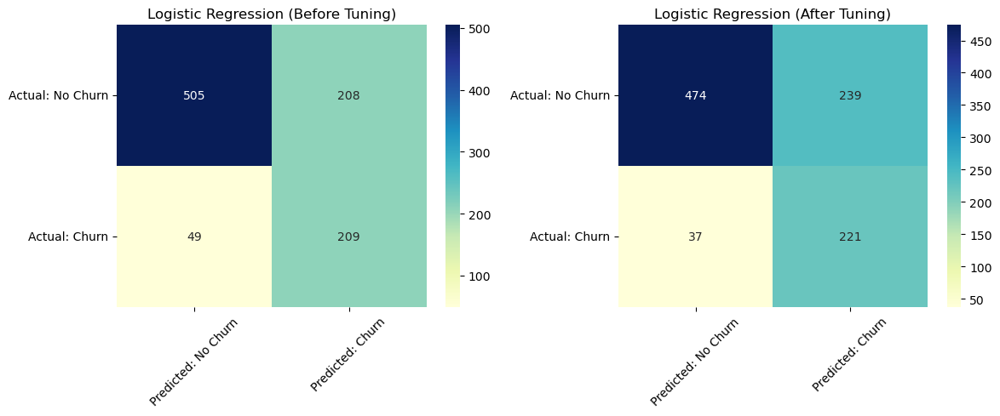

In [165]:
pipeline_before_tuning = Pipeline([
    ('preprocessing', transformer),
    ('resampler', SMOTEENN(random_state=2024)),
    ('classifier', LogisticRegression(random_state=2024))
])
pipeline_before_tuning.fit(X_train, y_train)
y_pred_before = pipeline_before_tuning.predict(X_test)

y_pred_after = best_logreg_model.predict(X_test)

conf_matrix_before = confusion_matrix(y_test, y_pred_before)
conf_matrix_after = confusion_matrix(y_test, y_pred_after)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

titles = ['Logistic Regression (Before Tuning)', 'Logistic Regression (After Tuning)']
conf_matrices = [conf_matrix_before, conf_matrix_after]

for i in range(2):
    sns.heatmap(conf_matrices[i], annot=True, fmt='d', cmap='YlGnBu',
                xticklabels=['Predicted: No Churn', 'Predicted: Churn'],
                yticklabels=['Actual: No Churn', 'Actual: Churn'],
                ax=axes[i])
    axes[i].set_title(titles[i])
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.show()

**Cost Efficiency Estimation**

Scenario Without a Machine Learning Model:
- In a non-ML approach, all customers are assumed to be at risk of churn, and the business invests $1 per person to retain all 1,214 customers.
- Total customer base = 1,214
- Churned customers = 328; Non-churned customers = 886
- Retention efforts are spread across the entire base.
- Total Expense = 1,214 × $1 = $1,214

**Scenario Using a Machine Learning Model:**

- Instead of targeting everyone, the model helps identify only those likely to churn.
- We focus retention efforts on customers predicted as churners (TP + FP).
- Customers who actually churn but weren’t predicted (FN) incur acquisition cost instead.
- Using the confusion matrix from the final tuned logistic regression model:
- True Positives (TP): 221 customers correctly flagged as at risk
- False Positives (FP): 239 wrongly flagged as churners
- False Negatives (FN): 37 customers missed by the model who ended up churning

**Estimated Costs:**

- Retention cost: $1 per customer
- Acquisition cost: $7 per customer

**Total Cost Computation:**

- Total ML Cost = (221 × $1) + (239 × $1) + (37 × $7)
- Total ML Cost = $221 + $239 + $259
- Overall Cost with ML Model = $719

**Cost Comparison & Savings:**

- Total cost without ML: $1,214
- Total cost with ML: $719

# **8. Final Model Interpretation: Logistic Regression with SMOTEENN**

**Feature importance after tuning**

,Feature,Importance
0,onehot__InternetService_Fiber optic,1.363668
1,onehot__PaperlessBilling_Yes,0.347471
2,min_max_scaler__MonthlyCharges,0.000000
3,onehot__Dependents_Yes,0.000000
4,onehot__OnlineSecurity_Yes,0.000000
5,onehot__OnlineBackup_Yes,0.000000
6,onehot__DeviceProtection_Yes,0.000000
7,onehot__TechSupport_Yes,0.000000
8,onehot__InternetService_No,-0.139752
9,onehot__Contract_One year,-0.791145


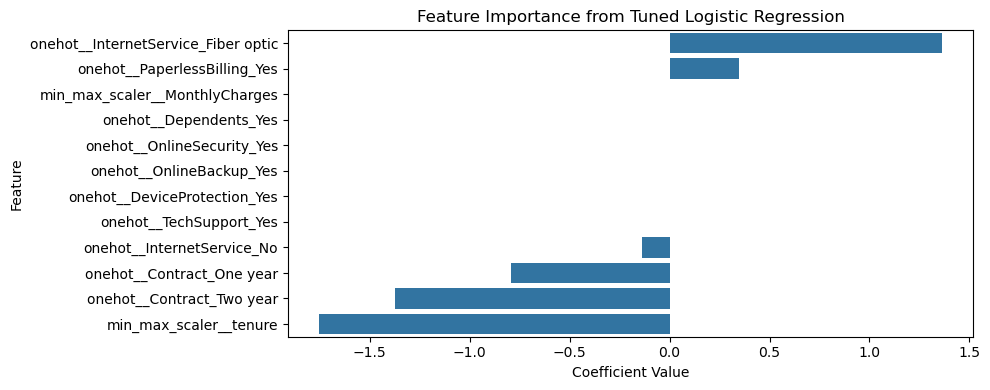

In [166]:
# Ensure the best estimator is assigned
logreg_tuning = grid_search.best_estimator_

# Transform X_test using the same transformer to get feature names
test_feature = pd.DataFrame(
    logreg_tuning.named_steps['preprocessing'].transform(X_test),
    columns=logreg_tuning.named_steps['preprocessing'].get_feature_names_out()
)

# Get coefficients from the logistic regression model inside the pipeline
coefficients = logreg_tuning.named_steps['model'].coef_[0]

# Create a DataFrame of feature importances
feature_importance = pd.DataFrame({
    'Feature': test_feature.columns,
    'Importance': coefficients
})

# Sort by absolute importance (optional: or just by value)
feature_importance = feature_importance.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Display the feature importance table
display(feature_importance)

# Plot the feature importances
plt.figure(figsize=(10, 4))
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Feature Importance from Tuned Logistic Regression')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


### Feature Importance from Tuned Logistic Regression (Recall-Oriented)

When tuning the logistic regression model for better **recall**, the goal shifts to **minimizing false negatives** — identifying as many actual churners as possible. As a result, some features with high coefficients may seem less important overall, but still contribute significantly to identifying churn patterns.

---

### Interpretation

#### Negative Influence (Features that reduce the likelihood of churn):
- **Tenure**: Customers with longer tenure are less likely to churn. The strong negative coefficient confirms that loyalty increases over time.
- **Contract Type (One year, Two year)**: Long-term contracts are associated with significantly lower churn. These customers show more commitment and satisfaction with the service.

#### Positive Influence (Features that increase the likelihood of churn):
- **Fiber Optic Internet**: The highest positive coefficient suggests customers with fiber optic service are more likely to churn — possibly due to higher expectations or pricing.
- **Paperless Billing**: Customers using paperless billing are slightly more likely to churn. This may indicate a tech-savvy user group that frequently explores alternative providers.

---

### Key Takeaway:
- The model strongly identifies **tenure** and **contract duration** as protective factors against churn.
- Meanwhile, **fiber optic service** and **paperless billing** are red flags for potential churn, possibly due to higher expectations or preferences.

---

### Why Some Features with Large Coefficients Might Not Reflect Global Feature Importance:

1. **Metric-Specific Tuning**: The model was optimized for recall, not for general accuracy or interpretability.
2. **Regularization Effects**: L1 or L2 regularization may shrink some coefficients, affecting their visibility post-tuning.
3. **Linear Nature of Logistic Regression**: Coefficients only reflect linear relationships; they might miss interaction effects or non-linear patterns.
4. **Preprocessing Impact**: Resampling methods (like SMOTEENN) may alter the distribution of data, influencing coefficient interpretation.

---
Even if some features seem less important at first glance, **tenure, contract type, and internet service** remain key drivers in predicting churn. These insights should be used to develop data-driven retention strategies targeting short-term users, fiber-optic subscribers, and digitally engaged customers.

**Predict vs Actual**

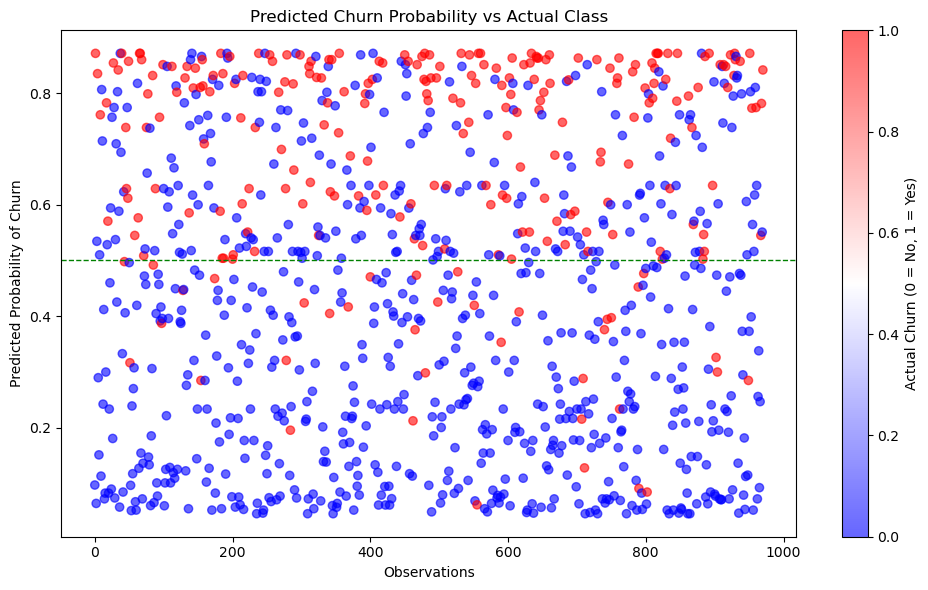

In [167]:
# Plot predicted probability vs actual churn
plt.figure(figsize=(10, 6))

# Get predicted probabilities for the positive class (churn = 1)
y_proba = logreg_tuning.predict_proba(X_test)[:, 1]

# Scatter plot with color representing actual class (0 or 1)
plt.scatter(
    x=range(len(y_proba)),
    y=y_proba,
    c=y_test.values,  # Ensure alignment
    cmap='bwr',       # Blue for 0, red for 1
    alpha=0.6
)

# Decision boundary line at 0.5
plt.axhline(y=0.5, color='green', linestyle='--', linewidth=1)

# Labels and title
plt.title('Predicted Churn Probability vs Actual Class')
plt.xlabel('Observations')
plt.ylabel('Predicted Probability of Churn')
plt.colorbar(label='Actual Churn (0 = No, 1 = Yes)')

plt.tight_layout()
plt.show()


### Predicted Probability Chart – Model's Confidence in Predicting Churn

This chart shows how confident the model is when predicting whether each customer will churn or not.

#### What the Dots Mean:
- **Red dots** = Customers who actually churned.
- **Blue dots** = Customers who stayed.
- The **higher** the dot, the more the model thinks the customer will churn.
- The **green line at 0.5** is the cutoff. If the model predicts a score above 0.5, it says "this person will churn."

#### Good Predictions:
- **Red dots near the top** of the chart = correctly predicted churn.
- **Blue dots near the bottom** = correctly predicted not churn.

#### Mistakes:
- **Red dots near the bottom** = customers who actually churned but the model missed them (false negatives).
- **Blue dots near the top** = customers who stayed but the model wrongly predicted they would churn (false positives).

#### What This Tells Us:
- Most predictions are good, especially when the model is very confident (close to 0 or 1).
- Some mistakes happen around the middle (around the 0.5 line), where the model is unsure.
- To reduce missed churners (red dots at the bottom), we may want to focus more on recall or adjust the decision threshold.

#### Final Thought:
The probability predictions show that the model generally performs well, especially for highly confident cases. To further reduce misclassification (especially **false negatives**), adjusting the threshold or further tuning the model may be beneficial.

In [168]:
#Get predicted class and probability from tuned model
y_pred = logreg_tuning.predict(X_test)
y_proba = logreg_tuning.predict_proba(X_test)[:, 1]

#Create a DataFrame using original feature set
df_test = X_test.copy()
df_test['Churn'] = y_test.values             # Actual class
df_test['Churn Prediction'] = y_pred         # Predicted class
df_test['Probability'] = y_proba             # Predicted probability
df_test['Probability Cluster'] = pd.cut(
    df_test['Probability'], 
    bins=[0, 0.25, 0.5, 0.75, 1], 
    labels=['Low', 'Medium-Low', 'Medium-High', 'High']
)

# Group and summarize by probability cluster
cluster_analysis = df_test.groupby('Probability Cluster').agg({
    'tenure': 'mean',
    'MonthlyCharges': 'mean',
    'Churn': 'mean',
    'Probability': 'mean',
    'Dependents': 'count'  # Acts as a proxy for number of cases
}).rename(columns={
    'Churn': 'Churn Rate', 
    'Dependents': 'Cases'
}).reset_index()
cluster_analysis


,Probability Cluster,tenure,MonthlyCharges,Churn Rate,Probability,Cases
0,Low,53.749175,52.865017,0.026403,0.131784,303
1,Medium-Low,33.961538,59.897596,0.139423,0.382747,208
2,Medium-High,21.111111,61.680453,0.337449,0.599340,243
3,High,12.350230,85.386636,0.640553,0.827096,217


### Customer Segmentation Based on Churn Probability

This table groups customers into 4 clusters based on their likelihood to churn, using features like tenure, monthly charges, and churn rate.

#### 1. Low Churn Probability (Cluster 0)
- **Tenure**: Longest (about 54 months)
- **Monthly Charges**: Lowest (about $53)
- **Churn Rate**: Very low (2.6%)
- **Cases**: 303 customers
- **Insight**: These are the most loyal and stable customers. They stay longer and pay less.

#### 2. Medium-Low Churn Probability (Cluster 1)
- **Tenure**: Moderate (about 34 months)
- **Monthly Charges**: Around $60
- **Churn Rate**: 13.9%
- **Cases**: 208 customers
- **Insight**: These customers show some churn risk. They’ve stayed for a while but might leave soon if not engaged.

#### 3. Medium-High Churn Probability (Cluster 2)
- **Tenure**: Shorter (about 21 months)
- **Monthly Charges**: Around $61.7
- **Churn Rate**: 33.7%
- **Cases**: 243 customers
- **Insight**: This group is more likely to churn. They don’t stay as long and pay a bit more. Retention strategies should start here.

#### 4. High Churn Probability (Cluster 3)
- **Tenure**: Very short (about 12 months)
- **Monthly Charges**: Highest (about $85)
- **Churn Rate**: Very high (64.1%)
- **Cases**: 217 customers
- **Insight**: These are the most at-risk customers. They are new and pay the most. Focused retention efforts are critical for this group.

---

### Final Takeaway:
- **Lower tenure and higher monthly charges** are linked to higher churn probability.
- These clusters help the business target the right customers with the right retention strategies based on their risk levels.

**Analyse Predict that is close to treshold**

In [169]:
# Filter customers with churn probability near the decision threshold (0.4 - 0.6)
threshold_zone = df_test[(df_test['Probability'] >= 0.4) & (df_test['Probability'] <= 0.6)]

display(
    threshold_zone.describe(),                # Numerical summary
    threshold_zone.describe(include='object') # Categorical summary
)

,tenure,MonthlyCharges,Churn,Churn Prediction,Probability
count,222.000000,222.000000,222.000000,222.000000,222.000000
mean,21.261261,52.177477,0.234234,0.576577,0.501665
std,19.775762,29.322185,0.424476,0.495218,0.053817
min,1.000000,18.800000,0.000000,0.000000,0.400279
25%,6.000000,20.900000,0.000000,0.000000,0.461516
50%,15.000000,49.875000,0.000000,1.000000,0.510154
75%,29.750000,73.387500,0.000000,1.000000,0.544982
max,71.000000,115.100000,1.000000,1.000000,0.599983


,Dependents,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling
count,222,222,222,222,222,222,222,222
unique,2,2,2,3,2,2,2,2
top,No,No,No,DSL,No,No,Month-to-month,Yes
freq,162,174,156,108,153,169,182,118


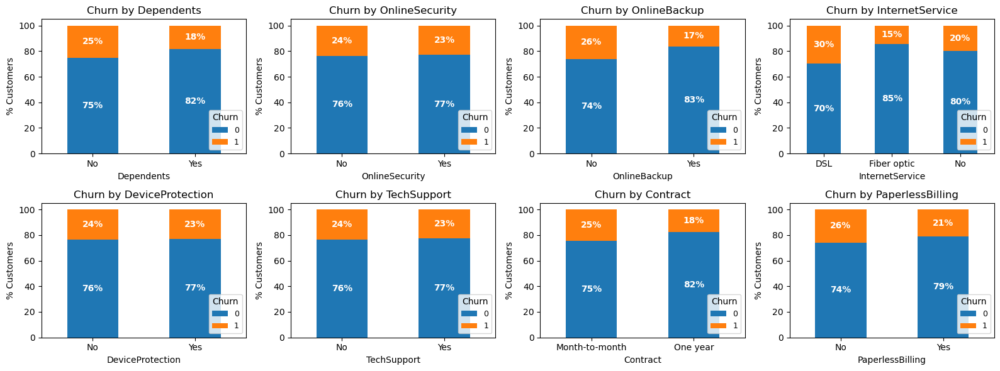

In [170]:
# Identify categorical features in the borderline group
cat_features = [col for col in threshold_zone.columns if threshold_zone[col].dtype == 'O']

plt.figure(figsize=(16, 6))
plotnumber = 1

# Loop through all categorical features in the threshold zone
for feature in cat_features:
    # Group by feature and churn status
    groupby_table = threshold_zone.groupby([feature, 'Churn']).size().unstack()

    # Create subplot
    ax = plt.subplot(2, 4, plotnumber)

    # Normalized stacked bar chart
    (groupby_table.T * 100.0 / groupby_table.T.sum()).T.plot(
        kind='bar',
        stacked=True,
        ax=ax,
        width=0.5,
        rot=0
    )

    ax.set_title(f'Churn by {feature}', fontsize=12)
    ax.set_ylabel('% Customers')
    ax.legend(loc='lower right', prop={'size': 9}, title='Churn')

    # Annotate bars with percentage labels
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(f'{height:.0f}%',
                        (p.get_x() + p.get_width() / 2.0, p.get_y() + height / 2.0),
                        ha='center', va='center',
                        color='white', weight='bold', fontsize=10)

    plotnumber += 1

plt.tight_layout()
plt.show()

### Churn Distribution by Categorical Features (Percentage-Based)

This analysis shows how churn varies based on different customer characteristics.

#### 1. Dependents
- Churn is **higher among customers without dependents** (25%) compared to those with dependents (18%).
- Customers with family responsibilities may be more loyal.

#### 2. Online Security
- Customers **without online security** churn at 24%, slightly higher than the 23% of those with it.
- Online security services may slightly help improve retention.

#### 3. Online Backup
- Customers **without online backup** have a churn rate of 26%, compared to 17% for those with backup.
- Offering backup services may help reduce churn.

#### 4. Internet Service
- **DSL users** churn at 30%, while **Fiber optic users** churn only 15%.
- Surprisingly, **customers with no internet service** churn at 20%, which is in the middle.
- Fiber optic appears to be the most stable group in this chart, though this contrasts with other charts (check consistency).

#### 5. Device Protection
- Slightly lower churn among customers with device protection (23%) than those without (24%).
- Minimal but positive impact.

#### 6. Tech Support
- Similar to above: 24% churn without tech support vs 23% with it.
- Small but steady benefit.

#### 7. Contract Type
- **Month-to-month contracts** have the highest churn (25%).
- **One-year contracts** reduce churn to 18%.
- Longer contracts are clearly linked to stronger retention.

#### 8. Paperless Billing
- Churn is **higher without paperless billing** (26%) than with it (21%).
- Digital billing customers seem slightly more loyal.

---
- Features like **having dependents, long-term contracts, online backup, and paperless billing** are all linked to **lower churn rates**.
- These features can guide the company in designing **retention strategies**, such as offering service bundles, contract extensions, or encouraging digital billing options.

In [171]:
# Summary of the borderline churn probability group
cluster_analysis_updated1 = threshold_zone.agg({
    'tenure': 'mean',
    'MonthlyCharges': 'mean',
    'Churn': 'mean',
    'Probability': 'mean',
    'Dependents': 'count'  # Used as a proxy for sample size
})

cluster_analysis_updated1


tenure             21.261261
MonthlyCharges     52.177477
Churn               0.234234
Probability         0.501665
Dependents        222.000000
dtype: float64

**Shapley Analysis**

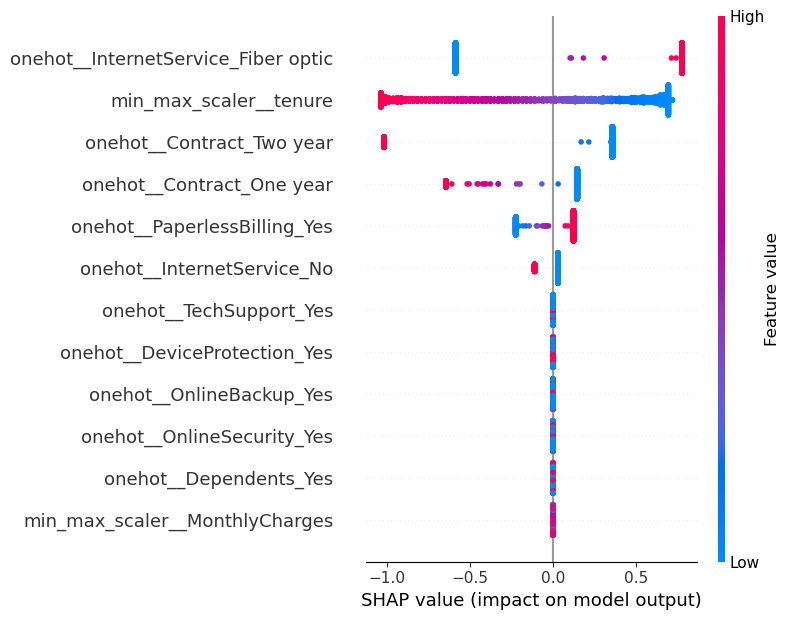

In [172]:
import shap

# Step 1: Get the trained logistic regression model from your pipeline
model = logreg_tuning.named_steps['model']

# Step 2: Use the transformed + resampled X (with same transformation as the model)
X_train_over, y_train_over = trans_resample.fit_resample(X_train, y_train)

# Step 3: Create a SHAP explainer (automatically detects linear model)
explainer = shap.Explainer(model, X_train_over)

# Step 4: Compute SHAP values
shap_values = explainer(X_train_over)

# Step 5: Plot feature importance
shap.summary_plot(shap_values, X_train_over, feature_names=transformer.get_feature_names_out())


### SHAP Value Insights – Feature Impact on Churn Prediction

The SHAP plot helps us understand which features most influence the model's decision to predict customer churn, and whether a **high or low value** for that feature **increases or decreases** the chance of churn.

#### How to Read This:
- **Right side (positive SHAP values)**: Feature pushes prediction toward **churn**.
- **Left side (negative SHAP values)**: Feature pushes prediction toward **not churn**.
- **Color**: Red = high value of that feature, Blue = low value.

---

### Key Insights:

#### 1. `InternetService_Fiber optic`
- **High impact** on predicting churn.
- Red dots (high value = has fiber optic) are mostly on the **right**, meaning:
  - Customers with **fiber optic** are more likely to churn.

#### 2. `tenure` (min_max_scaled)
- Long tenure (red dots) is mostly on the **left**, meaning:
  - Customers who’ve stayed longer are **less likely to churn**.

#### 3. `Contract_Two year` and `Contract_One year`
- These features pull predictions **strongly left** (toward not churn).
- Having a **long-term contract** is linked to **lower churn risk**.

#### 4. `PaperlessBilling_Yes`
- Red points (those who use paperless billing) appear slightly **right-shifted**:
  - Customers with **paperless billing** are **more likely to churn**.

#### 5. Other supportive features with **small positive impact**:
- Not having tech support, device protection, or online backup tends to **slightly increase churn risk**.
- These are visible as small groups of red dots on the **right** side.

---

- **Most important churn drivers**: Fiber optic service, short tenure, no long-term contract.
- **Most important retention signals**: Longer tenure, 1–2 year contracts, not having fiber optic service.
- These findings match business logic and confirm that pricing, commitment, and perceived value influence churn.

# **8. Conclusions**

## Final Model Summary

The final model selected is **Logistic Regression with SMOTEENN**, chosen for its excellent ability to identify customers at risk of churning.

### Final Performance After Hyperparameter Tuning
- **Recall**: **85.65%** (improved from 80.61% before tuning)
- **True Positives (TP)**: 221
- **False Negatives (FN)**: 37  
  > Indicates that out of all actual churners, 221 were correctly identified while only 37 were missed.

### Confusion Matrix Breakdown
|               | Predicted: No Churn | Predicted: Churn |
|---------------|---------------------|------------------|
| **Actual: No**|        428          |       239        |
| **Actual: Yes**|        37          |       221        |

### Cost Analysis
- **Without Model** (retaining all customers):  
  $1 × 1,214 = **$1,214**

- **With Model** (only act on TP + FP, acquire missed FN):  
  - Retention: (221 + 239) × $1 = $460  
  - Acquisition: 37 × $7 = $259  
  - **Total** = **$719**

> **Cost Saved** = $1,214 − $719 = **$495 (around 41%)**

---

## Insights on Customer Churn

### Factors Reducing Churn:
- **Tenure**: Longer tenure significantly reduces churn.
- **Longer Contracts**: One-year and two-year contracts strongly relate to retention.

### Factors Increasing Churn:
- **Fiber Optic Internet**: Users tend to churn more—possibly due to pricing or unmet expectations.
- **Paperless Billing**: Customers using digital billing are more likely to churn—may reflect digitally-savvy users exploring alternatives.

---

## Recommendations

### For the Business:

- **Loyalty Programs**  
  Reward customers based on tenure to boost long-term retention.

- **Promote Longer Contracts**  
  Offer discounts or benefits for users choosing one/two-year plans.

- **Review Fiber Service**  
  Investigate churn reasons among fiber users—optimize pricing or improve reliability.

- **Improve Paperless Billing Experience**  
  Make sure customers understand how to manage billing online and improve the digital UX.

- **Personalized Offers**  
  Use churn probability scores to target at-risk customers with personalized promotions.

- **Monitor Service Quality**  
  Continuously assess technical service issues and proactively resolve them.

- **Establish a Feedback Loop**  
  Implement mechanisms to gather customer feedback regularly and turn it into service improvements.

---

### For Machine Learning:

- **Test Other Models and Resampling Methods**  
  Explore more algorithms like ensemble methods or SMOTENC for categorical data.

- **Continuous Model Monitoring**  
  Retrain the model periodically as new data comes in to maintain performance.

- **Include Demographic Features**  
  Including age, occupation, or gender could improve churn predictions.

- **Enhance Minority Class Handling**  
  Keep improving churn class representation using advanced resampling strategies.

---

### For Data Collection:

- **Add Satisfaction Scores**  
  Introduce service rating columns (1-5) to directly capture satisfaction levels.

- **Enrich Customer Profiles**  
  Add demographic data like age group, marital status, or employment for deeper segmentation.

---

**Final Note**:  
Logistic Regression with SMOTEENN is not only effective in catching churners but also offers simplicity and interpretability, making it a practical choice for business implementation.


In [177]:
import pickle

# Replace with your final pipeline if it's named differently
filename = 'model.sav'

# Save the full pipeline (preprocessing + SMOTEENN + Logistic Regression)
pickle.dump(best_logreg_model, open(filename, 'wb'))